# TASK 1:

# DATA UNDERSTANDING

**IMPORTS**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip "/content/drive/MyDrive/DM-PRJ/gun-data.zip"

Archive:  /content/drive/MyDrive/DM-PRJ/gun-data.zip
  inflating: data/incidents.csv      
  inflating: data/povertyByStateYear.csv  
  inflating: data/year_state_district_house.csv  


In [ ]:
!pip install geopandas

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sn
import scipy.stats as stats
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import geopandas as gpd

In [ ]:
df_incidents = pd.read_csv('/content/data/incidents.csv')
df_poverty = pd.read_csv('/content/data/povertyByStateYear.csv')
df_districts = pd.read_csv('/content/data/year_state_district_house.csv')

pd.set_option('display.max_columns', None)

<ipython-input-4-cb106be66d2c>:1: DtypeWarning: Columns (15,16,17) have mixed types. Specify dtype option on import or set low_memory=False.
  df_incidents = pd.read_csv('/content/data/incidents.csv')


In [ ]:
df_incidents.head()

,date,state,city_or_county,address,latitude,longitude,congressional_district,state_house_district,state_senate_district,participant_age1,participant_age_group1,participant_gender1,min_age_participants,avg_age_participants,max_age_participants,n_participants_child,n_participants_teen,n_participants_adult,n_males,n_females,n_killed,n_injured,n_arrested,n_unharmed,n_participants,notes,incident_characteristics1,incident_characteristics2
0,2015-05-02,Indiana,Indianapolis,Lafayette Road and Pike Plaza,39.8322,-86.2492,7.0,94.0,33.0,19.0,Adult 18+,Male,19.0,19.0,19.0,0.0,0.0,1.0,1.0,0.0,0,1,0.0,0.0,1.0,Teen wounded while walking - Security guard at...,Shot - Wounded/Injured,NaN
1,2017-04-03,Pennsylvania,Kane,5647 US 6,41.6645,-78.7856,5.0,NaN,NaN,62.0,Adult 18+,Male,62.0,62.0,62.0,0.0,0.0,1.0,1.0,0.0,1,0,0.0,0.0,1.0,shot self after accident,"Shot - Dead (murder, accidental, suicide)",Suicide^
2,2016-11-05,Michigan,Detroit,6200 Block of East McNichols Road,42.4190,-83.0393,14.0,4.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1,0.0,1.0,2.0,1 inj.,Shot - Wounded/Injured,NaN
3,2016-10-15,District of Columbia,Washington,"1000 block of Bladensburg Road, NE",38.9030,-76.9820,1.0,NaN,NaN,NaN,Adult 18+,Male,248339,707477,761203,0.0,0.0,1.0,1.0,0.0,0,1,0.0,0.0,2.0,NaN,Shot - Wounded/Injured,NaN
4,2030-06-14,Pennsylvania,Pittsburgh,California and Marshall Avenues,40.4621,-80.0308,14.0,NaN,NaN,NaN,Adult 18+,Male,NaN,NaN,NaN,0.0,0.0,1.0,1.0,0.0,0,1,0.0,1.0,2.0,NaN,Shot - Wounded/Injured,"Drive-by (car to street, car to car)"


In [ ]:
df_poverty

,state,year,povertyPercentage
0,United States,2020,11.5
1,Alabama,2020,14.8
2,Alaska,2020,11.5
3,Arizona,2020,12.1
4,Arkansas,2020,15.8
...,...,...,...
879,Virginia,2004,9.1
880,Washington,2004,9.8
881,West Virginia,2004,15.0
882,Wisconsin,2004,10.9


In [ ]:
df_districts

,year,state,congressional_district,party,candidatevotes,totalvotes
0,1976,ALABAMA,1,REPUBLICAN,98257,157170
1,1976,ALABAMA,2,REPUBLICAN,90069,156362
2,1976,ALABAMA,3,DEMOCRAT,106935,108048
3,1976,ALABAMA,4,DEMOCRAT,141490,176022
4,1976,ALABAMA,5,DEMOCRAT,113553,113560
...,...,...,...,...,...,...
10436,2022,WISCONSIN,5,REPUBLICAN,243741,378523
10437,2022,WISCONSIN,6,REPUBLICAN,239231,251999
10438,2022,WISCONSIN,7,REPUBLICAN,209224,338268
10439,2022,WISCONSIN,8,REPUBLICAN,223981,310196


INFORMATIONS ABOUT THE DATASETS, WE CAN ALREADY SEE THE PRESENCE OF NaN VALUES

In [ ]:
df_incidents.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 239677 entries, 0 to 239676
Data columns (total 28 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   date                       239677 non-null  object 
 1   state                      239677 non-null  object 
 2   city_or_county             239677 non-null  object 
 3   address                    223180 non-null  object 
 4   latitude                   231754 non-null  float64
 5   longitude                  231754 non-null  float64
 6   congressional_district     227733 non-null  float64
 7   state_house_district       200905 non-null  float64
 8   state_senate_district      207342 non-null  float64
 9   participant_age1           147379 non-null  float64
 10  participant_age_group1     197558 non-null  object 
 11  participant_gender1        203315 non-null  object 
 12  min_age_participants       164879 non-null  object 
 13  avg_age_participants       16

INFORMATIONS ABOUT THE NUMBER OF INCIDENTS FOR EACH STATE

In [ ]:
df_incidents.state.value_counts()

Illinois                17556
California              16306
Florida                 15029
Texas                   13577
Ohio                    10244
New York                 9712
Pennsylvania             8929
Georgia                  8925
North Carolina           8739
Louisiana                8103
Tennessee                7626
South Carolina           6939
Missouri                 6631
Michigan                 6136
Massachusetts            5981
Virginia                 5949
Indiana                  5852
Maryland                 5798
Alabama                  5471
New Jersey               5387
Wisconsin                4787
Kentucky                 4157
Mississippi              3599
Oklahoma                 3455
Washington               3434
Colorado                 3201
District of Columbia     3195
Connecticut              3067
Arkansas                 2842
Iowa                     2517
Minnesota                2408
Arizona                  2328
Oregon                   2286
Kansas    

FUNCTION TO OBTAIN SOME STATISTICS

In [ ]:
# UTILS
def get_stats(attribute,df):
    stats = df[attribute].describe(datetime_is_numeric=True)
    stats["missing"] = df[attribute].isna().sum()
    return stats


SUMMARY OF NULL VALUES FOR EACH ATTRIBUTE



In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.io as pio
import plotly.graph_objects as go


# Set the plotting backend to Plotly
pd.options.plotting.backend = 'plotly'
pio.templates.default = "seaborn"

# Function to create a missing values bar plot for a given DataFrame
def plot_missing_values(df, title):
    # Create a DataFrame with missing values count
    x = pd.DataFrame(df.isna().sum())
    x.rename(columns={0: 'Missing values'}, inplace=True)
    x.index.name = 'Feature'
    x.reset_index(inplace=True)

    # Create a bar plot
    fig = px.bar(x, x="Feature", y="Missing values", log_y=True, title=title)

    # Customize layout
    fig.update_layout(
        xaxis_dtick=1,
        xaxis_tickangle=45
    )

    # Show the plot
    fig.show()

# Plot missing values for df_incidents
plot_missing_values(df_incidents, "Missing Values in df_incidents")

# Plot missing values for df_poverty
plot_missing_values(df_poverty, "Missing Values in df_poverty")

# Plot missing values for df_districts
plot_missing_values(df_districts, "Missing Values in df_districts")

DESCRIPTION OF MANY STATISTICS ABOUT EVERY COLUMN SUCH AS THE NUMBER OF UNIQUE VALUES IN EAECH COLUMN, THE VALUE OCCURRING MORE IN EACH COLUMN,THE NUMBER OF OCCURRENCES THE TOP FEATURE HAS ECC...

AS WE PREVIOUSLY SAW ILLINOIS IS THE STATE WITH THE HIGHEST NUMBER OF INCIDENTS AND IN PARTICULAR "CHICAGO" IS THE CITY WITH THE MOST NUMBER OF INCIDENTS

In [ ]:
df_incidents.describe(include="all", datetime_is_numeric=True)

,date,state,city_or_county,address,latitude,longitude,congressional_district,state_house_district,state_senate_district,participant_age1,participant_age_group1,participant_gender1,min_age_participants,avg_age_participants,max_age_participants,n_participants_child,n_participants_teen,n_participants_adult,n_males,n_females,n_killed,n_injured,n_arrested,n_unharmed,n_participants,notes,incident_characteristics1,incident_characteristics2
count,239677,239677,239677,223180,231754.000000,231754.000000,227733.000000,200905.000000,207342.00000,147379.000000,197558,203315,164879,165057,164969,197573,197578,197575.0,203315.000000,203315.000000,239677.000000,239677.000000,212051.000000,212051.000000,239677.000000,158660,239351,141931
unique,2437,51,12898,198037,NaN,NaN,NaN,NaN,NaN,NaN,3,3,12673,12869,12852,32,42,70.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,136652,52,90
top,2017-01-01,Illinois,Chicago,2375 International Pkwy,NaN,NaN,NaN,NaN,NaN,NaN,Adult 18+,Male,19.0,22.0,24.0,0.0,0.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,man shot,Shot - Wounded/Injured,Officer Involved Incident
freq,342,17556,10814,160,NaN,NaN,NaN,NaN,NaN,NaN,181324,177945,7981,7606,6237,105933,104989,62938.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,501,93926,13881
mean,NaN,NaN,NaN,NaN,37.546598,-89.338348,8.001265,55.447132,20.47711,30.295707,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.520252,0.212340,0.252290,0.494007,0.468439,0.494169,1.636895,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,5.130763,14.359546,8.480835,42.048117,14.20456,13.363592,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.996767,0.490888,0.521779,0.729952,0.851035,0.925566,1.252514,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN,19.111400,-171.429000,0.000000,1.000000,1.00000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN,33.903400,-94.158725,2.000000,21.000000,9.00000,21.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,NaN,NaN,NaN
50%,NaN,NaN,NaN,NaN,38.570600,-86.249600,5.000000,47.000000,19.00000,27.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,NaN,NaN,NaN
75%,NaN,NaN,NaN,NaN,41.437375,-80.048625,10.000000,84.000000,30.00000,37.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.000000,0.000000,0.000000,1.000000,1.000000,1.000000,2.000000,NaN,NaN,NaN


THE GET STATS FUNCTION EXTRACTS SOME INFORMATIONS ABOUT A SPECIFIC COLUMN OF THE DATAFRAME

In [ ]:
print(get_stats("state", df_incidents))

count        239677
unique           51
top        ILLINOIS
freq          17556
missing           0
Name: state, dtype: object


NUMBER OF INCIDENTS FOR EACH STATE

In [ ]:
incident_number = df_incidents['state'].value_counts()
incident_number.plot(kind='bar')

Here we can find the number of incidents sorted in descending order, starting by the city with the highest number of crimes which is Chicago, obviously in Illinois which we found to be the state with the most crimes

In [ ]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
city_counts = df_incidents.groupby(['state', 'city_or_county']).size().reset_index(name='incident_count')
city_counts.sort_values(by=['incident_count'],ascending=False).head(10)

,state,city_or_county,incident_count
4070,Illinois,Chicago,10814
6592,Maryland,Baltimore,3943
2524,District of Columbia,Washington,3189
6191,Louisiana,New Orleans,3070
13500,Pennsylvania,Philadelphia,2929
8840,Missouri,Saint Louis,2498
17289,Wisconsin,Milwaukee,2487
15163,Texas,Houston,2480
14613,Tennessee,Memphis,2384
2815,Florida,Jacksonville,2317


In [ ]:
df_incidents['state'] = df_incidents['state'].str.upper()

In [ ]:
# Dizionario dei codici statali
state_abbreviations = {
    'ALABAMA': 'AL', 'ALASKA': 'AK', 'ARIZONA': 'AZ', 'ARKANSAS': 'AR',
    'CALIFORNIA': 'CA', 'COLORADO': 'CO', 'CONNECTICUT': 'CT', 'DELAWARE': 'DE',
    'FLORIDA': 'FL', 'GEORGIA': 'GA', 'HAWAII': 'HI', 'IDAHO': 'ID',
    'ILLINOIS': 'IL', 'INDIANA': 'IN', 'IOWA': 'IA', 'KANSAS': 'KS',
    'KENTUCKY': 'KY', 'LOUISIANA': 'LA', 'MAINE': 'ME', 'MARYLAND': 'MD',
    'MASSACHUSETTS': 'MA', 'MICHIGAN': 'MI', 'MINNESOTA': 'MN', 'MISSISSIPI': 'MS',
    'MISSOURI': 'MO', 'MONTANA': 'MT', 'NEBRASKA': 'NE', 'NEVADA': 'NV',
    'NEW HAMPSHIRE': 'NH', 'NEW JERSEY': 'NJ', 'NEW MEXICO': 'NM', 'NEW YORK': 'NY',
    'NORTH CAROLINA': 'NC', 'NORTH DAKOTA': 'ND', 'OHIO': 'OH', 'OKLAHOMA': 'OK',
    'OREGON': 'OR', 'PENNSYLVANIA': 'PA', 'RHODE ISLAND': 'RI', 'SOUTH CAROLINA': 'SC',
    'SOUTH DAKOTA': 'SD', 'TENNESSEE': 'TN', 'TEXAS': 'TX', 'UTAH': 'UT',
    'VERMONT': 'VT', 'VIRGINIA': 'VA', 'WASHINGTON': 'WA', 'WEST VIRGINIA': 'WV',
    'WISCONSIN': 'WI', 'WYOMING': 'WY'
}

# Aggiungo la colonna con i codici statali usando il dizionario per la mappatura
df_incidents['state_code'] = df_incidents['state'].map(state_abbreviations)

In [ ]:
state_counts = df_incidents['state'].value_counts().reset_index()
state_counts.columns = ['state','Incident Count']
state_counts['state_code'] = state_counts['state'].map(state_abbreviations)
state_counts

,state,Incident Count,state_code
0,ILLINOIS,17556,IL
1,CALIFORNIA,16306,CA
2,FLORIDA,15029,FL
3,TEXAS,13577,TX
4,OHIO,10244,OH
5,NEW YORK,9712,NY
6,PENNSYLVANIA,8929,PA
7,GEORGIA,8925,GA
8,NORTH CAROLINA,8739,NC
9,LOUISIANA,8103,LA


IN THE FOLLOWING PLOT WE CAN SEE DI DISTRIBUTION OF INCIDENTS

In [ ]:
import plotly.express as px
import pandas as pd


# Load the USA map from Plotly
fig = px.choropleth(
    state_counts,
    locations='state_code',
    locationmode='USA-states',
    color='Incident Count',
    scope="usa",
    color_continuous_scale="Blues",
    title='Distribution of Incidents by State'
)

# Show the plot
fig.show()

In [ ]:
district_df = df_incidents[['state', 'city_or_county', 'congressional_district', 'state_house_district', 'state_senate_district']]
district_df.head()

,state,city_or_county,congressional_district,state_house_district,state_senate_district
0,INDIANA,Indianapolis,7.0,94.0,33.0
1,PENNSYLVANIA,Kane,5.0,NaN,NaN
2,MICHIGAN,Detroit,14.0,4.0,2.0
3,DISTRICT OF COLUMBIA,Washington,1.0,NaN,NaN
4,PENNSYLVANIA,Pittsburgh,14.0,NaN,NaN


INFO ABOUT THE DISTRICTS THE INCIDENTS TOOK PLACE IN

In [ ]:
district_counts = district_df.groupby(['state',
                                       'city_or_county',
                                       'congressional_district',
                                       'state_house_district',
                                       'state_senate_district']).size().reset_index(name='incident_count')

district_counts = district_counts.sort_values(by=['incident_count'],ascending=False)

In [ ]:
district_counts.head(10)

,state,city_or_county,congressional_district,state_house_district,state_senate_district,incident_count
2483,CALIFORNIA,Oakland,13.0,18.0,9.0,1304
7556,ILLINOIS,Chicago,7.0,10.0,5.0,1225
10897,MARYLAND,Baltimore,7.0,40.0,40.0,1108
7555,ILLINOIS,Chicago,7.0,9.0,5.0,879
8072,ILLINOIS,Peoria,17.0,92.0,46.0,805
17819,OHIO,Dayton,10.0,39.0,5.0,729
4685,FLORIDA,Jacksonville,5.0,13.0,9.0,699
7554,ILLINOIS,Chicago,7.0,8.0,4.0,690
14310,NEW JERSEY,Trenton,12.0,15.0,15.0,673
8128,ILLINOIS,Rockford,17.0,67.0,34.0,646


In [ ]:
chicago_districts = district_counts[district_counts['city_or_county'] == 'Chicago']
chicago_districts.sort_values(by=['incident_count'],ascending=False).head(10)

,state,city_or_county,congressional_district,state_house_district,state_senate_district,incident_count
7556,ILLINOIS,Chicago,7.0,10.0,5.0,1225
7555,ILLINOIS,Chicago,7.0,9.0,5.0,879
7554,ILLINOIS,Chicago,7.0,8.0,4.0,690
7552,ILLINOIS,Chicago,7.0,6.0,3.0,576
7487,ILLINOIS,Chicago,1.0,31.0,16.0,419
7485,ILLINOIS,Chicago,1.0,27.0,14.0,413
7480,ILLINOIS,Chicago,1.0,5.0,3.0,380
7551,ILLINOIS,Chicago,7.0,5.0,3.0,370
7488,ILLINOIS,Chicago,1.0,32.0,16.0,337
7494,ILLINOIS,Chicago,2.0,25.0,13.0,295


WE CAN ALREADY SEE THE PRESENCE OF 0 VALUES IN CONGRESSIONAL DISTRICT THAT NEED TO BE HANDLED

In [ ]:
congressionaldistrict_occurrences = df_incidents['congressional_district'].value_counts()
pd.set_option('display.max_rows', None)

print(congressionaldistrict_occurrences)

1.0     36910
2.0     26945
3.0     20621
7.0     19709
4.0     18469
5.0     16512
9.0      9867
6.0      9388
8.0      7353
13.0     6175
12.0     5770
10.0     5606
11.0     5260
14.0     4291
17.0     2925
16.0     2842
18.0     2614
20.0     2600
24.0     2042
15.0     1943
26.0     1847
19.0     1701
27.0     1425
22.0     1424
25.0     1354
23.0     1305
21.0     1276
35.0     1135
30.0      788
31.0      773
29.0      727
36.0      659
33.0      522
28.0      497
0.0       421
44.0      421
32.0      361
34.0      337
43.0      314
47.0      292
37.0      266
46.0      251
38.0      249
40.0      235
51.0      228
41.0      211
52.0      158
53.0      130
48.0      119
42.0      118
50.0      116
49.0      100
39.0       86
45.0       45
Name: congressional_district, dtype: int64


TRANSFORM YEARS 2030, 2029, 2028 IN 2020, 2019, 2018

In [ ]:
import pandas as pd

df_incidents['date'] = pd.to_datetime(df_incidents['date'])

# Replace years 2030, 2029, 2028 with 2020, 2019, 2018 respectively
df_incidents['date'] = df_incidents['date'].apply(lambda x: x.replace(year=x.year - 10) if x.year in [2030, 2029, 2028] else x)

print("Highest Date:", df_incidents['date'].max())
print("Lowest Date:", df_incidents['date'].min())

Highest Date: 2020-11-28 00:00:00
Lowest Date: 2013-01-01 00:00:00


NUMBER OF INCIDENTS FOR EACH DATE

In [ ]:
#Comment the first row and uncomment the second if you want to keep the day in the dates

#df_incidents['date'] = pd.to_datetime(df_incidents['date']).dt.to_period('M')
df_incidents['date'] = pd.to_datetime(df_incidents['date'])
date_occurrences = df_incidents['date'].value_counts()
pd.set_option('display.max_rows', None)

date_occurrences.head(10)

2017-01-01    342
2017-07-04    248
2017-05-28    242
2018-01-01    242
2016-08-28    230
2017-04-16    229
2016-08-21    227
2016-07-04    224
2017-04-22    222
2016-01-01    221
Name: date, dtype: int64

  NUMBER OF INCIDENTS FOR EACH PARTICIPANT AGE, WE CAN ALREADY SEE HOW THE THE AGES AROUND 20 AND 25 ARE VERY COMMON, THERE ARE ALSO SOME VALUES LIKE 311 THAT ARE NOT POSSIBLE AND WILL LATER BE HANDLED

In [ ]:
participant_age1_occurrences = df_incidents['participant_age1'].value_counts()
pd.set_option('display.max_rows', None)

print(participant_age1_occurrences)

19.0     6842
20.0     6574
22.0     6552
21.0     6513
18.0     6483
23.0     6466
24.0     6394
25.0     5964
26.0     5529
27.0     5112
17.0     4693
28.0     4603
29.0     4355
30.0     4090
31.0     3754
32.0     3694
33.0     3494
34.0     3310
16.0     3228
35.0     3203
36.0     2753
37.0     2649
38.0     2381
39.0     2084
40.0     2075
15.0     2047
41.0     1751
42.0     1626
43.0     1615
44.0     1526
45.0     1477
46.0     1307
47.0     1260
48.0     1252
14.0     1203
50.0     1160
49.0     1125
52.0     1052
51.0     1043
53.0      967
54.0      928
55.0      887
56.0      782
57.0      726
13.0      704
58.0      644
60.0      617
59.0      612
61.0      531
62.0      484
63.0      417
12.0      379
65.0      357
64.0      341
3.0       305
67.0      304
66.0      296
68.0      271
11.0      268
4.0       258
71.0      250
70.0      249
10.0      235
69.0      234
2.0       232
7.0       220
9.0       214
5.0       210
8.0       208
6.0       188
72.0      163
73.0  

INCIDENTS CHARATERISTICS1

THE MAJORITY OF THE INCIDENTS ARE SHOOTING INCIDENTS WHERE SOMEONE GOT WOUNDED FOLLOWED BY SHOOTING INCIDENTS WHERE SOMEONE DIED, THEN WE CAN FIND NON SHOOTING INCIDENT AND THEN SHHOTING INCIDENTS WITH NO INJURIES, ALL THE OTHER VALUES ARE WAY LESS COMMON

In [ ]:
nunique_values = df_incidents['incident_characteristics1'].nunique()
incidents_occurrences = df_incidents['incident_characteristics1'].value_counts()

print(f'There are {nunique_values} possible values')
print('//////////////////////////////////////////////////////////////////////////////////')
print(incidents_occurrences)

There are 52 possible values
//////////////////////////////////////////////////////////////////////////////////
Shot - Wounded/Injured                                                                                  93926
Shot - Dead (murder, accidental, suicide)                                                               45054
Non-Shooting Incident                                                                                   41541
Shots Fired - No Injuries                                                                               33949
Armed robbery with injury/death and/or evidence of DGU found                                             7528
Institution/Group/Business                                                                               4316
TSA Action                                                                                               2653
Brandishing/flourishing/open carry/lost/found                                                            1350
Home Inv

INCIDENTS CHARATERISTICS2

In [ ]:
nunique_values = df_incidents['incident_characteristics2'].nunique()
incidents_occurrences2 = df_incidents['incident_characteristics2'].value_counts()

print(f'There are {nunique_values} possible values')
print('//////////////////////////////////////////////////////////////////////////////////')
pd.set_option('display.max_rows', None)
print(incidents_occurrences2)

There are 90 possible values
//////////////////////////////////////////////////////////////////////////////////
Officer Involved Incident                                                                               13881
Drive-by (car to street, car to car)                                                                    11873
Drug involvement                                                                                        11717
Home Invasion                                                                                            8664
Shot - Dead (murder, accidental, suicide)                                                                8345
Armed robbery with injury/death and/or evidence of DGU found                                             6438
Possession (gun(s) found during commission of other crimes)                                              6084
ATF/LE Confiscation/Raid/Arrest                                                                          5916
Accident

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sn
import scipy.stats as stats
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import geopandas as gpd

In [ ]:
df = pd.read_csv('/content/data/year_state_district_house.csv')

CHECK FOR ALL THE POSSIBLE VALUES IN EACH ATTRIBUTE

In [ ]:
print(df['party'].unique())
print(df['year'].unique())
print(df['congressional_district'].unique())

['REPUBLICAN' 'DEMOCRAT' 'FOGLIETTA (DEMOCRAT)' 'DEMOCRATIC-FARMER-LABOR'
 'INDEPENDENT' 'INDEPENDENT-REPUBLICAN']
[1976 1978 1980 1982 1984 1986 1988 1990 1992 1994 1996 1998 2000 2002
 2004 2006 2008 2010 2012 2014 2016 2018 2020 2022]
[ 1  2  3  4  5  6  7  0  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53]


In [ ]:
unique_state = df['state'].unique()
total_state = df['state'].count()

print(len(unique_state))
#verificare se gli stati unici sono correttamente tutti stati americani
print(unique_state)
print(total_state)

51
['ALABAMA' 'ALASKA' 'ARIZONA' 'ARKANSAS' 'CALIFORNIA' 'COLORADO'
 'CONNECTICUT' 'DELAWARE' 'FLORIDA' 'GEORGIA' 'HAWAII' 'IDAHO' 'ILLINOIS'
 'INDIANA' 'IOWA' 'KANSAS' 'KENTUCKY' 'LOUISIANA' 'MAINE' 'MARYLAND'
 'MASSACHUSETTS' 'MICHIGAN' 'MINNESOTA' 'MISSISSIPPI' 'MISSOURI' 'MONTANA'
 'NEBRASKA' 'NEVADA' 'NEW HAMPSHIRE' 'NEW JERSEY' 'NEW MEXICO' 'NEW YORK'
 'NORTH CAROLINA' 'NORTH DAKOTA' 'OHIO' 'OKLAHOMA' 'OREGON' 'PENNSYLVANIA'
 'RHODE ISLAND' 'SOUTH CAROLINA' 'SOUTH DAKOTA' 'TENNESSEE' 'TEXAS' 'UTAH'
 'VERMONT' 'VIRGINIA' 'WASHINGTON' 'WEST VIRGINIA' 'WISCONSIN' 'WYOMING'
 'DISTRICT OF COLUMBIA']
10441


In [ ]:
def is_us_state(input_string):
    us_states = {
        'Alabama', 'Alaska', 'Arizona', 'Arkansas', 'California', 'Colorado',
        'Connecticut', 'Delaware', 'Florida', 'Georgia', 'Hawaii', 'Idaho',
        'Illinois', 'Indiana', 'Iowa', 'Kansas', 'Kentucky', 'Louisiana',
        'Maine', 'Maryland', 'Massachusetts', 'Michigan', 'Minnesota',
        'Mississippi', 'Missouri', 'Montana', 'Nebraska', 'Nevada',
        'New Hampshire', 'New Jersey', 'New Mexico', 'New York',
        'North Carolina', 'North Dakota', 'Ohio', 'Oklahoma', 'Oregon',
        'Pennsylvania', 'Rhode Island', 'South Carolina', 'South Dakota',
        'Tennessee', 'Texas', 'Utah', 'Vermont', 'Virginia', 'Washington',
        'West Virginia', 'Wisconsin', 'Wyoming'
    }
    return input_string in us_states

In [ ]:
#verificare se il numero di voti è maggiore del totale voti

# df_filtered = df.query('party in ("FOGLIETTA (DEMOCRAT)","INDEPENDENT-REPUBLICAN", "INDEPENDENT")')

# df_filtered

df_state_filtered = df.query('state == "DISTRICT OF COLUMBIA"')

df_state_filtered
filtro = df['state'] == 'DISTRICT OF COLUMBIA'

df = df[~filtro]
df
unique_state = df['state'].unique()
print (len(unique_state))

50


In [ ]:
df_filtered = df.query('party == "INDEPENDENT"')
print (len(df_filtered))
print (df_filtered)

10
      year     state  congressional_district        party  candidatevotes  \
3447  1990   VERMONT                       0  INDEPENDENT          117522   
3881  1992   VERMONT                       0  INDEPENDENT          162724   
4316  1994   VERMONT                       0  INDEPENDENT          105502   
4579  1996  MISSOURI                       8  INDEPENDENT          112472   
4751  1996   VERMONT                       0  INDEPENDENT          140678   
5186  1998   VERMONT                       0  INDEPENDENT          136403   
5621  2000   VERMONT                       0  INDEPENDENT          196118   
5626  2000  VIRGINIA                       5  INDEPENDENT          143312   
6057  2002   VERMONT                       0  INDEPENDENT          144880   
6492  2004   VERMONT                       0  INDEPENDENT          205774   

      totalvotes  
3447      209856  
3881      281162  
4316      211449  
4579      222854  
4751      254706  
5186      215133  
5621      283366

In [ ]:
# unisco i dati dei partiti minoritari oppure non considerarli
df_filtered = df.query('congressional_district== 7 and state =="ILLINOIS"')
df_filtered

#calcolo il partito vincente per anno

,year,state,congressional_district,party,candidatevotes,totalvotes
106,1976,ILLINOIS,7,DEMOCRAT,88239,104094
541,1978,ILLINOIS,7,DEMOCRAT,64716,74989
976,1980,ILLINOIS,7,DEMOCRAT,80056,94097
1419,1982,ILLINOIS,7,DEMOCRAT,133978,154974
1854,1984,ILLINOIS,7,DEMOCRAT,135493,172908
2289,1986,ILLINOIS,7,DEMOCRAT,90761,113164
2724,1988,ILLINOIS,7,DEMOCRAT,135331,135331
3159,1990,ILLINOIS,7,DEMOCRAT,80021,100120
3607,1992,ILLINOIS,7,DEMOCRAT,182811,225281
4042,1994,ILLINOIS,7,DEMOCRAT,93457,117468


In [ ]:
import plotly.express as px
import pandas as pd
import matplotlib
import geopandas as gpd

df = pd.read_csv('/content/data/year_state_district_house.csv')

# Dizionario dei codici statali
state_abbreviations = {
    'ALABAMA': 'AL', 'ALASKA': 'AK', 'ARIZONA': 'AZ', 'ARKANSAS': 'AR',
    'CALIFORNIA': 'CA', 'COLORADO': 'CO', 'CONNECTICUT': 'CT', 'DELAWARE': 'DE',
    'FLORIDA': 'FL', 'GEORGIA': 'GA', 'HAWAII': 'HI', 'IDAHO': 'ID',
    'ILLINOIS': 'IL', 'INDIANA': 'IN', 'IOWA': 'IA', 'KANSAS': 'KS',
    'KENTUCKY': 'KY', 'LOUISIANA': 'LA', 'MAINE': 'ME', 'MARYLAND': 'MD',
    'MASSACHUSETTS': 'MA', 'MICHIGAN': 'MI', 'MINNESOTA': 'MN', 'MISSISSIPI': 'MS',
    'MISSOURI': 'MO', 'MONTANA': 'MT', 'NEBRASKA': 'NE', 'NEVADA': 'NV',
    'NEW HAMPSHIRE': 'NH', 'NEW JERSEY': 'NJ', 'NEW MEXICO': 'NM', 'NEW YORK': 'NY',
    'NORTH CAROLINA': 'NC', 'NORTH DAKOTA': 'ND', 'OHIO': 'OH', 'OKLAHOMA': 'OK',
    'OREGON': 'OR', 'PENNSYLVANIA': 'PA', 'RHODE ISLAND': 'RI', 'SOUTH CAROLINA': 'SC',
    'SOUTH DAKOTA': 'SD', 'TENNESSEE': 'TN', 'TEXAS': 'TX', 'UTAH': 'UT',
    'VERMONT': 'VT', 'VIRGINIA': 'VA', 'WASHINGTON': 'WA', 'WEST VIRGINIA': 'WV',
    'WISCONSIN': 'WI', 'WYOMING': 'WY'
}

# Aggiungo la colonna con i codici statali usando il dizionario per la mappatura
df['state_code'] = df['state'].map(state_abbreviations)

# Raggruppiamo per anno e partito e sommiamo i voti
votes_per_year_party = df.groupby(['year', 'state_code','party'])['candidatevotes'].sum().reset_index()

# Calcoliamo il totale dei voti per anno
total_votes_per_year = df.groupby('year')['candidatevotes'].sum().reset_index()

# Merge the total votes back to our votes_per_year_party dataframe
votes_per_year_party = votes_per_year_party.merge(total_votes_per_year, on='year', suffixes=('', '_total'))

# Calcoliamo la percentuale dei voti per partito per anno
votes_per_year_party['percentage_of_votes'] = (votes_per_year_party['candidatevotes'] / votes_per_year_party['candidatevotes_total']) * 100

# Ordiniamo i risultati per anno e poi per percentuale di voti in ordine decrescente
votes_per_year_party.sort_values(by=['year', 'percentage_of_votes'], ascending=[True, False], inplace=True)

# Selezioniamo solo le colonne d'interesse per una presentazione più pulita
votes_per_year_party = votes_per_year_party[['year', 'state_code', 'party', 'candidatevotes']]

print(votes_per_year_party)


#state_counts = votes_per_year_party[votes_per_year_party['year'] == '1976']

#state_counts.columns = ['State', 'candidatevotes']

# Load the USA map from Plotly
fig = px.choropleth(
    votes_per_year_party,
    locations='state_code',
    locationmode='USA-states',
    color='candidatevotes',
    hover_name='state_code',   # Colonna per i dettagli al passaggio del mouse
    hover_data={"year": True, "party": True, "candidatevotes": True, "state_code": False},
    scope="usa",
    color_continuous_scale="Blues",
    title='Distribution of Votes by State'
)

#Menu' a tendina per selezionare il partito
fig.update_layout(
    updatemenus=[
        dict(
            buttons=list([
                dict(
                    args=[{"z": [votes_per_year_party.loc[votes_per_year_party['party'] == party, 'candidatevotes']]}],
                    label=party,
                    method="restyle"
                ) for party in votes_per_year_party['party'].unique()
            ]),
            direction="down",
            pad={"r": 10, "t": 10},
            showactive=True,
            x=0.1,
            xanchor="left",
            y=1.15,
            yanchor="top"
        ),
    ]
)

# Aggiungere uno slider per l'animazione
fig.update_layout(
    sliders=[{
        'steps': [{
            'method': 'animate',
            'label': str(year),
            'args': [[year], {'frame': {'duration': 300, 'redraw': True}, 'mode': 'immediate'}]
        } for year in votes_per_year_party['year'].unique()]
    }]
)

# Show the plot
fig.show()

      year state_code                    party  candidatevotes
7     1976         CA                 DEMOCRAT         3070977
56    1976         NY                 DEMOCRAT         2438279
71    1976         TX                 DEMOCRAT         2308473
63    1976         PA                 DEMOCRAT         1910292
8     1976         CA               REPUBLICAN         1768211
22    1976         IL               REPUBLICAN         1514098
21    1976         IL                 DEMOCRAT         1456808
59    1976         OH               REPUBLICAN         1435337
31    1976         MA                 DEMOCRAT         1431340
57    1976         NY               REPUBLICAN         1336759
51    1976         NJ                 DEMOCRAT         1250095
36    1976         MI                 DEMOCRAT         1230016
58    1976         OH                 DEMOCRAT         1066017
80    1976         WI                 DEMOCRAT         1024866
64    1976         PA               REPUBLICAN         

POVERTY DISTRIBUTION

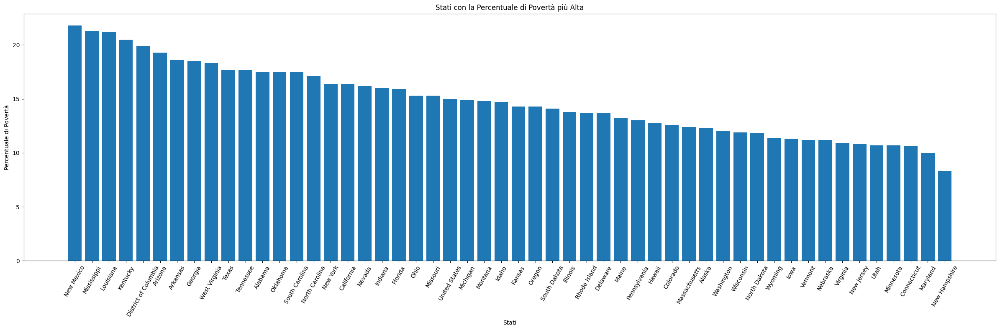

In [ ]:
df_poverty = df_poverty.sort_values(by='povertyPercentage', ascending = False)
# Seleziona il numero desiderato di righe principali.
top_states = df_poverty.head(884)
plt.figure(figsize=(24, 8))
plt.bar(top_states['state'], top_states['povertyPercentage'])
plt.xlabel('Stati')
plt.ylabel('Percentuale di Povertà')
plt.title('Stati con la Percentuale di Povertà più Alta')
plt.xticks(rotation=60)
plt.tight_layout()
plt.show()

In [ ]:
nan_count = df_poverty['povertyPercentage'].isna().sum()
print("Numero di valori NaN in povertyPercentage:", nan_count)

Numero di valori NaN in povertyPercentage: 52


In [ ]:
# Crea una lista per tenere traccia degli stati con almeno un NaN.
states_with_nan = []

for state in df_poverty['state'].unique():
    state_df = df_poverty[df_poverty['state'] == state]
    if state_df['povertyPercentage'].isna().any():
        states_with_nan.append(state)

# Stampa gli stati con almeno un NaN.
if len(states_with_nan) > 2:
    print("Stati con almeno 1 NaN:")
    for state in states_with_nan:
        print(state)
else:
    print("Nessun stato ha almeno un NaN.")
  #tutti gli stati hanno 1 Nan

Stati con almeno 1 NaN:
New Mexico
Mississippi
Louisiana
Kentucky
District of Columbia
Arizona
Arkansas
Georgia
West Virginia
Texas
Tennessee
Alabama
Oklahoma
South Carolina
North Carolina
New York
California
Nevada
Indiana
Florida
Ohio
Missouri
United States
Michigan
Montana
Idaho
Kansas
Oregon
South Dakota
Illinois
Rhode Island
Delaware
Maine
Pennsylvania
Hawaii
Colorado
Massachusetts
Alaska
Washington
Wisconsin
North Dakota
Wyoming
Iowa
Vermont
Nebraska
Virginia
New Jersey
Utah
Minnesota
Connecticut
Maryland
New Hampshire


In [ ]:
#LA MEDIA DI POVERTA DI TUTTI GLI STATI DI TUTTI GLI ANNI
import pandas as pd

# Load your CSV data
df = pd.read_csv('/content/data/povertyByStateYear.csv')

# Calcola la media di povertà per ogni stato
average_poverty_by_state = df.groupby('state')['povertyPercentage'].mean().reset_index()

# Mostra il DataFrame con le medie di povertà per ogni stato
print(average_poverty_by_state)


                   state  povertyPercentage
0                Alabama           15.63125
1                 Alaska           10.85000
2                Arizona           15.72500
3               Arkansas           16.10000
4             California           13.56250
5               Colorado           10.34375
6            Connecticut            9.33125
7               Delaware           10.46875
8   District of Columbia           17.13125
9                Florida           13.70625
10               Georgia           15.39375
11                Hawaii           10.31250
12                 Idaho           11.42500
13              Illinois           11.51875
14               Indiana           12.96250
15                  Iowa            9.93125
16                Kansas           11.96250
17              Kentucky           16.49375
18             Louisiana           18.66250
19                 Maine           11.61875
20              Maryland            8.85625
21         Massachusetts        

In [ ]:
import plotly.express as px
import pandas as pd
#dato che solo con state la rappresentazione non funzionava ho utilizzato le cordinate degli stati, poiche la lib ploty non mi indicava col nome lo stato
#quindi per tutti gli stati sono state inserite le  coordinate per permettere la visualizzazione della mappa

# Load your CSV data
df = pd.read_csv('/content/data/povertyByStateYear.csv')

# Dizionario con le coordinate degli stati
coordinates = {
      'Alabama': (32.806671, -86.791130),
    'Alaska': (61.370716, -152.404419),
    'Arizona': (33.729759, -111.431221),
    'Arkansas': (34.969704, -92.373123),
    'California': (36.116203, -119.681564),
    'Colorado': (39.059811, -105.311104),
    'Connecticut': (41.597782, -72.755371),
    'Delaware': (39.318523, -75.507141),
    'Florida': (27.994402, -81.760254),
    'Georgia': (33.040619, -83.643074),
    'Hawaii': (21.094318, -157.498337),
    'Idaho': (44.240459, -114.478828),
    'Illinois': (40.349457, -88.986137),
    'Indiana': (39.849426, -86.258278),
    'Iowa': (42.011539, -93.210526),
    'Kansas': (38.526600, -96.726486),
    'Kentucky': (37.668140, -84.670067),
    'Louisiana': (31.169546, -91.867805),
    'Maine': (44.693947, -69.381927),
    'Maryland': (39.063946, -76.802101),
    'Massachusetts': (42.230171, -71.530106),
    'Michigan': (43.326618, -84.536095),
    'Minnesota': (45.694454, -93.900192),
    'Mississippi': (32.741646, -89.678696),
    'Missouri': (38.456085, -92.288368),
    'Montana': (46.921925, -110.454353),
    'Nebraska': (41.125370, -98.268082),
    'Nevada': (38.313515, -117.055374),
    'New Hampshire': (43.452492, -71.563896),
    'New Jersey': (40.298904, -74.521011),
    'New Mexico': (34.840515, -106.248482),
    'New York': (42.165726, -74.948051),
    'North Carolina': (35.630066, -79.806419),
    'North Dakota': (47.528912, -99.784012),
    'Ohio': (40.388783, -82.764915),
    'Oklahoma': (35.565342, -96.928917),
    'Oregon': (44.572021, -122.070938),
    'Pennsylvania': (40.590752, -77.209755),
    'Rhode Island': (41.680893, -71.511780),
    'South Carolina': (33.856892, -80.945007),
    'South Dakota': (44.299782, -99.438828),
    'Tennessee': (35.747845, -86.692345),
    'Texas': (31.054487, -97.563461),
    'Utah': (40.150032, -111.862434),
    'Vermont': (44.045876, -72.710686),
    'Virginia': (37.769337, -78.169968),
    'Washington': (47.400902, -121.490494),
    'West Virginia': (38.491226, -80.954170),
    'Wisconsin': (44.268543, -89.616508),
    'Wyoming': (42.755966, -107.302490),


}

# Aggiungi colonne con le coordinate degli stati
df[['lat_state', 'lon_state']] = df['state'].apply(lambda x: pd.Series(coordinates.get(x, (None, None))))

# Crea la mappa coropletica per gli USA
fig = px.scatter_geo(
    df.dropna(subset=['lat_state', 'lon_state']),
    locationmode='USA-states',
    lon='lon_state',
    lat='lat_state',
    color='povertyPercentage',
    color_continuous_scale="Viridis",
    title='Poverty Percentage in the USA with State Coordinates',
    labels={'povertyPercentage': 'Poverty Percentage'},
    scope="usa",
    hover_data={'state': True, 'povertyPercentage': ':.2f'}
)

# Aggiungi etichette e formattazione al passaggio del mouse
fig.update_layout(
    geo=dict(
        scope='usa',
        showland=True,
    ),
    hoverlabel=dict(
        bgcolor="white",
        font_size=16,
        font_family="Arial",
        bordercolor="black"
    )
)

# Personalizza il testo del popup
fig.update_traces(
    hovertemplate='%{customdata[0]}: %{customdata[1]:.2f}%<extra></extra>'
)

# Mostra la mappa
fig.show()

# DATA CLEANING

**IMPORTS**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip "/content/drive/MyDrive/DM-PRJ/gun-data.zip"


Archive:  /content/drive/MyDrive/DM-PRJ/gun-data.zip
  inflating: data/incidents.csv      
  inflating: data/povertyByStateYear.csv  
  inflating: data/year_state_district_house.csv  


In [ ]:
import numpy as np
import pandas as pd
import seaborn as sn
import scipy.stats as stats
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import geopandas as gpd

In [ ]:
df_incidents = pd.read_csv('/content/data/incidents.csv')
df_poverty = pd.read_csv('/content/data/povertyByStateYear.csv')
df_districts = pd.read_csv('/content/data/year_state_district_house.csv')

pd.set_option('display.max_columns', None)

<ipython-input-211-cb106be66d2c>:1: DtypeWarning:

Columns (15,16,17) have mixed types. Specify dtype option on import or set low_memory=False.



**INCIDENTS DATASET**

Trasformo le date 2030/29/28 in 2020/19/18

In [ ]:
import pandas as pd

df_incidents['date'] = pd.to_datetime(df_incidents['date'])

# Replace years 2030, 2029, 2028 with 2020, 2019, 2018 respectively
df_incidents['date'] = df_incidents['date'].apply(lambda x: x.replace(year=x.year - 10) if x.year in [2030, 2029, 2028] else x)

print("Highest Date:", df_incidents['date'].max())
print("Lowest Date:", df_incidents['date'].min())

Highest Date: 2020-11-28 00:00:00
Lowest Date: 2013-01-01 00:00:00


In [ ]:
pd.set_option('display.max_rows', None)

df_incidents['date'] = pd.to_datetime(df_incidents['date']).dt.to_period('D')
date_occurrences = df_incidents['date'].value_counts()

#print(date_occurrences)

In [ ]:
#df_incidents = df_incidents.sort_values(by=['date','state'])
columns_to_drop = ['address','latitude','longitude','state_house_district','state_senate_district','notes']

clean_df_incidents = df_incidents.drop(columns=columns_to_drop)

In [ ]:
clean_df_incidents.head(10)

,date,state,city_or_county,congressional_district,participant_age1,participant_age_group1,participant_gender1,min_age_participants,avg_age_participants,max_age_participants,n_participants_child,n_participants_teen,n_participants_adult,n_males,n_females,n_killed,n_injured,n_arrested,n_unharmed,n_participants,incident_characteristics1,incident_characteristics2
0,2015-05-02,Indiana,Indianapolis,7.0,19.0,Adult 18+,Male,19.0,19.0,19.0,0.0,0.0,1.0,1.0,0.0,0,1,0.0,0.0,1.0,Shot - Wounded/Injured,NaN
1,2017-04-03,Pennsylvania,Kane,5.0,62.0,Adult 18+,Male,62.0,62.0,62.0,0.0,0.0,1.0,1.0,0.0,1,0,0.0,0.0,1.0,"Shot - Dead (murder, accidental, suicide)",Suicide^
2,2016-11-05,Michigan,Detroit,14.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1,0.0,1.0,2.0,Shot - Wounded/Injured,NaN
3,2016-10-15,District of Columbia,Washington,1.0,NaN,Adult 18+,Male,248339,707477,761203,0.0,0.0,1.0,1.0,0.0,0,1,0.0,0.0,2.0,Shot - Wounded/Injured,NaN
4,2020-06-14,Pennsylvania,Pittsburgh,14.0,NaN,Adult 18+,Male,NaN,NaN,NaN,0.0,0.0,1.0,1.0,0.0,0,1,0.0,1.0,2.0,Shot - Wounded/Injured,"Drive-by (car to street, car to car)"
5,2014-01-18,North Carolina,Wayne County,13.0,65.0,Adult 18+,Male,65.0,65.0,65.0,0.0,0.0,1.0,1.0,0.0,0,1,0.0,0.0,1.0,Shot - Wounded/Injured,Home Invasion
6,2018-01-25,Louisiana,Zachary,6.0,30.0,Adult 18+,Male,20.0,26.0,30.0,0.0,0.0,5.0,5.0,0.0,2,1,2.0,0.0,5.0,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)"
7,2016-03-16,Connecticut,New Haven,3.0,NaN,Teen 12-17,Male,NaN,a5d9anj8c,-433,0.0,1.0,0.0,1.0,0.0,0,0,1.0,0.0,1.0,Institution/Group/Business,Non-Shooting Incident
8,2016-08-01,Virginia,Stafford,1.0,65.0,Adult 18+,Male,65.0,65.0,65.0,0.0,0.0,1.0,1.0,0.0,1,0,0.0,0.0,1.0,"Shot - Dead (murder, accidental, suicide)",Officer Involved Incident
9,2015-03-22,Oklahoma,Tulsa,1.0,20.0,Adult 18+,Female,20.0,20.0,20.0,0.0,0.0,1.0,0.0,1.0,0,1,0.0,0.0,1.0,Shot - Wounded/Injured,Accidental Shooting


TRASFORMO 'PARTICIPANT_AGE1' , 'MIN/AVG/MAX_AGE_PARTICIPANTS': Le età > 100 diventano NaN e il tipo diventa Int64

In [ ]:
#TRASFORMO 'PARTICIPANT_AGE1'
clean_df_incidents['participant_age1'] = clean_df_incidents['participant_age1'].apply(lambda x: ''.join(filter(str.isdigit, str(x))) if pd.notnull(x) else x)
clean_df_incidents['participant_age1'] = pd.to_numeric(clean_df_incidents['participant_age1'], errors = 'coerce').astype('Int64')
clean_df_incidents['participant_age1'] = (clean_df_incidents['participant_age1'] / 10).astype('Int64')
clean_df_incidents.loc[clean_df_incidents['participant_age1'] > 100, 'participant_age1'] = pd.NA

In [ ]:
#TRASFORMO 'MIN_AGE_PARTICIPANT'
clean_df_incidents['min_age_participants'] = clean_df_incidents['min_age_participants'].apply(lambda x: ''.join(filter(str.isdigit, str(x))) if pd.notnull(x) else x)
clean_df_incidents['min_age_participants'] = pd.to_numeric(clean_df_incidents['min_age_participants'], errors = 'coerce').astype('Int64')
clean_df_incidents['min_age_participants'] = (clean_df_incidents['min_age_participants'] / 10).astype('Int64')
clean_df_incidents.loc[clean_df_incidents['min_age_participants'] > 100, 'min_age_participants'] = pd.NA

In [ ]:
#TRASFORMO 'AVG_AGE_PARTICIPANT'
clean_df_incidents['avg_age_participants'] = clean_df_incidents['avg_age_participants'].apply(lambda x: ''.join(filter(str.isdigit, str(x))) if pd.notnull(x) else x)
clean_df_incidents['avg_age_participants'] = pd.to_numeric(clean_df_incidents['avg_age_participants'], errors = 'coerce').astype('Int64')
clean_df_incidents['avg_age_participants'] = (clean_df_incidents['avg_age_participants'] / 10).astype('Int64')
clean_df_incidents.loc[clean_df_incidents['avg_age_participants'] > 100, 'avg_age_participants'] = pd.NA

In [ ]:
#TRASFORMO 'MAX_AGE_PARTICIPANT'
clean_df_incidents['max_age_participants'] = clean_df_incidents['max_age_participants'].apply(lambda x: ''.join(filter(str.isdigit, str(x))) if pd.notnull(x) else x)
clean_df_incidents['max_age_participants'] = pd.to_numeric(clean_df_incidents['max_age_participants'], errors = 'coerce').astype('Int64')
clean_df_incidents['max_age_participants'] = (clean_df_incidents['max_age_participants'] / 10).astype('Int64')
clean_df_incidents.loc[clean_df_incidents['max_age_participants'] > 100, 'max_age_participants'] = pd.NA

IF PARTICIPANT_AGE1 < MIN_AGE_PARTICIPANT SWAP THEM, SAME THING FOR THE MAX

In [ ]:
'''
def check_and_swap_ages(row):
    min_age = row['min_age_participants']
    avg_age = row['avg_age_participants']
    max_age = row['max_age_participants']
    participant_age1 = row['participant_age1']

    # Check if participant_age1 is less than min_age, assign to min_age
    if pd.notna(participant_age1) and pd.notna(min_age) and participant_age1 < min_age:
        row['min_age_participants'] = participant_age1

    # Check if participant_age1 is greater than max_age, assign to max_age
    if pd.notna(participant_age1) and pd.notna(max_age) and participant_age1 > max_age:
        row['max_age_participants'] = participant_age1

    # Check and swap values if necessary
    if pd.notna(min_age) and pd.notna(max_age):
        if min_age > max_age:
            row['min_age_participants'], row['max_age_participants'] = max_age, min_age

    return row

# Apply the function to each row
clean_df_incidents = clean_df_incidents.apply(check_and_swap_ages, axis=1)
'''

"\ndef check_and_swap_ages(row):\n    min_age = row['min_age_participants']\n    avg_age = row['avg_age_participants']\n    max_age = row['max_age_participants']\n    participant_age1 = row['participant_age1']\n\n    # Check if participant_age1 is less than min_age, assign to min_age\n    if pd.notna(participant_age1) and pd.notna(min_age) and participant_age1 < min_age:\n        row['min_age_participants'] = participant_age1\n\n    # Check if participant_age1 is greater than max_age, assign to max_age\n    if pd.notna(participant_age1) and pd.notna(max_age) and participant_age1 > max_age:\n        row['max_age_participants'] = participant_age1\n\n    # Check and swap values if necessary\n    if pd.notna(min_age) and pd.notna(max_age):\n        if min_age > max_age:\n            row['min_age_participants'], row['max_age_participants'] = max_age, min_age\n\n    return row\n\n# Apply the function to each row\nclean_df_incidents = clean_df_incidents.apply(check_and_swap_ages, axis=1)\n"

In [ ]:
'''
def process_age(row):
    min_age = row['min_age_participants']
    avg_age = row['avg_age_participants']
    max_age = row['max_age_participants']
    n_participants = row['n_participants']

    # Check if necessary columns are not NaN and n_participants is 2
    if pd.notna(min_age) and pd.notna(max_age) and n_participants == 2:
       # Assign the average between min_age and max_age to avg_age
       row['avg_age_participants'] = (min_age + max_age) / 2

    if pd.isna(min_age) and pd.isna(max_age):
      # Check if avg_age is equal to 0, swap it to NaN
      if pd.notna(avg_age) and avg_age == 0:
            row['avg_age_participants'] = pd.NA

    return row

# Apply the function to each row
clean_df_incidents = clean_df_incidents.apply(process_age, axis=1)
'''

"\ndef process_age(row):\n    min_age = row['min_age_participants']\n    avg_age = row['avg_age_participants']\n    max_age = row['max_age_participants']\n    n_participants = row['n_participants']\n\n    # Check if necessary columns are not NaN and n_participants is 2\n    if pd.notna(min_age) and pd.notna(max_age) and n_participants == 2:\n       # Assign the average between min_age and max_age to avg_age\n       row['avg_age_participants'] = (min_age + max_age) / 2\n\n    if pd.isna(min_age) and pd.isna(max_age):\n      # Check if avg_age is equal to 0, swap it to NaN\n      if pd.notna(avg_age) and avg_age == 0:\n            row['avg_age_participants'] = pd.NA\n\n    return row\n\n# Apply the function to each row\nclean_df_incidents = clean_df_incidents.apply(process_age, axis=1)\n"

TRASFORMO N_PARTICIPANTS CHILD/TEEN/ADULT INSERENDO NaN NEI VALORI ANOMALI

In [ ]:
#TRASFORMO N_PARTICIPANTS_CHILD
clean_df_incidents['n_participants_child'] = clean_df_incidents['n_participants_child'].apply(lambda x: ''.join(filter(str.isdigit, str(x))) if pd.notnull(x) else x)
clean_df_incidents['n_participants_child'] = pd.to_numeric(clean_df_incidents['n_participants_child'],errors = 'coerce').astype('Int64')
clean_df_incidents['n_participants_child'] = (clean_df_incidents['n_participants_child'] / 10).astype('Int64')
clean_df_incidents.loc[clean_df_incidents['n_participants_child'] > clean_df_incidents['n_participants'], 'n_participants_child'] = pd.NA

In [ ]:
#TRASFORMO N_PARTICIPANTS_TEEN
clean_df_incidents['n_participants_teen'] = clean_df_incidents['n_participants_teen'].apply(lambda x: ''.join(filter(str.isdigit, str(x))) if pd.notnull(x) else x)
clean_df_incidents['n_participants_teen'] = pd.to_numeric(clean_df_incidents['n_participants_teen'],errors = 'coerce').astype('Int64')
clean_df_incidents['n_participants_teen'] = (clean_df_incidents['n_participants_teen'] / 10).astype('Int64')
clean_df_incidents.loc[clean_df_incidents['n_participants_teen'] > clean_df_incidents['n_participants'], 'n_participants_teen'] = pd.NA

In [ ]:
#TRASFORMO N_PARTICIPANTS_ADULT
clean_df_incidents['n_participants_adult'] = clean_df_incidents['n_participants_adult'].apply(lambda x: ''.join(filter(str.isdigit, str(x))) if pd.notnull(x) else x)
clean_df_incidents['n_participants_adult'] = pd.to_numeric(clean_df_incidents['n_participants_adult'],errors = 'coerce').astype('Int64')
clean_df_incidents['n_participants_adult'] = (clean_df_incidents['n_participants_adult'] / 10).astype('Int64')
clean_df_incidents.loc[clean_df_incidents['n_participants_adult'] > clean_df_incidents['n_participants'], 'n_participants_adult'] = pd.NA

TRASFORMO N_MALES/FEMALES INSERENDO NaN NEI VALORI ANOMALI

In [ ]:
#TRASFORMO N_MALES
clean_df_incidents['n_males'] = clean_df_incidents['n_males'].apply(lambda x: ''.join(filter(str.isdigit, str(x))) if pd.notnull(x) else x)
clean_df_incidents['n_males'] = pd.to_numeric(clean_df_incidents['n_males'],errors = 'coerce').astype('Int64')
clean_df_incidents['n_males'] = (clean_df_incidents['n_males'] / 10).astype('Int64')
clean_df_incidents.loc[clean_df_incidents['n_males'] > clean_df_incidents['n_participants'], 'n_males'] = pd.NA

In [ ]:
#TRASFORMO N_FEMALES
clean_df_incidents['n_females'] = clean_df_incidents['n_females'].apply(lambda x: ''.join(filter(str.isdigit, str(x))) if pd.notnull(x) else x)
clean_df_incidents['n_females'] = pd.to_numeric(clean_df_incidents['n_females'],errors = 'coerce').astype('Int64')
clean_df_incidents['n_females'] = (clean_df_incidents['n_females'] / 10).astype('Int64')
clean_df_incidents.loc[clean_df_incidents['n_females'] > clean_df_incidents['n_participants'], 'n_females'] = pd.NA

TRASFORMO N_ARRESTED/UNHARMED/PARTICIPANTS INSERENDO NaN NEI VALORI ANOMALI

In [ ]:
#TRASFORMO N_ARRESTED
clean_df_incidents['n_arrested'] = clean_df_incidents['n_arrested'].apply(lambda x: ''.join(filter(str.isdigit, str(x))) if pd.notnull(x) else x)
clean_df_incidents['n_arrested'] = pd.to_numeric(clean_df_incidents['n_arrested'],errors = 'coerce').astype('Int64')
clean_df_incidents['n_arrested'] = (clean_df_incidents['n_arrested'] / 10).astype('Int64')
clean_df_incidents.loc[clean_df_incidents['n_arrested'] > clean_df_incidents['n_participants'], 'n_arrested'] = pd.NA

In [ ]:
#TRASFORMO N_UNHARMED
clean_df_incidents['n_unharmed'] = clean_df_incidents['n_unharmed'].apply(lambda x: ''.join(filter(str.isdigit, str(x))) if pd.notnull(x) else x)
clean_df_incidents['n_unharmed'] = pd.to_numeric(clean_df_incidents['n_unharmed'],errors = 'coerce').astype('Int64')
clean_df_incidents['n_unharmed'] = (clean_df_incidents['n_unharmed'] / 10).astype('Int64')
clean_df_incidents.loc[clean_df_incidents['n_unharmed'] > clean_df_incidents['n_participants'], 'n_unharmed'] = pd.NA

In [ ]:
#TRASFORMO N_PARTICIPANTS
clean_df_incidents['n_participants'] = clean_df_incidents['n_participants'].apply(lambda x: ''.join(filter(str.isdigit, str(x))) if pd.notnull(x) else x)
clean_df_incidents['n_participants'] = pd.to_numeric(clean_df_incidents['n_participants'],errors = 'coerce').astype('Int64')
clean_df_incidents['n_participants'] = (clean_df_incidents['n_participants'] / 10).astype('Int64')
clean_df_incidents['n_participants'].replace(0, pd.NA, inplace=True)


In [ ]:
#TRASFORMO N_KILLED
clean_df_incidents['n_killed'] = pd.to_numeric(clean_df_incidents['n_killed'],errors = 'coerce').astype('Int64')
clean_df_incidents.loc[(clean_df_incidents['n_participants'].isna()) & (clean_df_incidents['n_killed'] == 0), 'n_killed'] = pd.NA


In [ ]:
#TRASFORMO N_INJURED
clean_df_incidents['n_injured'] = pd.to_numeric(clean_df_incidents['n_injured'],errors = 'coerce').astype('Int64')
clean_df_incidents.loc[(clean_df_incidents['n_participants'].isna()) & (clean_df_incidents['n_injured'] == 0), 'n_injured'] = pd.NA


DROPPO ALTRE COLONNE

In [ ]:
clean_df_incidents['date'] = clean_df_incidents['date'].astype(str)
clean_df_incidents[['year', 'month','day']] = clean_df_incidents['date'].str.split('-', expand=True)

clean_df_incidents = clean_df_incidents[['date', 'year', 'month','day','state', 'city_or_county', 'congressional_district',
                                         'min_age_participants', 'avg_age_participants', 'max_age_participants',
                                         'n_participants_child', 'n_participants_teen', 'n_participants_adult',
                                         'n_males', 'n_females', 'n_killed', 'n_injured', 'n_arrested', 'n_unharmed',
                                         'n_participants', 'incident_characteristics1', 'incident_characteristics2']]

clean_df_incidents = clean_df_incidents.drop('date', axis=1)
clean_df_incidents['year'] = clean_df_incidents['year'].astype('Int64')
clean_df_incidents['month'] = clean_df_incidents['month'].astype('Int64')
clean_df_incidents['day'] = clean_df_incidents['day'].astype('Int64')

SONO STATE ELIMINATE TUTTE LE RIGHE PRIVE DI OGNI TIPO DI INFORMAZIONE, NON AVENDO NEANCHE VALORE IN INCIDENT_CHARATERISTICS NON POSSIAMO AVERE NESSUN TIPO DI INFORMAZIONE RIGUARDO L'INCIDENTE E ASSEGNARE UNA MEDIA AI VALORI DI QUESTE RIGHE SEMBRA POCO UTILE, (49 RIGHE)

In [ ]:
columns_to_check = [
    'min_age_participants',
    'avg_age_participants',
    'max_age_participants',
    'n_participants_child',
    'n_participants_teen',
    'n_participants_adult',
    'n_males',
    'n_females',
    'n_killed',
    'n_injured',
    'n_arrested',
    'n_unharmed',
    'n_participants',
    'incident_characteristics1'
]
clean_df_incidents[columns_to_check] = clean_df_incidents[columns_to_check].replace({'<NA>': pd.NA})
rows_to_replace = clean_df_incidents[columns_to_check].isna().all(axis=1)
clean_df_incidents.dropna(subset=columns_to_check, how='all', inplace=True)

In [ ]:
print(len(df_incidents))
print(len(clean_df_incidents))

239677
239628


In [ ]:
clean_df_incidents.head(10)

,year,month,day,state,city_or_county,congressional_district,min_age_participants,avg_age_participants,max_age_participants,n_participants_child,n_participants_teen,n_participants_adult,n_males,n_females,n_killed,n_injured,n_arrested,n_unharmed,n_participants,incident_characteristics1,incident_characteristics2
0,2015,5,2,Indiana,Indianapolis,7.0,19,19,19,0,0,1,1,0,0,1,0,0,1,Shot - Wounded/Injured,NaN
1,2017,4,3,Pennsylvania,Kane,5.0,62,62,62,0,0,1,1,0,1,0,0,0,1,"Shot - Dead (murder, accidental, suicide)",Suicide^
2,2016,11,5,Michigan,Detroit,14.0,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,0,1,0,1,2,Shot - Wounded/Injured,NaN
3,2016,10,15,District of Columbia,Washington,1.0,<NA>,<NA>,<NA>,0,0,1,1,0,0,1,0,0,2,Shot - Wounded/Injured,NaN
4,2020,6,14,Pennsylvania,Pittsburgh,14.0,<NA>,<NA>,<NA>,0,0,1,1,0,0,1,0,1,2,Shot - Wounded/Injured,"Drive-by (car to street, car to car)"
5,2014,1,18,North Carolina,Wayne County,13.0,65,65,65,0,0,1,1,0,0,1,0,0,1,Shot - Wounded/Injured,Home Invasion
6,2018,1,25,Louisiana,Zachary,6.0,20,26,30,0,0,5,5,0,2,1,2,0,5,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)"
7,2016,3,16,Connecticut,New Haven,3.0,<NA>,59,43,0,1,0,1,0,0,0,1,0,1,Institution/Group/Business,Non-Shooting Incident
8,2016,8,1,Virginia,Stafford,1.0,65,65,65,0,0,1,1,0,1,0,0,0,1,"Shot - Dead (murder, accidental, suicide)",Officer Involved Incident
9,2015,3,22,Oklahoma,Tulsa,1.0,20,20,20,0,0,1,0,1,0,1,0,0,1,Shot - Wounded/Injured,Accidental Shooting


MISSING VALUES IN CLEAN_DF_INCIDENTS

In [ ]:
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.io as pio
import plotly.graph_objects as go
pd.options.plotting.backend = 'plotly'
pio.templates.default = "seaborn"

x = pd.DataFrame(clean_df_incidents.isna().sum())
x.rename(columns={0: 'Missing values'}, inplace=True)
x.index.name = 'Feature'
x.reset_index(inplace=True)
#x.set_index('Feature', inplace=True)

fig = px.bar(x, x="Feature", y="Missing values", log_y=True)

fig.update_layout(
    xaxis_dtick = 1,
    xaxis_tickangle = 45
)

fig.show()

**STATISTICS TO HANDLE NaN VALUES IN MIN/AVG/MAX AGE PARTICIPANTS**

In [ ]:
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import pandas as pd

df_cleaned_min = clean_df_incidents.dropna(subset=['min_age_participants'])
df_cleaned_avg = clean_df_incidents.dropna(subset=['avg_age_participants'])
df_cleaned_max = clean_df_incidents.dropna(subset=['max_age_participants'])

# Create subplots
fig = make_subplots(rows=1, cols=3, subplot_titles=['min_age_participants', 'avg_age_participants', 'max_age_participants'])

# Plotting the distribution with histogram and KDE for min_age_participants
histogram_min = px.histogram(df_cleaned_min, x='min_age_participants', nbins=20, marginal='rug', opacity=0.7, color_discrete_sequence=['blue'])
fig.add_trace(histogram_min['data'][0], row=1, col=1)

# Plotting the distribution with histogram and KDE for avg_age_participants
histogram_avg = px.histogram(df_cleaned_avg, x='avg_age_participants', nbins=20, marginal='rug', opacity=0.7, color_discrete_sequence=['blue'])
fig.add_trace(histogram_avg['data'][0], row=1, col=2)

# Plotting the distribution with histogram and KDE for max_age_participants
histogram_max = px.histogram(df_cleaned_max, x='max_age_participants', nbins=20, marginal='rug', opacity=0.7, color_discrete_sequence=['blue'])
fig.add_trace(histogram_max['data'][0], row=1, col=3)

# Update layout
fig.update_layout(title_text='Distribution of Age Participants (FULL DATASET)', showlegend=False)

# Display the subplot
fig.show()

In [ ]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
city_counts = clean_df_incidents.groupby(['state']).size().reset_index(name='incident_count')
city_counts.sort_values(by=['incident_count'],ascending=False)

,state,incident_count
13,Illinois,17544
4,California,16306
9,Florida,15025
43,Texas,13570
35,Ohio,10243
32,New York,9712
38,Pennsylvania,8929
10,Georgia,8924
33,North Carolina,8738
18,Louisiana,8103


PLOT OF THE DISTRIBUTION OF MIN/AVG/MAX AGE_PARTICIPANTS FOR EACH YEAR WITH  MEAN

Average min_age_participants for 2013: 20.50
Average min_age_participants for 2014: 28.08
Average min_age_participants for 2015: 28.33
Average min_age_participants for 2016: 28.42
Average min_age_participants for 2017: 28.63
Average min_age_participants for 2018: 29.02
Average min_age_participants for 2019: 31.58
Average min_age_participants for 2020: 27.50
Average avg_age_participants for 2013: 26.67
Average avg_age_participants for 2014: 29.93
Average avg_age_participants for 2015: 30.00
Average avg_age_participants for 2016: 29.96
Average avg_age_participants for 2017: 30.17
Average avg_age_participants for 2018: 30.56
Average avg_age_participants for 2019: 32.02
Average avg_age_participants for 2020: 27.50
Average max_age_participants for 2013: 33.97
Average max_age_participants for 2014: 31.93
Average max_age_participants for 2015: 31.82
Average max_age_participants for 2016: 31.68
Average max_age_participants for 2017: 31.83
Average max_age_participants for 2018: 32.06
Average ma

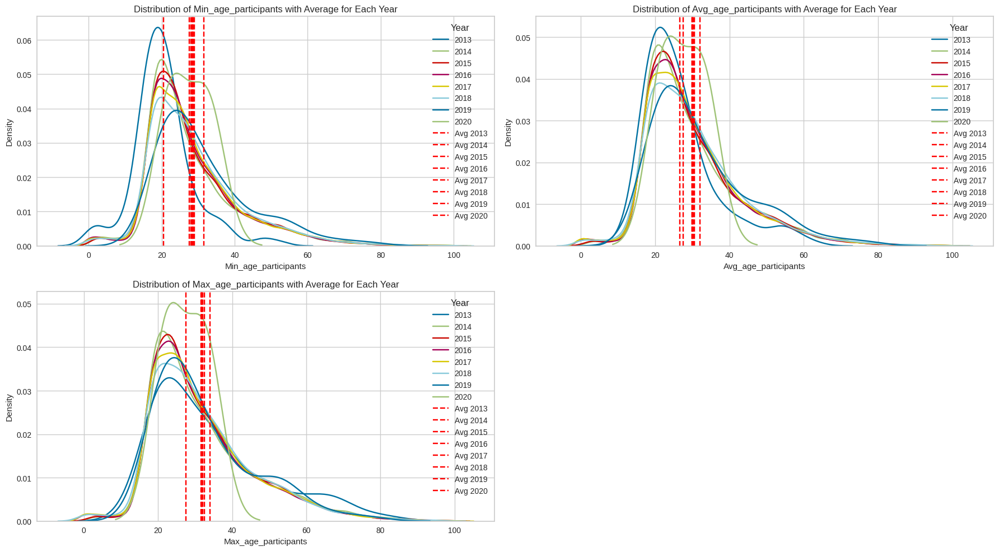

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt


df_cleaned = clean_df_incidents.dropna(subset=['min_age_participants', 'avg_age_participants', 'max_age_participants']).copy()

df_cleaned['min_age_participants'] = df_cleaned['min_age_participants'].astype(float)
df_cleaned['avg_age_participants'] = df_cleaned['avg_age_participants'].astype(float)
df_cleaned['max_age_participants'] = df_cleaned['max_age_participants'].astype(float)


# Plotting the distribution for each year with average line
plt.figure(figsize=(18, 10))

# List of age columns
age_columns = ['min_age_participants', 'avg_age_participants', 'max_age_participants']

for i, age_column in enumerate(age_columns, start=1):
    plt.subplot(2, 2, i)
    for year in sorted(df_cleaned['year'].unique()):
        data_year = df_cleaned[df_cleaned['year'] == year]
        sns.kdeplot(data=data_year[age_column], label=str(year))

    # Adding average line for each year
    average_by_year = df_cleaned.groupby('year')[age_column].mean()
    for year, average in average_by_year.items():
        plt.axvline(x=average, color='red', linestyle='--', label=f'Avg {year}')
        print(f'Average {age_column} for {year}: {average:.2f}')


    # Adding labels and title
    plt.xlabel(f'{age_column.capitalize()}')
    plt.ylabel('Density')
    plt.title(f'Distribution of {age_column.capitalize()} with Average for Each Year')

    # Adding a legend
    plt.legend(title='Year')

# Adjust layout
plt.tight_layout()

# Display the plots
plt.show()

PLOT OF THE DISTRIBUTION OF MIN/AVG/MAX AGE PARTICIPANTS FOR EACH YEAR WITH MEDIAN

Median min_age_participants for 2013: 20.00
Median min_age_participants for 2014: 24.00
Median min_age_participants for 2015: 25.00
Median min_age_participants for 2016: 25.00
Median min_age_participants for 2017: 26.00
Median min_age_participants for 2018: 26.00
Median min_age_participants for 2019: 27.00
Median min_age_participants for 2020: 27.00
Median avg_age_participants for 2013: 24.00
Median avg_age_participants for 2014: 26.00
Median avg_age_participants for 2015: 27.00
Median avg_age_participants for 2016: 27.00
Median avg_age_participants for 2017: 27.00
Median avg_age_participants for 2018: 28.00
Median avg_age_participants for 2019: 28.00
Median avg_age_participants for 2020: 27.00
Median max_age_participants for 2013: 29.00
Median max_age_participants for 2014: 28.00
Median max_age_participants for 2015: 28.00
Median max_age_participants for 2016: 28.00
Median max_age_participants for 2017: 28.00
Median max_age_participants for 2018: 29.00
Median max_age_participants for 

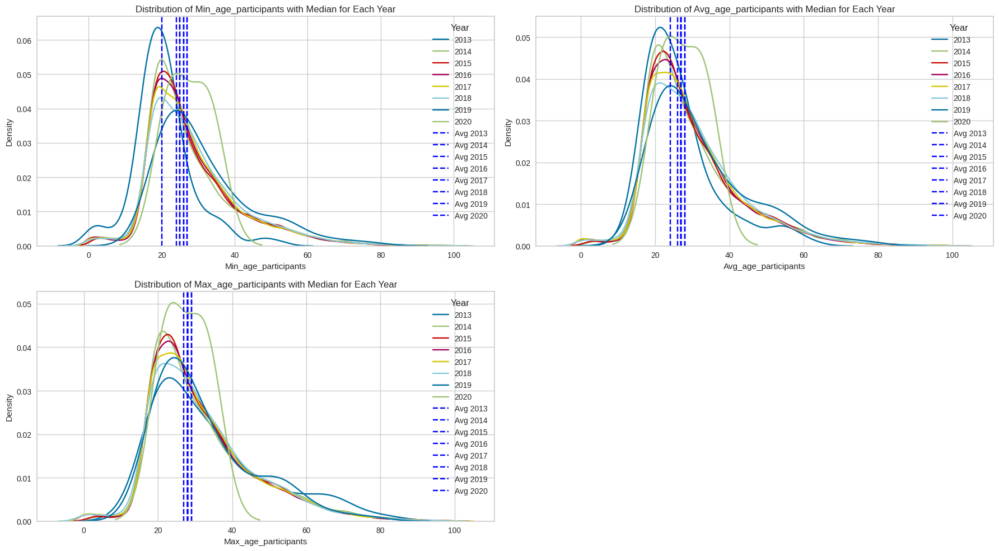

In [ ]:
df_cleaned = clean_df_incidents.dropna(subset=['min_age_participants', 'avg_age_participants', 'max_age_participants']).copy()

df_cleaned['min_age_participants'] = df_cleaned['min_age_participants'].astype(float)
df_cleaned['avg_age_participants'] = df_cleaned['avg_age_participants'].astype(float)
df_cleaned['max_age_participants'] = df_cleaned['max_age_participants'].astype(float)

# Plotting the distribution for each year with average line
plt.figure(figsize=(18, 10))

# List of age columns
age_columns = ['min_age_participants', 'avg_age_participants', 'max_age_participants']

for i, age_column in enumerate(age_columns, start=1):
    plt.subplot(2, 2, i)
    for year in sorted(df_cleaned['year'].unique()):
        data_year = df_cleaned[df_cleaned['year'] == year]
        sns.kdeplot(data=data_year[age_column], label=str(year))

    # Adding average line for each year
    average_by_year = df_cleaned.groupby('year')[age_column].median()
    for year, average in average_by_year.items():
        plt.axvline(x=average, color='blue', linestyle='--', label=f'Avg {year}')
        print(f'Median {age_column} for {year}: {average:.2f}')


    # Adding labels and title
    plt.xlabel(f'{age_column.capitalize()}')
    plt.ylabel('Density')
    plt.title(f'Distribution of {age_column.capitalize()} with Median for Each Year')

    # Adding a legend
    plt.legend(title='Year')

# Adjust layout
plt.tight_layout()

# Display the plots
plt.show()

PLOT OF THE DISTRIBUTION OF MIN/AVG/MAX AGE PARTICIPANTS FOR EACH STATE WITH MEAN

Mean for Illinois (min_age_participants): 26.02
Mean for Delaware (min_age_participants): 26.33
Mean for Rhode Island (min_age_participants): 26.47
Mean for Massachusetts (min_age_participants): 26.86
Mean for District of Columbia (min_age_participants): 26.97
Mean for New Jersey (min_age_participants): 27.20
Mean for Tennessee (min_age_participants): 27.49
Mean for Virginia (min_age_participants): 27.74
Mean for Louisiana (min_age_participants): 27.79
Mean for Iowa (min_age_participants): 27.83
Mean for Nebraska (min_age_participants): 27.88
Mean for Ohio (min_age_participants): 27.90
Mean for Georgia (min_age_participants): 27.91
Mean for Maryland (min_age_participants): 28.02
Mean for New York (min_age_participants): 28.28
Mean for North Carolina (min_age_participants): 28.28
Mean for Wisconsin (min_age_participants): 28.34
Mean for Pennsylvania (min_age_participants): 28.45
Mean for Missouri (min_age_participants): 28.48
Mean for Michigan (min_age_participants): 28.53
Mean for Sout

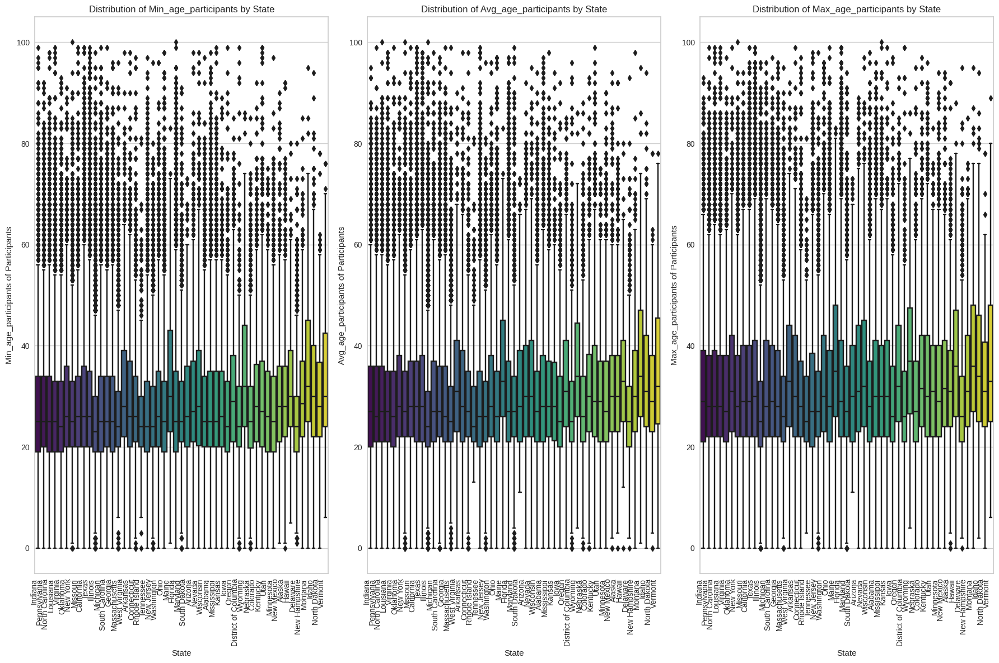

In [ ]:

df_cleaned = clean_df_incidents.dropna(subset=['min_age_participants', 'avg_age_participants', 'max_age_participants']).copy()

df_cleaned['min_age_participants'] = df_cleaned['min_age_participants'].astype(float)
df_cleaned['avg_age_participants'] = df_cleaned['avg_age_participants'].astype(float)
df_cleaned['max_age_participants'] = df_cleaned['max_age_participants'].astype(float)

# Calculate the average for each age column by state
avg_by_state = df_cleaned.groupby('state').agg({
    'min_age_participants': 'mean',
    'avg_age_participants': 'mean',
    'max_age_participants': 'mean'
}).sort_values(by='min_age_participants')

# Plotting the box plots side by side
plt.figure(figsize=(18, 12))

# List of age columns
age_columns = ['min_age_participants', 'avg_age_participants', 'max_age_participants']

for i, age_column in enumerate(age_columns, start=1):
    plt.subplot(1, 3, i)
    sns.boxplot(x='state', y=age_column, data=df_cleaned, palette='viridis')

    # Adding labels and title
    plt.xlabel('State')
    plt.ylabel(f'{age_column.capitalize()} of Participants')
    plt.title(f'Distribution of {age_column.capitalize()} by State')

    plt.xticks(rotation=90, ha='right')

    # Print the mean for each state
    for i, state in enumerate(avg_by_state.index):
        mean_value = avg_by_state.loc[state, age_column]
        print(f'Mean for {state} ({age_column}): {mean_value:.2f}')

# Adjust layout
plt.tight_layout()

# Display the plots
plt.show()

PLOT OF THE DISTRIBUTION OF MIN/AVG/MAX AGE PARTICIPANTS FOR EACH STATE WITH MEDIAN

Median for Illinois (min_age_participants): 23.00
Median for New Jersey (min_age_participants): 24.00
Median for Iowa (min_age_participants): 24.00
Median for Rhode Island (min_age_participants): 24.00
Median for Massachusetts (min_age_participants): 24.00
Median for Delaware (min_age_participants): 24.00
Median for District of Columbia (min_age_participants): 24.00
Median for Tennessee (min_age_participants): 24.00
Median for Virginia (min_age_participants): 24.00
Median for Ohio (min_age_participants): 25.00
Median for Minnesota (min_age_participants): 25.00
Median for Michigan (min_age_participants): 25.00
Median for Wisconsin (min_age_participants): 25.00
Median for North Carolina (min_age_participants): 25.00
Median for Maryland (min_age_participants): 25.00
Median for Nebraska (min_age_participants): 25.00
Median for Mississippi (min_age_participants): 25.00
Median for Louisiana (min_age_participants): 25.00
Median for Alabama (min_age_participants): 25.00
Median for Pennsylvania

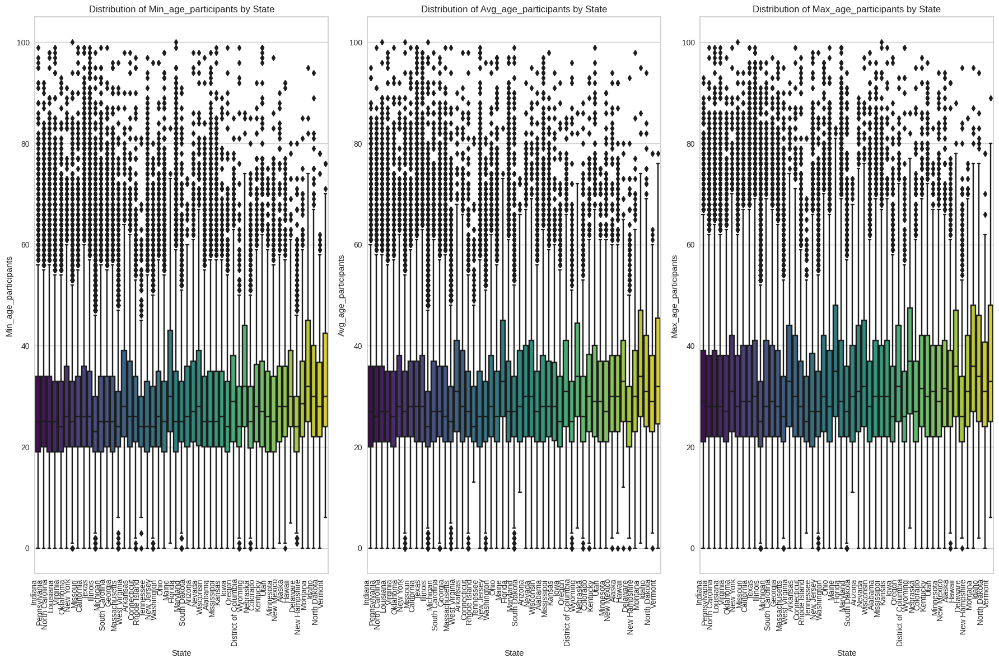

In [ ]:
df_cleaned = clean_df_incidents.dropna(subset=['min_age_participants', 'avg_age_participants', 'max_age_participants']).copy()

df_cleaned['min_age_participants'] = df_cleaned['min_age_participants'].astype(float)
df_cleaned['avg_age_participants'] = df_cleaned['avg_age_participants'].astype(float)
df_cleaned['max_age_participants'] = df_cleaned['max_age_participants'].astype(float)

# Calculate the median for each age column by state
median_by_state = df_cleaned.groupby('state').agg({
    'min_age_participants': 'median',
    'avg_age_participants': 'median',
    'max_age_participants': 'median'
}).sort_values(by='min_age_participants')

# Plotting the box plots side by side
plt.figure(figsize=(18, 12))

# List of age columns
age_columns = ['min_age_participants', 'avg_age_participants', 'max_age_participants']

for i, age_column in enumerate(age_columns, start=1):
    plt.subplot(1, 3, i)
    sns.boxplot(x='state', y=age_column, data=df_cleaned, palette='viridis')

    # Adding labels and title
    plt.xlabel('State')
    plt.ylabel(f'{age_column.capitalize()}')
    plt.title(f'Distribution of {age_column.capitalize()} by State')

    plt.xticks(rotation=90, ha='right')

    # Print the median for each state
    for i, state in enumerate(median_by_state.index):
        median_value = median_by_state.loc[state, age_column]
        print(f'Median for {state} ({age_column}): {median_value:.2f}')

# Adjust layout
plt.tight_layout()

# Display the plots
plt.show()

AFTER ANALYZING THE DISTRIBUTIONS WITH THE MEAN AND MEDIAN VALUES FOR EACH YEAR AND THEN FOR EACH STATE WE DECIDED TO FILL THE NAN VALUES AS FOLLOWS:


1.   FILL WITH THE MEDIAN CALCULATED FOR EACH STATE AND YEAR IN ORDER TO BE AS ACCURATE AS POSSIBLE
2.   THE CHOICE OF THE MEDIAN INSTEAD OF THE MEAN COMES FROM THE CONSIDERATION OF THE PRESENCE OF OUTLIERS AND BEING THE MEDIAN LESS SENSITIVE TO THEM IT IS A BETTER CHOICE



In [ ]:
df_cleaned['state'] = clean_df_incidents['state'].copy()

median_by_state_year_min = df_cleaned.groupby(['state', 'year'])['min_age_participants'].median().reset_index()

# Calculate median for 'avg_age_participants'
median_by_state_year_avg = df_cleaned.groupby(['state', 'year'])['avg_age_participants'].median().reset_index()

# Calculate median for 'max_age_participants'
median_by_state_year_max = df_cleaned.groupby(['state', 'year'])['max_age_participants'].median().reset_index()


In [ ]:
median_by_state_year_min['min_age_participants'] = median_by_state_year_min['min_age_participants'].astype('Float64')
median_by_state_year_min['min_age_participants'] = median_by_state_year_min['min_age_participants'].astype('Int64')
median_by_state_year_avg['avg_age_participants'] = median_by_state_year_avg['avg_age_participants'].astype('Float64')
median_by_state_year_avg['avg_age_participants'] = median_by_state_year_avg['avg_age_participants'].astype('Int64')
median_by_state_year_max['max_age_participants'] = median_by_state_year_max['max_age_participants'].astype('Float64')
median_by_state_year_max['max_age_participants'] = median_by_state_year_max['max_age_participants'].astype('Int64')

DATAFRAME WITH THE MEDIAN VALUES FOR EACH STATE AND EACH YEAR

In [ ]:
medians_ages = pd.merge(median_by_state_year_min, median_by_state_year_avg, on=['state', 'year'])
medians_ages = pd.merge(medians_ages, median_by_state_year_max, on=['state', 'year'])
medians_ages.head(100)


,state,year,min_age_participants,avg_age_participants,max_age_participants
0,Alabama,2013,21,22,23
1,Alabama,2014,24,27,29
2,Alabama,2015,25,28,30
3,Alabama,2016,26,28,30
4,Alabama,2017,25,28,30
5,Alabama,2018,24,26,28
6,Alabama,2019,33,33,33
7,Alaska,2014,26,28,29
8,Alaska,2015,27,29,31
9,Alaska,2016,29,30,31


SINCE FOR SOME STATES THERE ARE NO RECORDED VALUES FOR A SPECIFIC YEAR TO EXTRACT THE INFORMATIONS, WE DECIDED TO FILL THOSE INFORMATIONS WITH THOSE REGARDING THE SAME STATE FOR THE NEAREST RECORDED YEAR (for example Alabama 2020 takes the same values of Alabama 2019)
I EXTEND THE PREVIOUS DATAFRAME WITH THE MISSING YEARS FOR EACH STATE USING THE SAME VALUE OF THE MOST RECENT RECORD FOR THAT STATE

In [ ]:
# Create a reference DataFrame with all combinations of states and years
all_states = medians_ages['state'].unique()
all_years = range(medians_ages['year'].min(), medians_ages['year'].max() + 1)

ref_df = pd.DataFrame([(state, year) for state in all_states for year in all_years],
                      columns=['state', 'year'])

# Merge the reference DataFrame with your existing DataFrame
merged_df = pd.merge(ref_df, medians_ages, on=['state', 'year'], how='left')

# Forward-fill missing values within each state
merged_df_filled = merged_df.groupby('state').apply(lambda group: group.ffill())

# If there are still NaN values in the minimum year, fill them with the values from the next available year
merged_df_filled['min_age_participants'] = merged_df_filled.groupby('state')['min_age_participants'].bfill()
merged_df_filled['avg_age_participants'] = merged_df_filled.groupby('state')['avg_age_participants'].bfill()
merged_df_filled['max_age_participants'] = merged_df_filled.groupby('state')['max_age_participants'].bfill()


# Reset the index to get a clean DataFrame
merged_df_filled = merged_df_filled.reset_index(drop=True)


<ipython-input-245-4fa1f2e9df64>:12: FutureWarning:

Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)



MEDIANS MERGED IS A COPY OF THE PREVIOUSLY EXTRACTED DATAFRAME CONTAINING THE MEDIANS VALUES FOR EACH STATE AND EACH YEAR

In [ ]:
medians_merged = merged_df_filled.copy()

PROVA IS A COPY OF THE INCIDENTS DATASET

In [ ]:
prova = clean_df_incidents.copy()

REPLACE 0 VALUES WITH NaN IN ORDER TO BE ABLE TO FILL THEM

In [ ]:
prova['min_age_participants'] = prova['min_age_participants'].replace(0, np.nan)
prova['avg_age_participants'] = prova['avg_age_participants'].replace(0, np.nan)
prova['max_age_participants'] = prova['max_age_participants'].replace(0, np.nan)

In [ ]:
merged_df = pd.merge(prova, medians_merged, on=['state', 'year'], how='left', suffixes=('_prova', '_medians'))

# Define a function to fill NaN values in prova using values from medians_merged
def fill_age_nans(row, col_name):
    if pd.isna(row[col_name + '_prova']):
        return row[col_name + '_medians']
    else:
        return row[col_name + '_prova']

# Fill NaN values in 'min_age_participants', 'avg_age_participants', and 'max_age_participants'
merged_df['min_age_participants'] = merged_df.apply(lambda row: fill_age_nans(row, 'min_age_participants'), axis=1)
merged_df['avg_age_participants'] = merged_df.apply(lambda row: fill_age_nans(row, 'avg_age_participants'), axis=1)
merged_df['max_age_participants'] = merged_df.apply(lambda row: fill_age_nans(row, 'max_age_participants'), axis=1)

# Reorder columns
desired_order = ['year', 'month','day', 'state', 'city_or_county', 'congressional_district',
                 'min_age_participants', 'avg_age_participants', 'max_age_participants',
                 'n_participants_child', 'n_participants_teen', 'n_participants_adult',
                 'n_males', 'n_females', 'n_killed', 'n_injured', 'n_arrested',
                 'n_unharmed', 'n_participants', 'incident_characteristics1', 'incident_characteristics2']

merged_df = merged_df[desired_order]

# Drop the unnecessary columns from the merged dataframe
#merged_df = merged_df.drop(['min_age_participants_prova', 'avg_age_participants_prova', 'max_age_participants_prova', 'min_age_participants_medians', 'avg_age_participants_medians', 'max_age_participants_medians'], axis=1)

# Now, merged_df contains the filled values for 'min_age_participants', 'avg_age_participants', and 'max_age_participants' based on the 'state' and 'year' combination

prova = merged_df

In [ ]:
prova.sort_values(['state', 'year'], inplace=True)
medians_merged.sort_values(['state', 'year'], inplace=True)

In [ ]:
medians_merged.head(10)

,state,year,min_age_participants,avg_age_participants,max_age_participants
0,Alabama,2013,21,22,23
1,Alabama,2014,24,27,29
2,Alabama,2015,25,28,30
3,Alabama,2016,26,28,30
4,Alabama,2017,25,28,30
5,Alabama,2018,24,26,28
6,Alabama,2019,33,33,33
7,Alabama,2020,33,33,33
8,Alaska,2013,26,28,29
9,Alaska,2014,26,28,29


In [ ]:
prova.head(10)

,year,month,day,state,city_or_county,congressional_district,min_age_participants,avg_age_participants,max_age_participants,n_participants_child,n_participants_teen,n_participants_adult,n_males,n_females,n_killed,n_injured,n_arrested,n_unharmed,n_participants,incident_characteristics1,incident_characteristics2
161657,2013,12,28,Alabama,Montgomery,2.0,20,22,25,0,0,9,8,1,3,5,2,0,10,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)"
167068,2013,7,6,Alabama,Florence,5.0,22,22,22,0,0,1,0,1,0,4,1,0,5,Shot - Wounded/Injured,Mass Shooting (4+ victims injured or killed ex...
517,2014,6,28,Alabama,Auburn,3.0,36,36,36,0,0,2,2,0,0,1,0,1,2,Shot - Wounded/Injured,NaN
983,2014,7,29,Alabama,Ensley,7.0,26,26,26,0,0,5,3,2,1,2,0,0,5,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)"
1083,2014,5,28,Alabama,Huntsville,5.0,24,27,29,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,TSA Action,NaN
1368,2014,7,20,Alabama,Salem,3.0,48,64,80,0,0,2,1,1,0,1,1,0,2,Shot - Wounded/Injured,Domestic Violence
1821,2014,5,13,Alabama,Montgomery,7.0,43,43,43,0,0,1,1,0,1,0,0,0,1,"Shot - Dead (murder, accidental, suicide)",NaN
1865,2014,9,16,Alabama,Elkmont,5.0,32,36,41,0,0,4,3,1,0,0,0,4,4,Home Invasion,Home Invasion - subject/suspect/perpetrator in...
2661,2014,4,9,Alabama,Decatur,5.0,22,22,22,0,0,1,1,0,0,1,0,0,1,Shot - Wounded/Injured,NaN
2838,2014,5,19,Alabama,Mobile,1.0,24,27,29,<NA>,<NA>,<NA>,4,0,0,0,<NA>,<NA>,4,Shot - Wounded/Injured,NaN


In [ ]:
#prova.sort_values(by=['state','min_age_participants'],na_position='first').head(100)

THE PLOT SHOWS THAT WE SUCCESFULLY FILLED NaN VALUES IN MIN/AVG/MAX AGE PARTICIPANTS WITH THE MEDIAN FOR THE RESPECTIVE STATE AND YEAR

In [ ]:
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.io as pio
import plotly.graph_objects as go
pd.options.plotting.backend = 'plotly'
pio.templates.default = "seaborn"

x = pd.DataFrame(prova.isna().sum())
x.rename(columns={0: 'Missing values'}, inplace=True)
x.index.name = 'Feature'
x.reset_index(inplace=True)
#x.set_index('Feature', inplace=True)

fig = px.bar(x, x="Feature", y="Missing values", log_y=True)

fig.update_layout(
    xaxis_dtick = 1,
    xaxis_tickangle = 45
)

fig.show()

**N_PARTICIPANTS CHILD/TEEN/ADULT**







In [ ]:
clean_df_incidents = prova.copy()

In [ ]:
clean_df_incidents.head(10)

,year,month,day,state,city_or_county,congressional_district,min_age_participants,avg_age_participants,max_age_participants,n_participants_child,n_participants_teen,n_participants_adult,n_males,n_females,n_killed,n_injured,n_arrested,n_unharmed,n_participants,incident_characteristics1,incident_characteristics2
161657,2013,12,28,Alabama,Montgomery,2.0,20,22,25,0,0,9,8,1,3,5,2,0,10,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)"
167068,2013,7,6,Alabama,Florence,5.0,22,22,22,0,0,1,0,1,0,4,1,0,5,Shot - Wounded/Injured,Mass Shooting (4+ victims injured or killed ex...
517,2014,6,28,Alabama,Auburn,3.0,36,36,36,0,0,2,2,0,0,1,0,1,2,Shot - Wounded/Injured,NaN
983,2014,7,29,Alabama,Ensley,7.0,26,26,26,0,0,5,3,2,1,2,0,0,5,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)"
1083,2014,5,28,Alabama,Huntsville,5.0,24,27,29,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,TSA Action,NaN
1368,2014,7,20,Alabama,Salem,3.0,48,64,80,0,0,2,1,1,0,1,1,0,2,Shot - Wounded/Injured,Domestic Violence
1821,2014,5,13,Alabama,Montgomery,7.0,43,43,43,0,0,1,1,0,1,0,0,0,1,"Shot - Dead (murder, accidental, suicide)",NaN
1865,2014,9,16,Alabama,Elkmont,5.0,32,36,41,0,0,4,3,1,0,0,0,4,4,Home Invasion,Home Invasion - subject/suspect/perpetrator in...
2661,2014,4,9,Alabama,Decatur,5.0,22,22,22,0,0,1,1,0,0,1,0,0,1,Shot - Wounded/Injured,NaN
2838,2014,5,19,Alabama,Mobile,1.0,24,27,29,<NA>,<NA>,<NA>,4,0,0,0,<NA>,<NA>,4,Shot - Wounded/Injured,NaN


In [ ]:
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import pandas as pd

df_cleaned_child = clean_df_incidents.dropna(subset=['n_participants_child'])
df_cleaned_teen = clean_df_incidents.dropna(subset=['n_participants_teen'])
df_cleaned_adult = clean_df_incidents.dropna(subset=['n_participants_adult'])

# Create subplots
fig = make_subplots(rows=1, cols=3, subplot_titles=['n_participants_child','n_participants_teen','n_participants_adult'])

# Plotting the distribution with histogram and KDE for min_age_participants
histogram_child = px.histogram(df_cleaned_child, x='n_participants_child', nbins=20, marginal='rug', opacity=0.7, color_discrete_sequence=['blue'])
fig.add_trace(histogram_child['data'][0], row=1, col=1)

# Plotting the distribution with histogram and KDE for avg_age_participants
histogram_teen = px.histogram(df_cleaned_teen, x='n_participants_teen', nbins=20, marginal='rug', opacity=0.7, color_discrete_sequence=['blue'])
fig.add_trace(histogram_teen['data'][0], row=1, col=2)

# Plotting the distribution with histogram and KDE for max_age_participants
histogram_adult = px.histogram(df_cleaned_adult, x='n_participants_adult', nbins=20, marginal='rug', opacity=0.7, color_discrete_sequence=['blue'])
fig.add_trace(histogram_adult['data'][0], row=1, col=3)

# Update layout
fig.update_layout(title_text='Distribution of Category of Participants (FULL DATASET)', showlegend=False)

# Display the subplot
fig.show()

WE CAN SEE THAT FOR THE MAJORITY OF THE INCIDENTS THERE ARE NOT CHILDS OR TEENS BUT MOSTLY ADULTS

In [ ]:
print(clean_df_incidents['n_participants_child'].value_counts())
print(clean_df_incidents['n_participants_teen'].value_counts())
print(clean_df_incidents['n_participants_adult'].value_counts())

0     193853
1       3045
2        536
3         84
4         23
5         10
6          4
7          2
8          1
11         1
Name: n_participants_child, dtype: Int64
0     178226
1      14893
2       3227
3        811
4        279
5         82
6         30
7          6
9          3
10         1
8          1
27         1
15         1
Name: n_participants_teen, dtype: Int64
1      106461
2       54412
3       15946
0       11545
4        5818
5        2060
6         733
7         293
8         121
9          48
10         35
11         20
12         13
13         10
15          6
18          5
16          5
20          3
14          3
22          3
17          3
29          3
24          2
19          2
21          2
32          1
33          1
103         1
63          1
27          1
30          1
25          1
28          1
Name: n_participants_adult, dtype: Int64


DISTRIBUTION OF N_PARTICIPANTS CHILD/TEEN/ADULT WITH THE MEAN FOR EACH YEAR

Average n_participants_child for 2013: 0.13
Average n_participants_child for 2014: 0.04
Average n_participants_child for 2015: 0.03
Average n_participants_child for 2016: 0.02
Average n_participants_child for 2017: 0.02
Average n_participants_child for 2018: 0.02
Average n_participants_child for 2019: 0.01
Average n_participants_child for 2020: 0.01
Average n_participants_teen for 2013: 0.59
Average n_participants_teen for 2014: 0.16
Average n_participants_teen for 2015: 0.15
Average n_participants_teen for 2016: 0.13
Average n_participants_teen for 2017: 0.13
Average n_participants_teen for 2018: 0.14
Average n_participants_teen for 2019: 0.04
Average n_participants_teen for 2020: 0.05
Average n_participants_adult for 2013: 4.23
Average n_participants_adult for 2014: 1.71
Average n_participants_adult for 2015: 1.55
Average n_participants_adult for 2016: 1.53
Average n_participants_adult for 2017: 1.46
Average n_participants_adult for 2018: 1.44
Average n_participants_adult for 2019: 1

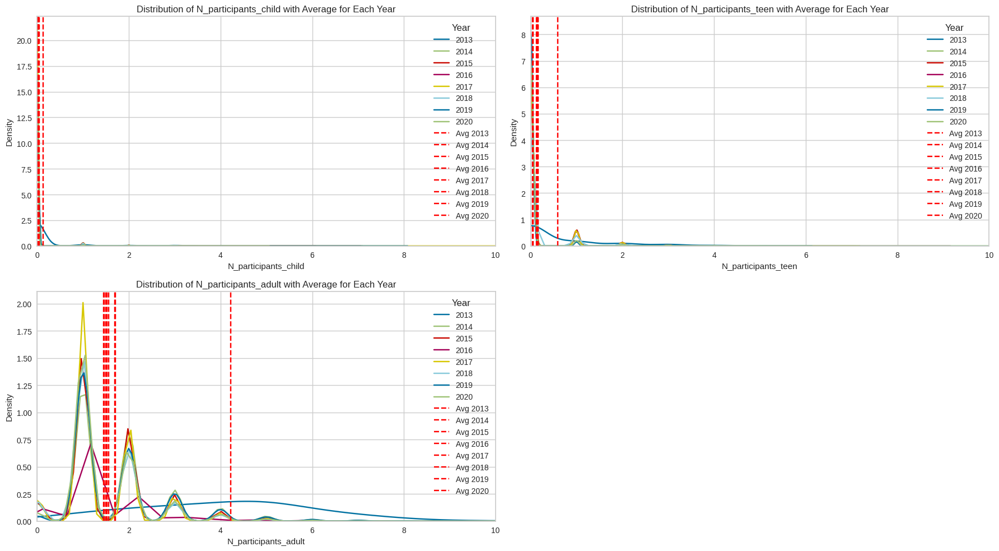

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt


df_cleaned = clean_df_incidents.dropna(subset=['n_participants_child','n_participants_teen','n_participants_adult']).copy()

df_cleaned['n_participants_child'] = df_cleaned['n_participants_child'].astype(float)
df_cleaned['n_participants_teen'] = df_cleaned['n_participants_teen'].astype(float)
df_cleaned['n_participants_adult'] = df_cleaned['n_participants_adult'].astype(float)


# Plotting the distribution for each year with average line
plt.figure(figsize=(18, 10))

# List of age columns
age_columns = ['n_participants_child','n_participants_teen','n_participants_adult']

for i, age_column in enumerate(age_columns, start=1):
    plt.subplot(2, 2, i)
    for year in sorted(df_cleaned['year'].unique()):
        data_year = df_cleaned[df_cleaned['year'] == year]
        sns.kdeplot(data=data_year[age_column], label=str(year))

    # Adding average line for each year
    average_by_year = df_cleaned.groupby('year')[age_column].mean()
    for year, average in average_by_year.items():
        plt.axvline(x=average, color='red', linestyle='--', label=f'Avg {year}')
        print(f'Average {age_column} for {year}: {average:.2f}')

    plt.xlim(0, 10)

    # Adding labels and title
    plt.xlabel(f'{age_column.capitalize()}')
    plt.ylabel('Density')
    plt.title(f'Distribution of {age_column.capitalize()} with Average for Each Year')

    # Adding a legend
    plt.legend(title='Year')

# Adjust layout
plt.tight_layout()

# Display the plots
plt.show()

DISTRIBUTION OF N_PARTICIPANTS CHILD/TEEN/ADULT WITH THE MEDIAN FOR EACH YEAR

Median n_participants_child for 2013: 0.00
Median n_participants_child for 2014: 0.00
Median n_participants_child for 2015: 0.00
Median n_participants_child for 2016: 0.00
Median n_participants_child for 2017: 0.00
Median n_participants_child for 2018: 0.00
Median n_participants_child for 2019: 0.00
Median n_participants_child for 2020: 0.00
Median n_participants_teen for 2013: 0.00
Median n_participants_teen for 2014: 0.00
Median n_participants_teen for 2015: 0.00
Median n_participants_teen for 2016: 0.00
Median n_participants_teen for 2017: 0.00
Median n_participants_teen for 2018: 0.00
Median n_participants_teen for 2019: 0.00
Median n_participants_teen for 2020: 0.00
Median n_participants_adult for 2013: 4.00
Median n_participants_adult for 2014: 1.00
Median n_participants_adult for 2015: 1.00
Median n_participants_adult for 2016: 1.00
Median n_participants_adult for 2017: 1.00
Median n_participants_adult for 2018: 1.00
Median n_participants_adult for 2019: 1.00
Median n_participan

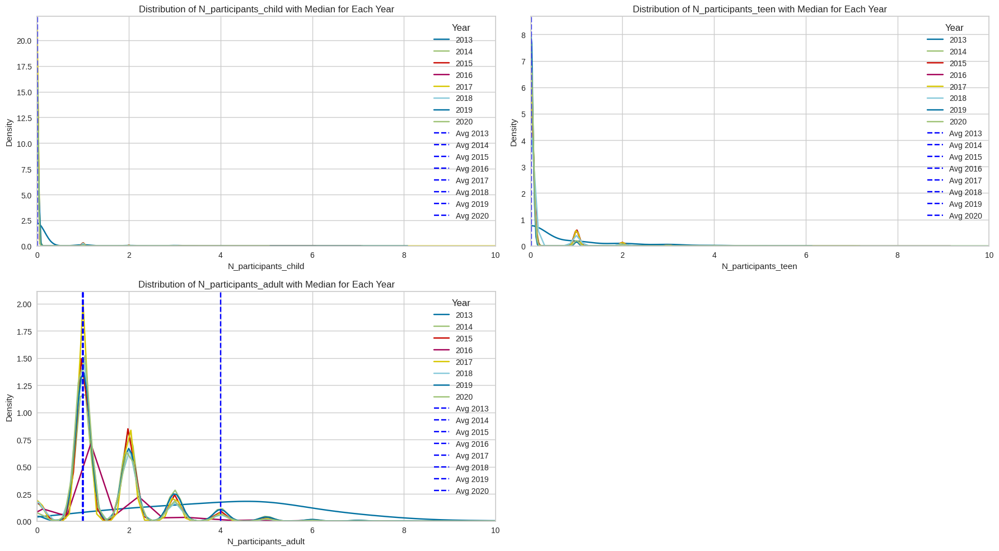

In [ ]:

df_cleaned = clean_df_incidents.dropna(subset=['n_participants_child','n_participants_teen','n_participants_adult']).copy()

df_cleaned['n_participants_child'] = df_cleaned['n_participants_child'].astype(float)
df_cleaned['n_participants_teen'] = df_cleaned['n_participants_teen'].astype(float)
df_cleaned['n_participants_adult'] = df_cleaned['n_participants_adult'].astype(float)

# Plotting the distribution for each year with average line
plt.figure(figsize=(18, 10))

# List of age columns
age_columns = ['n_participants_child','n_participants_teen','n_participants_adult']

for i, age_column in enumerate(age_columns, start=1):
    plt.subplot(2, 2, i)
    for year in sorted(df_cleaned['year'].unique()):
        data_year = df_cleaned[df_cleaned['year'] == year]
        sns.kdeplot(data=data_year[age_column], label=str(year))

    # Adding average line for each year
    average_by_year = df_cleaned.groupby('year')[age_column].median()
    for year, average in average_by_year.items():
        plt.axvline(x=average, color='blue', linestyle='--', label=f'Avg {year}')
        print(f'Median {age_column} for {year}: {average:.2f}')

    plt.xlim(0, 10)
    # Adding labels and title
    plt.xlabel(f'{age_column.capitalize()}')
    plt.ylabel('Density')
    plt.title(f'Distribution of {age_column.capitalize()} with Median for Each Year')

    # Adding a legend
    plt.legend(title='Year')

# Adjust layout
plt.tight_layout()

# Display the plots
plt.show()

AS FOR THE AGES WE DECIDED TO USE THE MEDIAN CALCULATED FOR EACH STATE AND EACH YEAR BEING LESS SENSITIVE TO OUTLIERS

In [ ]:
df_cleaned['state'] = clean_df_incidents['state'].copy()

median_by_state_year_child = df_cleaned.groupby(['state', 'year'])['n_participants_child'].median().reset_index()

median_by_state_year_teen = df_cleaned.groupby(['state', 'year'])['n_participants_teen'].median().reset_index()

median_by_state_year_adult = df_cleaned.groupby(['state', 'year'])['n_participants_adult'].median().reset_index()


In [ ]:
median_by_state_year_child['n_participants_child'] = median_by_state_year_child['n_participants_child'].astype('Float64')
median_by_state_year_child['n_participants_child'] = median_by_state_year_child['n_participants_child'].astype('Int64')

median_by_state_year_teen['n_participants_teen'] = median_by_state_year_teen['n_participants_teen'].astype('Float64')
median_by_state_year_teen['n_participants_teen'] = median_by_state_year_teen['n_participants_teen'].astype('Int64')

median_by_state_year_adult['n_participants_adult'] = median_by_state_year_adult['n_participants_adult'].astype('Float64')
median_by_state_year_adult['n_participants_adult'] = median_by_state_year_adult['n_participants_adult'].astype('Int64')

In [ ]:
medians_category = pd.merge(median_by_state_year_child, median_by_state_year_teen, on=['state', 'year'])
medians_category = pd.merge(medians_category, median_by_state_year_adult, on=['state', 'year'])
medians_category.head(100)


,state,year,n_participants_child,n_participants_teen,n_participants_adult
0,Alabama,2013,0,0,5
1,Alabama,2014,0,0,2
2,Alabama,2015,0,0,2
3,Alabama,2016,0,0,1
4,Alabama,2017,0,0,1
5,Alabama,2018,0,0,1
6,Alabama,2019,0,0,2
7,Alabama,2020,0,0,1
8,Alaska,2014,0,0,1
9,Alaska,2015,0,0,1


In [ ]:
# Create a reference DataFrame with all combinations of states and years
all_states = medians_category['state'].unique()
all_years = range(medians_category['year'].min(), medians_category['year'].max() + 1)

ref_df = pd.DataFrame([(state, year) for state in all_states for year in all_years],
                      columns=['state', 'year'])

# Merge the reference DataFrame with your existing DataFrame
merged_df = pd.merge(ref_df, medians_category, on=['state', 'year'], how='left')

# Forward-fill missing values within each state
merged_df_filled = merged_df.groupby('state').apply(lambda group: group.ffill())

# If there are still NaN values in the minimum year, fill them with the values from the next available year
merged_df_filled['n_participants_child'] = merged_df_filled.groupby('state')['n_participants_child'].bfill()
merged_df_filled['n_participants_teen'] = merged_df_filled.groupby('state')['n_participants_teen'].bfill()
merged_df_filled['n_participants_adult'] = merged_df_filled.groupby('state')['n_participants_adult'].bfill()


# Reset the index to get a clean DataFrame
merged_df_filled = merged_df_filled.reset_index(drop=True)


<ipython-input-263-da16656a91f3>:12: FutureWarning:

Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)



In [ ]:
medians_categories = merged_df_filled.copy()
prova = clean_df_incidents.copy()

MEDIANS FOR N_PARTICIPANTS CHILD TEEN ADULT FOR EACH STATE AND EACH YAR

In [ ]:
medians_categories.head(10)

,state,year,n_participants_child,n_participants_teen,n_participants_adult
0,Alabama,2013,0,0,5
1,Alabama,2014,0,0,2
2,Alabama,2015,0,0,2
3,Alabama,2016,0,0,1
4,Alabama,2017,0,0,1
5,Alabama,2018,0,0,1
6,Alabama,2019,0,0,2
7,Alabama,2020,0,0,1
8,Alaska,2013,0,0,1
9,Alaska,2014,0,0,1


In [ ]:
prova.head(10)

,year,month,day,state,city_or_county,congressional_district,min_age_participants,avg_age_participants,max_age_participants,n_participants_child,n_participants_teen,n_participants_adult,n_males,n_females,n_killed,n_injured,n_arrested,n_unharmed,n_participants,incident_characteristics1,incident_characteristics2
161657,2013,12,28,Alabama,Montgomery,2.0,20,22,25,0,0,9,8,1,3,5,2,0,10,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)"
167068,2013,7,6,Alabama,Florence,5.0,22,22,22,0,0,1,0,1,0,4,1,0,5,Shot - Wounded/Injured,Mass Shooting (4+ victims injured or killed ex...
517,2014,6,28,Alabama,Auburn,3.0,36,36,36,0,0,2,2,0,0,1,0,1,2,Shot - Wounded/Injured,NaN
983,2014,7,29,Alabama,Ensley,7.0,26,26,26,0,0,5,3,2,1,2,0,0,5,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)"
1083,2014,5,28,Alabama,Huntsville,5.0,24,27,29,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,TSA Action,NaN
1368,2014,7,20,Alabama,Salem,3.0,48,64,80,0,0,2,1,1,0,1,1,0,2,Shot - Wounded/Injured,Domestic Violence
1821,2014,5,13,Alabama,Montgomery,7.0,43,43,43,0,0,1,1,0,1,0,0,0,1,"Shot - Dead (murder, accidental, suicide)",NaN
1865,2014,9,16,Alabama,Elkmont,5.0,32,36,41,0,0,4,3,1,0,0,0,4,4,Home Invasion,Home Invasion - subject/suspect/perpetrator in...
2661,2014,4,9,Alabama,Decatur,5.0,22,22,22,0,0,1,1,0,0,1,0,0,1,Shot - Wounded/Injured,NaN
2838,2014,5,19,Alabama,Mobile,1.0,24,27,29,<NA>,<NA>,<NA>,4,0,0,0,<NA>,<NA>,4,Shot - Wounded/Injured,NaN


FILL THE NaN VALUES

In [ ]:
merged_df = pd.merge(prova, medians_categories, on=['state', 'year'], how='left', suffixes=('_prova', '_medians'))

# Define a function to fill NaN values in prova using values from medians_merged
def fill_category_nans(row, col_name):
    if pd.isna(row[col_name + '_prova']):
        return row[col_name + '_medians']
    else:
        return row[col_name + '_prova']

# Fill NaN values in 'min_age_participants', 'avg_age_participants', and 'max_age_participants'
merged_df['n_participants_child'] = merged_df.apply(lambda row: fill_category_nans(row, 'n_participants_child'), axis=1)
merged_df['n_participants_teen'] = merged_df.apply(lambda row: fill_category_nans(row, 'n_participants_teen'), axis=1)
merged_df['n_participants_adult'] = merged_df.apply(lambda row: fill_category_nans(row, 'n_participants_adult'), axis=1)

# Reorder columns
desired_order = ['year', 'month','day', 'state', 'city_or_county', 'congressional_district',
                 'min_age_participants', 'avg_age_participants', 'max_age_participants',
                 'n_participants_child', 'n_participants_teen', 'n_participants_adult',
                 'n_males', 'n_females', 'n_killed', 'n_injured', 'n_arrested',
                 'n_unharmed', 'n_participants', 'incident_characteristics1', 'incident_characteristics2']

merged_df = merged_df[desired_order]

# Drop the unnecessary columns from the merged dataframe
#merged_df = merged_df.drop(['min_age_participants_prova', 'avg_age_participants_prova', 'max_age_participants_prova', 'min_age_participants_medians', 'avg_age_participants_medians', 'max_age_participants_medians'], axis=1)

# Now, merged_df contains the filled values for 'min_age_participants', 'avg_age_participants', and 'max_age_participants' based on the 'state' and 'year' combination

prova = merged_df

In [ ]:
prova.head(10)

,year,month,day,state,city_or_county,congressional_district,min_age_participants,avg_age_participants,max_age_participants,n_participants_child,n_participants_teen,n_participants_adult,n_males,n_females,n_killed,n_injured,n_arrested,n_unharmed,n_participants,incident_characteristics1,incident_characteristics2
0,2013,12,28,Alabama,Montgomery,2.0,20,22,25,0,0,9,8,1,3,5,2,0,10,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)"
1,2013,7,6,Alabama,Florence,5.0,22,22,22,0,0,1,0,1,0,4,1,0,5,Shot - Wounded/Injured,Mass Shooting (4+ victims injured or killed ex...
2,2014,6,28,Alabama,Auburn,3.0,36,36,36,0,0,2,2,0,0,1,0,1,2,Shot - Wounded/Injured,NaN
3,2014,7,29,Alabama,Ensley,7.0,26,26,26,0,0,5,3,2,1,2,0,0,5,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)"
4,2014,5,28,Alabama,Huntsville,5.0,24,27,29,0,0,2,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,TSA Action,NaN
5,2014,7,20,Alabama,Salem,3.0,48,64,80,0,0,2,1,1,0,1,1,0,2,Shot - Wounded/Injured,Domestic Violence
6,2014,5,13,Alabama,Montgomery,7.0,43,43,43,0,0,1,1,0,1,0,0,0,1,"Shot - Dead (murder, accidental, suicide)",NaN
7,2014,9,16,Alabama,Elkmont,5.0,32,36,41,0,0,4,3,1,0,0,0,4,4,Home Invasion,Home Invasion - subject/suspect/perpetrator in...
8,2014,4,9,Alabama,Decatur,5.0,22,22,22,0,0,1,1,0,0,1,0,0,1,Shot - Wounded/Injured,NaN
9,2014,5,19,Alabama,Mobile,1.0,24,27,29,0,0,2,4,0,0,0,<NA>,<NA>,4,Shot - Wounded/Injured,NaN


THE PLOT SHOWS THAT WE SUCCESFULLY FILLED THE NaN VALUES IN N_PARTICIPANTS CHILD/TEEN7ADULT

In [ ]:
clean_df_incidents = prova.copy()

In [ ]:
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.io as pio
import plotly.graph_objects as go
pd.options.plotting.backend = 'plotly'
pio.templates.default = "seaborn"

x = pd.DataFrame(clean_df_incidents.isna().sum())
x.rename(columns={0: 'Missing values'}, inplace=True)
x.index.name = 'Feature'
x.reset_index(inplace=True)
#x.set_index('Feature', inplace=True)

fig = px.bar(x, x="Feature", y="Missing values", log_y=True)

fig.update_layout(
    xaxis_dtick = 1,
    xaxis_tickangle = 45
)

fig.show()

In [ ]:
clean_df_incidents.to_csv('/content/drive/MyDrive/' + 'cleaning_incidents.csv', index=False)

**CLEANING n_males	n_females	n_killed	n_injured	n_arrested	n_unharmed	n_participants**

In [ ]:
df_cleaned_males = clean_df_incidents.dropna(subset=['n_males'])
df_cleaned_females = clean_df_incidents.dropna(subset=['n_females'])
df_cleaned_killed = clean_df_incidents.dropna(subset=['n_killed'])
df_cleaned_injured = clean_df_incidents.dropna(subset=['n_injured'])
df_cleaned_arrested = clean_df_incidents.dropna(subset=['n_arrested'])
df_cleaned_unharmed = clean_df_incidents.dropna(subset=['n_unharmed'])
df_cleaned_participants = clean_df_incidents.dropna(subset=['n_participants'])

# Create subplots
fig = make_subplots(rows=1, cols=7, subplot_titles=['n_males', 'n_females', 'n_killed', 'n_injured', 'n_arrested', 'n_unharmed', 'n_participants'])

# Plotting the distribution with histogram and KDE for each column
histogram_males = px.histogram(df_cleaned_males, x='n_males', nbins=10, marginal='rug', opacity=0.7, color_discrete_sequence=['blue'])
fig.add_trace(histogram_males['data'][0], row=1, col=1)

histogram_females = px.histogram(df_cleaned_females, x='n_females', nbins=10, marginal='rug', opacity=0.7, color_discrete_sequence=['blue'])
fig.add_trace(histogram_females['data'][0], row=1, col=2)

histogram_killed = px.histogram(df_cleaned_killed, x='n_killed', nbins=10, marginal='rug', opacity=0.7, color_discrete_sequence=['blue'])
fig.add_trace(histogram_killed['data'][0], row=1, col=3)

histogram_injured = px.histogram(df_cleaned_injured, x='n_injured', nbins=10, marginal='rug', opacity=0.7, color_discrete_sequence=['blue'])
fig.add_trace(histogram_injured['data'][0], row=1, col=4)

histogram_arrested = px.histogram(df_cleaned_arrested, x='n_arrested', nbins=10, marginal='rug', opacity=0.7, color_discrete_sequence=['blue'])
fig.add_trace(histogram_arrested['data'][0], row=1, col=5)

histogram_unharmed = px.histogram(df_cleaned_unharmed, x='n_unharmed', nbins=10, marginal='rug', opacity=0.7, color_discrete_sequence=['blue'])
fig.add_trace(histogram_unharmed['data'][0], row=1, col=6)

histogram_participants = px.histogram(df_cleaned_participants, x='n_participants', nbins=10, marginal='rug', opacity=0.7, color_discrete_sequence=['blue'])
fig.add_trace(histogram_participants['data'][0], row=1, col=7)

# Update layout
fig.update_layout(title_text='Distribution of Various Participant Counts (FULL DATASET)', showlegend=False)

# Display the subplot
fig.show()

DISTRIBUTION OF N MALES/FEMALES/KILLED/INJURED/ARRESTED/UNHARMED/PARTICIPANTS WITH MEAN

Average n_males for 2013: 3.73
Average n_males for 2014: 1.64
Average n_males for 2015: 1.55
Average n_males for 2016: 1.51
Average n_males for 2017: 1.46
Average n_males for 2018: 1.44
Average n_males for 2019: 1.52
Average n_males for 2020: 1.41
Average n_females for 2013: 1.14
Average n_females for 2014: 0.26
Average n_females for 2015: 0.23
Average n_females for 2016: 0.21
Average n_females for 2017: 0.19
Average n_females for 2018: 0.20
Average n_females for 2019: 0.18
Average n_females for 2020: 0.18
Average n_killed for 2013: 1.32
Average n_killed for 2014: 0.36
Average n_killed for 2015: 0.33
Average n_killed for 2016: 0.30
Average n_killed for 2017: 0.30
Average n_killed for 2018: 0.31
Average n_killed for 2019: 0.11
Average n_killed for 2020: 0.14
Average n_injured for 2013: 3.38
Average n_injured for 2014: 0.49
Average n_injured for 2015: 0.53
Average n_injured for 2016: 0.56
Average n_injured for 2017: 0.55
Average n_injured for 2018: 0.51
Average n_injured for 2019: 0.48
A

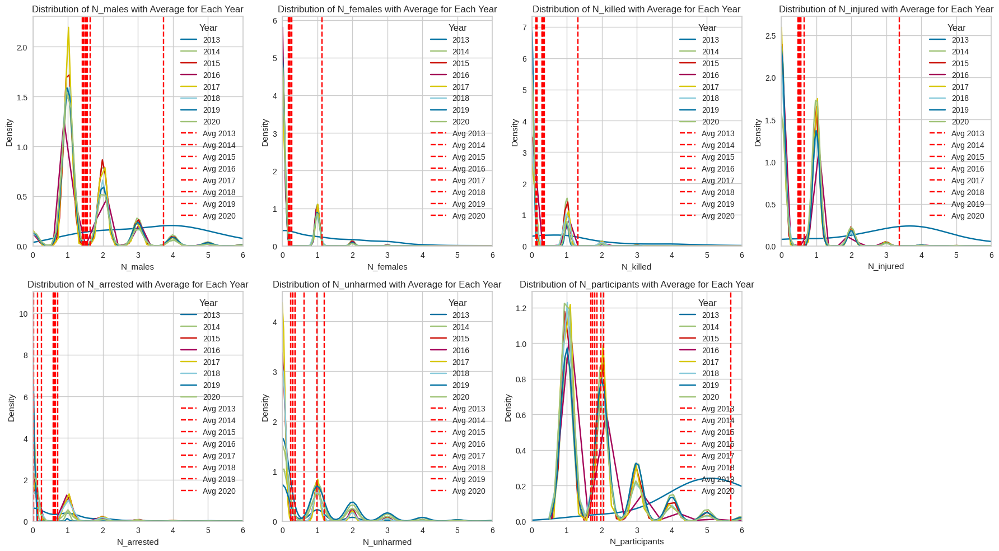

In [ ]:
df_cleaned = clean_df_incidents.dropna(subset=['n_males', 'n_females', 'n_killed', 'n_injured', 'n_arrested', 'n_unharmed', 'n_participants']).copy()

df_cleaned['n_males'] = df_cleaned['n_males'].astype(float)
df_cleaned['n_females'] = df_cleaned['n_females'].astype(float)
df_cleaned['n_killed'] = df_cleaned['n_killed'].astype(float)
df_cleaned['n_injured'] = df_cleaned['n_injured'].astype(float)
df_cleaned['n_arrested'] = df_cleaned['n_arrested'].astype(float)
df_cleaned['n_unharmed'] = df_cleaned['n_unharmed'].astype(float)
df_cleaned['n_participants'] = df_cleaned['n_participants'].astype(float)


# Plotting the distribution for each year with average line
plt.figure(figsize=(18, 10))

# List of columns
columns_to_plot = ['n_males', 'n_females', 'n_killed', 'n_injured', 'n_arrested', 'n_unharmed', 'n_participants']

for i, column in enumerate(columns_to_plot, start=1):
    plt.subplot(2, 4, i)
    for year in sorted(df_cleaned['year'].unique()):
        data_year = df_cleaned[df_cleaned['year'] == year]
        sns.kdeplot(data=data_year[column], label=str(year))

    # Adding average line for each year
    average_by_year = df_cleaned.groupby('year')[column].mean()
    for year, average in average_by_year.items():
        plt.axvline(x=average, color='red', linestyle='--', label=f'Avg {year}')
        print(f'Average {column} for {year}: {average:.2f}')

    plt.xlim(0, 6)

    # Adding labels and title
    plt.xlabel(f'{column.capitalize()}')
    plt.ylabel('Density')
    plt.title(f'Distribution of {column.capitalize()} with Average for Each Year')

    # Adding a legend
    plt.legend(title='Year')

# Adjust layout
plt.tight_layout()

# Display the plots
plt.show()

DISTRIBUTION OF N MALES/FEMALES/KILLED/INJURED/ARRESTED/UNHARMED/PARTICIPANTS WITH MEDIAN

Average n_males for 2013: 4.00
Average n_males for 2014: 1.00
Average n_males for 2015: 1.00
Average n_males for 2016: 1.00
Average n_males for 2017: 1.00
Average n_males for 2018: 1.00
Average n_males for 2019: 1.00
Average n_males for 2020: 1.00
Average n_females for 2013: 1.00
Average n_females for 2014: 0.00
Average n_females for 2015: 0.00
Average n_females for 2016: 0.00
Average n_females for 2017: 0.00
Average n_females for 2018: 0.00
Average n_females for 2019: 0.00
Average n_females for 2020: 0.00
Average n_killed for 2013: 1.00
Average n_killed for 2014: 0.00
Average n_killed for 2015: 0.00
Average n_killed for 2016: 0.00
Average n_killed for 2017: 0.00
Average n_killed for 2018: 0.00
Average n_killed for 2019: 0.00
Average n_killed for 2020: 0.00
Average n_injured for 2013: 3.00
Average n_injured for 2014: 0.00
Average n_injured for 2015: 0.00
Average n_injured for 2016: 0.00
Average n_injured for 2017: 0.00
Average n_injured for 2018: 0.00
Average n_injured for 2019: 0.00
A

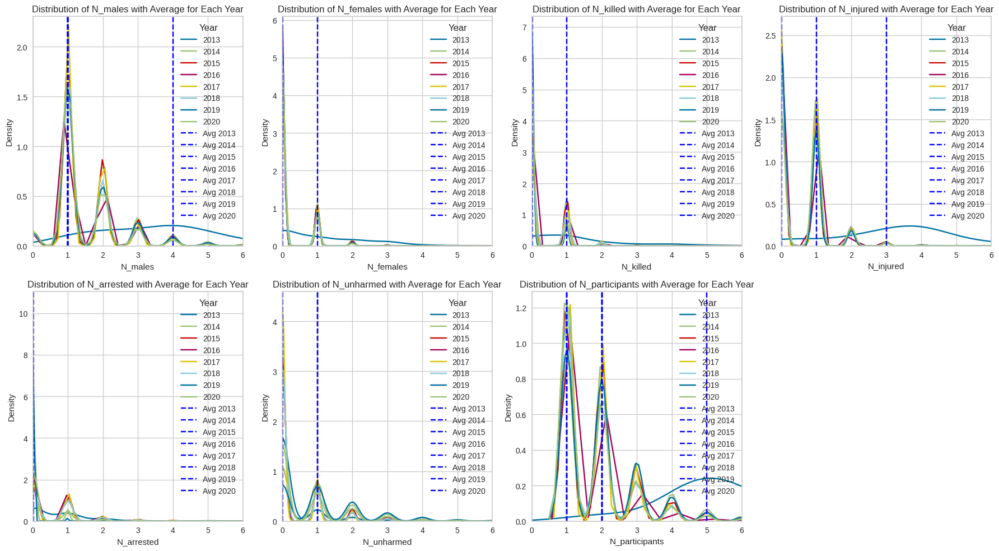

In [ ]:
df_cleaned = clean_df_incidents.dropna(subset=['n_males', 'n_females', 'n_killed', 'n_injured', 'n_arrested', 'n_unharmed', 'n_participants']).copy()

df_cleaned['n_males'] = df_cleaned['n_males'].astype(float)
df_cleaned['n_females'] = df_cleaned['n_females'].astype(float)
df_cleaned['n_killed'] = df_cleaned['n_killed'].astype(float)
df_cleaned['n_injured'] = df_cleaned['n_injured'].astype(float)
df_cleaned['n_arrested'] = df_cleaned['n_arrested'].astype(float)
df_cleaned['n_unharmed'] = df_cleaned['n_unharmed'].astype(float)
df_cleaned['n_participants'] = df_cleaned['n_participants'].astype(float)


# Plotting the distribution for each year with average line
plt.figure(figsize=(18, 10))

# List of columns
columns_to_plot = ['n_males', 'n_females', 'n_killed', 'n_injured', 'n_arrested', 'n_unharmed', 'n_participants']

for i, column in enumerate(columns_to_plot, start=1):
    plt.subplot(2, 4, i)
    for year in sorted(df_cleaned['year'].unique()):
        data_year = df_cleaned[df_cleaned['year'] == year]
        sns.kdeplot(data=data_year[column], label=str(year))

    # Adding average line for each year
    average_by_year = df_cleaned.groupby('year')[column].median()
    for year, average in average_by_year.items():
        plt.axvline(x=average, color='blue', linestyle='--', label=f'Avg {year}')
        print(f'Average {column} for {year}: {average:.2f}')

    plt.xlim(0, 6)

    # Adding labels and title
    plt.xlabel(f'{column.capitalize()}')
    plt.ylabel('Density')
    plt.title(f'Distribution of {column.capitalize()} with Average for Each Year')

    # Adding a legend
    plt.legend(title='Year')

# Adjust layout
plt.tight_layout()

# Display the plots
plt.show()

AS FOR THE OTHER FEATURES, AFTER HAVING ANALYZED THE PLOTS WE DECIDED TO USE THE MEDIAN VALUES OF THE FEATURES CALCULATED FOR EACH STATE AND EACH YEAR

In [ ]:
df_cleaned['state'] = clean_df_incidents['state'].copy()

median_by_state_year_males = df_cleaned.groupby(['state', 'year'])['n_males'].median().reset_index()
median_by_state_year_females = df_cleaned.groupby(['state', 'year'])['n_females'].median().reset_index()
median_by_state_year_killed = df_cleaned.groupby(['state', 'year'])['n_killed'].median().reset_index()
median_by_state_year_injured = df_cleaned.groupby(['state', 'year'])['n_injured'].median().reset_index()
median_by_state_year_arrested = df_cleaned.groupby(['state', 'year'])['n_arrested'].median().reset_index()
median_by_state_year_unharmed = df_cleaned.groupby(['state', 'year'])['n_unharmed'].median().reset_index()
median_by_state_year_participants = df_cleaned.groupby(['state', 'year'])['n_participants'].median().reset_index()


In [ ]:
median_by_state_year_males['n_males'] = median_by_state_year_males['n_males'].astype('Float64')
median_by_state_year_males['n_males'] = median_by_state_year_males['n_males'].astype('Int64')

median_by_state_year_females['n_females'] = median_by_state_year_females['n_females'].astype('Float64')
median_by_state_year_females['n_females'] = median_by_state_year_females['n_females'].astype('Int64')

median_by_state_year_killed['n_killed'] = median_by_state_year_killed['n_killed'].astype('Float64')
median_by_state_year_killed['n_killed'] = median_by_state_year_killed['n_killed'].astype('Int64')

median_by_state_year_injured['n_injured'] = median_by_state_year_injured['n_injured'].astype('Float64')
median_by_state_year_injured['n_injured'] = median_by_state_year_injured['n_injured'].astype('Int64')

median_by_state_year_arrested['n_arrested'] = median_by_state_year_arrested['n_arrested'].astype('Float64')
median_by_state_year_arrested['n_arrested'] = median_by_state_year_arrested['n_arrested'].astype('Int64')

median_by_state_year_unharmed['n_unharmed'] = median_by_state_year_unharmed['n_unharmed'].astype('Float64')
median_by_state_year_unharmed['n_unharmed'] = median_by_state_year_unharmed['n_unharmed'].astype('Int64')

median_by_state_year_participants['n_participants'] = median_by_state_year_participants['n_participants'].astype('Float64')
median_by_state_year_participants['n_participants'] = median_by_state_year_participants['n_participants'].astype('Int64')

In [ ]:
medians = pd.merge(median_by_state_year_males, median_by_state_year_females, on=['state', 'year'])
medians = pd.merge(medians, median_by_state_year_killed, on=['state', 'year'])
medians = pd.merge(medians, median_by_state_year_injured, on=['state', 'year'])
medians = pd.merge(medians, median_by_state_year_arrested, on=['state', 'year'])
medians = pd.merge(medians, median_by_state_year_unharmed, on=['state', 'year'])
medians = pd.merge(medians, median_by_state_year_participants, on=['state', 'year'])

# Display the merged DataFrame
medians.head(10)

,state,year,n_males,n_females,n_killed,n_injured,n_arrested,n_unharmed,n_participants
0,Alabama,2013,4,1,1,4,1,0,7
1,Alabama,2014,2,0,0,0,0,1,2
2,Alabama,2015,1,0,0,0,0,0,2
3,Alabama,2016,1,0,0,0,0,0,2
4,Alabama,2017,1,0,0,1,0,0,2
5,Alabama,2018,1,0,0,1,0,0,2
6,Alabama,2019,1,0,0,0,0,1,2
7,Alabama,2020,1,0,0,1,0,0,1
8,Alaska,2014,1,0,0,0,0,0,1
9,Alaska,2015,1,0,0,0,1,0,2


In [ ]:
all_states = medians_category['state'].unique()
all_years = range(medians['year'].min(), medians['year'].max() + 1)

ref_df = pd.DataFrame([(state, year) for state in all_states for year in all_years],
                      columns=['state', 'year'])

# Merge the reference DataFrame with your existing DataFrame
merged_df = pd.merge(ref_df, medians, on=['state', 'year'], how='left')

# Forward-fill missing values within each state
merged_df_filled = merged_df.groupby('state').apply(lambda group: group.ffill())

# If there are still NaN values in the minimum year, fill them with the values from the next available year
merged_df_filled['n_males'] = merged_df_filled.groupby('state')['n_males'].bfill()
merged_df_filled['n_females'] = merged_df_filled.groupby('state')['n_females'].bfill()
merged_df_filled['n_killed'] = merged_df_filled.groupby('state')['n_killed'].bfill()
merged_df_filled['n_injured'] = merged_df_filled.groupby('state')['n_injured'].bfill()
merged_df_filled['n_arrested'] = merged_df_filled.groupby('state')['n_arrested'].bfill()
merged_df_filled['n_unharmed'] = merged_df_filled.groupby('state')['n_unharmed'].bfill()
merged_df_filled['n_participants'] = merged_df_filled.groupby('state')['n_participants'].bfill()

# Reset the index to get a clean DataFrame
merged_df_filled = merged_df_filled.reset_index(drop=True)

<ipython-input-279-82acb1839ab6>:11: FutureWarning:

Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)



In [ ]:
medians_info = merged_df_filled.copy()
prova = clean_df_incidents.copy()

In [ ]:
medians_info.head(10)

,state,year,n_males,n_females,n_killed,n_injured,n_arrested,n_unharmed,n_participants
0,Alabama,2013,4,1,1,4,1,0,7
1,Alabama,2014,2,0,0,0,0,1,2
2,Alabama,2015,1,0,0,0,0,0,2
3,Alabama,2016,1,0,0,0,0,0,2
4,Alabama,2017,1,0,0,1,0,0,2
5,Alabama,2018,1,0,0,1,0,0,2
6,Alabama,2019,1,0,0,0,0,1,2
7,Alabama,2020,1,0,0,1,0,0,1
8,Alaska,2013,1,0,0,0,0,0,1
9,Alaska,2014,1,0,0,0,0,0,1


In [ ]:
prova.head(10)

,year,month,day,state,city_or_county,congressional_district,min_age_participants,avg_age_participants,max_age_participants,n_participants_child,n_participants_teen,n_participants_adult,n_males,n_females,n_killed,n_injured,n_arrested,n_unharmed,n_participants,incident_characteristics1,incident_characteristics2
0,2013,12,28,Alabama,Montgomery,2.0,20,22,25,0,0,9,8,1,3,5,2,0,10,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)"
1,2013,7,6,Alabama,Florence,5.0,22,22,22,0,0,1,0,1,0,4,1,0,5,Shot - Wounded/Injured,Mass Shooting (4+ victims injured or killed ex...
2,2014,6,28,Alabama,Auburn,3.0,36,36,36,0,0,2,2,0,0,1,0,1,2,Shot - Wounded/Injured,NaN
3,2014,7,29,Alabama,Ensley,7.0,26,26,26,0,0,5,3,2,1,2,0,0,5,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)"
4,2014,5,28,Alabama,Huntsville,5.0,24,27,29,0,0,2,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,TSA Action,NaN
5,2014,7,20,Alabama,Salem,3.0,48,64,80,0,0,2,1,1,0,1,1,0,2,Shot - Wounded/Injured,Domestic Violence
6,2014,5,13,Alabama,Montgomery,7.0,43,43,43,0,0,1,1,0,1,0,0,0,1,"Shot - Dead (murder, accidental, suicide)",NaN
7,2014,9,16,Alabama,Elkmont,5.0,32,36,41,0,0,4,3,1,0,0,0,4,4,Home Invasion,Home Invasion - subject/suspect/perpetrator in...
8,2014,4,9,Alabama,Decatur,5.0,22,22,22,0,0,1,1,0,0,1,0,0,1,Shot - Wounded/Injured,NaN
9,2014,5,19,Alabama,Mobile,1.0,24,27,29,0,0,2,4,0,0,0,<NA>,<NA>,4,Shot - Wounded/Injured,NaN


In [ ]:
merged_df = pd.merge(prova, medians_info, on=['state', 'year'], how='left', suffixes=('_prova', '_medians'))

# Define a function to fill NaN values in prova using values from medians_categories
def fill_category_nans(row, col_name):
    if pd.isna(row[col_name + '_prova']):
        return row[col_name + '_medians']
    else:
        return row[col_name + '_prova']

# Fill NaN values in the specified columns
merged_df['n_males'] = merged_df.apply(lambda row: fill_category_nans(row, 'n_males'), axis=1)
merged_df['n_females'] = merged_df.apply(lambda row: fill_category_nans(row, 'n_females'), axis=1)
merged_df['n_killed'] = merged_df.apply(lambda row: fill_category_nans(row, 'n_killed'), axis=1)
merged_df['n_injured'] = merged_df.apply(lambda row: fill_category_nans(row, 'n_injured'), axis=1)
merged_df['n_arrested'] = merged_df.apply(lambda row: fill_category_nans(row, 'n_arrested'), axis=1)
merged_df['n_unharmed'] = merged_df.apply(lambda row: fill_category_nans(row, 'n_unharmed'), axis=1)
merged_df['n_participants'] = merged_df.apply(lambda row: fill_category_nans(row, 'n_participants'), axis=1)

# Reorder columns
desired_order = ['year', 'month','day', 'state', 'city_or_county', 'congressional_district',
                 'min_age_participants',	'avg_age_participants',	'max_age_participants',
                 'n_participants_child',	'n_participants_teen',	'n_participants_adult',
                 'n_males', 'n_females', 'n_killed', 'n_injured', 'n_arrested',
                 'n_unharmed', 'n_participants', 'incident_characteristics1', 'incident_characteristics2']

merged_df = merged_df[desired_order]

# Now, merged_df contains the filled values for the specified columns based on the 'state' and 'year' combination

prova =  merged_df

In [ ]:
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.io as pio
import plotly.graph_objects as go
pd.options.plotting.backend = 'plotly'
pio.templates.default = "seaborn"

x = pd.DataFrame(prova.isna().sum())
x.rename(columns={0: 'Missing values'}, inplace=True)
x.index.name = 'Feature'
x.reset_index(inplace=True)
#x.set_index('Feature', inplace=True)

fig = px.bar(x, x="Feature", y="Missing values", log_y=True)

fig.update_layout(
    xaxis_dtick = 1,
    xaxis_tickangle = 45
)

fig.show()

In [ ]:
clean_df_incidents = prova.copy()

In [ ]:
clean_df_incidents.to_csv('/content/drive/MyDrive/' + 'cleaning_incidents.csv', index=False)

In [ ]:
clean_df_incidents.head(10)

,year,month,day,state,city_or_county,congressional_district,min_age_participants,avg_age_participants,max_age_participants,n_participants_child,n_participants_teen,n_participants_adult,n_males,n_females,n_killed,n_injured,n_arrested,n_unharmed,n_participants,incident_characteristics1,incident_characteristics2
0,2013,12,28,Alabama,Montgomery,2.0,20,22,25,0,0,9,8,1,3,5,2,0,10,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)"
1,2013,7,6,Alabama,Florence,5.0,22,22,22,0,0,1,0,1,0,4,1,0,5,Shot - Wounded/Injured,Mass Shooting (4+ victims injured or killed ex...
2,2014,6,28,Alabama,Auburn,3.0,36,36,36,0,0,2,2,0,0,1,0,1,2,Shot - Wounded/Injured,NaN
3,2014,7,29,Alabama,Ensley,7.0,26,26,26,0,0,5,3,2,1,2,0,0,5,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)"
4,2014,5,28,Alabama,Huntsville,5.0,24,27,29,0,0,2,2,0,0,0,0,1,2,TSA Action,NaN
5,2014,7,20,Alabama,Salem,3.0,48,64,80,0,0,2,1,1,0,1,1,0,2,Shot - Wounded/Injured,Domestic Violence
6,2014,5,13,Alabama,Montgomery,7.0,43,43,43,0,0,1,1,0,1,0,0,0,1,"Shot - Dead (murder, accidental, suicide)",NaN
7,2014,9,16,Alabama,Elkmont,5.0,32,36,41,0,0,4,3,1,0,0,0,4,4,Home Invasion,Home Invasion - subject/suspect/perpetrator in...
8,2014,4,9,Alabama,Decatur,5.0,22,22,22,0,0,1,1,0,0,1,0,0,1,Shot - Wounded/Injured,NaN
9,2014,5,19,Alabama,Mobile,1.0,24,27,29,0,0,2,4,0,0,0,0,1,4,Shot - Wounded/Injured,NaN


**POVERTY DATASET**

SINCE THE INCIDENTS DATASET HAS INFORMATIONS RANGING FROM 2013 TO 2020 WE DECIDED TO DROP ALL THE INFORMATIONS OUTSIDE OF THIS RANGE

In [ ]:
sorted_df_poverty = df_poverty.sort_values(by=['year','state'])
condition = (sorted_df_poverty['year'] >= 2013) & (sorted_df_poverty['year'] <= 2020)
clean_df_poverty = sorted_df_poverty[condition]
clean_df_poverty.head(10)

,state,year,povertyPercentage
365,Alabama,2013,17.5
366,Alaska,2013,10.2
367,Arizona,2013,18.7
368,Arkansas,2013,16.1
369,California,2013,14.9
370,Colorado,2013,11.0
371,Connecticut,2013,9.5
372,Delaware,2013,11.1
373,District of Columbia,2013,19.6
374,Florida,2013,15.9


TRANSFORM THE STATES IN UPPERCASE FOR COHERENCY WITH THE OTHER DATASETS

In [ ]:
clean_df_poverty['state'] = clean_df_poverty['state'].str.upper()
clean_df_poverty.head(10)

<ipython-input-289-28e523dd479e>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,state,year,povertyPercentage
365,ALABAMA,2013,17.5
366,ALASKA,2013,10.2
367,ARIZONA,2013,18.7
368,ARKANSAS,2013,16.1
369,CALIFORNIA,2013,14.9
370,COLORADO,2013,11.0
371,CONNECTICUT,2013,9.5
372,DELAWARE,2013,11.1
373,DISTRICT OF COLUMBIA,2013,19.6
374,FLORIDA,2013,15.9


**ELECTIONS DATASET**

SINCE THE INCIDENTS DATASET HAS INFORMATIONS RANGING FROM 2013 TO 2020 WE DECIDED TO DROP ALL THE INFORMATIONS OUTSIDE OF THIS RANGE

In [ ]:
sorted_df_districts = df_districts.sort_values(by=['year','state'])
condition = (sorted_df_districts['year'] >= 2012) & (sorted_df_districts['year'] <= 2020)
clean_df_districts = sorted_df_districts[condition]
clean_df_districts.tail(10)

,year,state,congressional_district,party,candidatevotes,totalvotes
9996,2020,WEST VIRGINIA,3,REPUBLICAN,161585,226668
9997,2020,WISCONSIN,1,REPUBLICAN,238271,401754
9998,2020,WISCONSIN,2,DEMOCRAT,318523,457205
9999,2020,WISCONSIN,3,DEMOCRAT,199870,389618
10000,2020,WISCONSIN,4,DEMOCRAT,232668,311697
10001,2020,WISCONSIN,5,REPUBLICAN,265434,441599
10002,2020,WISCONSIN,6,REPUBLICAN,238874,403333
10003,2020,WISCONSIN,7,REPUBLICAN,252048,415007
10004,2020,WISCONSIN,8,REPUBLICAN,268173,417838
10005,2020,WYOMING,0,REPUBLICAN,185732,278503


SINCE THE ELECTIONS ARE HELD IN EVEN YEARS, WE DONT HAVE INFORMATIONS ABOUT ODD YEARS, SO WE EXTEND THE DATASET WITH THOSE INFORMATIONS WITH THE SAME VALUES OF THE PREVIOUS EVEN YEAR FOR EACH STATE AND EACH CONGRESSIONAL DISTRICT

In [ ]:
# Creiamo una copia del DataFrame
clean_districts = clean_df_districts.copy()

# Riduci di 1 l'anno per la nuova riga
clean_districts['year'] = clean_districts['year'] + 1

# Concateniamo il DataFrame originale con la versione modificata
clean_districts = pd.concat([clean_df_districts, clean_districts])

# Ordiniamo il DataFrame risultante per 'year', 'state' e 'congressional_district'
clean_districts = clean_districts.sort_values(by=['year', 'state'])

# Ripristiniamo l'indice del DataFrame risultante
clean_districts = clean_districts.reset_index(drop=True)

condition = (clean_districts['year'] >= 2013) & (clean_districts['year'] <= 2020)
clean_districts = clean_districts[condition]
# DATAFRAME FINALE DEI DISTRETTI COMPLETO ANCHE CON GLI ANNI DISPARI
clean_districts.head(100)

,year,state,congressional_district,party,candidatevotes,totalvotes
435,2013,ALABAMA,1,REPUBLICAN,196374,200676
436,2013,ALABAMA,2,REPUBLICAN,180591,283953
437,2013,ALABAMA,3,REPUBLICAN,175306,273930
438,2013,ALABAMA,4,REPUBLICAN,199071,269118
439,2013,ALABAMA,5,REPUBLICAN,189185,291293
440,2013,ALABAMA,6,REPUBLICAN,219262,308102
441,2013,ALABAMA,7,DEMOCRAT,232520,306558
442,2013,ALASKA,0,REPUBLICAN,185296,289804
443,2013,ARIZONA,1,DEMOCRAT,122774,251595
444,2013,ARIZONA,2,DEMOCRAT,147338,292279


In [ ]:
clean_districts['party'] = clean_districts['party'].replace('DEMOCRATIC-FARMER-LABOR', 'DEMOCRAT')
clean_districts['party'].unique()

array(['REPUBLICAN', 'DEMOCRAT'], dtype=object)

ASSEGNO I VALORI AI VOTI MANCANTI IN BASE A INFORMAZIONI UFFICIALI RICAVATE:

2020 FLORIDA DISTRETTO 25 NESSUN VOTO REGISTRATO CAUSA 'UNCONTESTED' QUINDI NaN

https://en.wikipedia.org/wiki/2018_United_States_House_of_Representatives_elections_in_Florida#District_10



In [ ]:
updates = [
    (3592, np.nan, np.nan),
    (2285, 50822, 64845),
    (536, np.nan, np.nan),
    (545, np.nan, np.nan),
    (968, np.nan, np.nan),
    (970, np.nan, np.nan),
    (981, np.nan, np.nan),
    (983, np.nan, np.nan),
    (1416, np.nan, np.nan),
    (1418, np.nan, np.nan),
    (1403, np.nan, np.nan),
    (2706, 73601, 99135),
    (2710, np.nan, np.nan),
    (2717, np.nan, np.nan),
    (2720, 65894, 78727),
    (3141, 73601, 99135),
    (3145, np.nan, np.nan),
    (3152, np.nan, np.nan),
    (3155, 65894, 78727),
    (1405, np.nan, np.nan),
    (1184, np.nan, np.nan),
    (1619, np.nan, np.nan),
    (1850, 50822, 64845),
    (2054, 50595, 62655),
    (2489, 50595, 62655)
]

# Update the DataFrame using the list of tuples
for idx, candidatevotes, totalvotes in updates:
    clean_districts.at[idx, 'candidatevotes'] = candidatevotes
    clean_districts.at[idx, 'totalvotes'] = totalvotes

In [ ]:
clean_districts.sort_values(by=['candidatevotes','totalvotes'],na_position='first').head(18)

,year,state,congressional_district,party,candidatevotes,totalvotes
536,2013,FLORIDA,15,REPUBLICAN,NaN,NaN
545,2013,FLORIDA,24,DEMOCRAT,NaN,NaN
968,2014,FLORIDA,12,REPUBLICAN,NaN,NaN
970,2014,FLORIDA,14,DEMOCRAT,NaN,NaN
981,2014,FLORIDA,25,REPUBLICAN,NaN,NaN
983,2014,FLORIDA,27,REPUBLICAN,NaN,NaN
1184,2014,OKLAHOMA,1,REPUBLICAN,NaN,NaN
1403,2015,FLORIDA,12,REPUBLICAN,NaN,NaN
1405,2015,FLORIDA,14,DEMOCRAT,NaN,NaN
1416,2015,FLORIDA,25,REPUBLICAN,NaN,NaN


In [ ]:
clean_districts.to_csv('/content/drive/MyDrive/' + 'clean_districts.csv', index=False)

# MERGE

In [ ]:
clean_df_incidents = pd.read_csv('/content/drive/MyDrive/cleaning_incidents.csv')

In [ ]:
clean_df_incidents.head(10)

,year,month,day,state,city_or_county,congressional_district,min_age_participants,avg_age_participants,max_age_participants,n_participants_child,n_participants_teen,n_participants_adult,n_males,n_females,n_killed,n_injured,n_arrested,n_unharmed,n_participants,incident_characteristics1,incident_characteristics2
0,2013,12,28,Alabama,Montgomery,2.0,20,22,25,0,0,9,8,1,3,5,2,0,10,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)"
1,2013,7,6,Alabama,Florence,5.0,22,22,22,0,0,1,0,1,0,4,1,0,5,Shot - Wounded/Injured,Mass Shooting (4+ victims injured or killed ex...
2,2014,6,28,Alabama,Auburn,3.0,36,36,36,0,0,2,2,0,0,1,0,1,2,Shot - Wounded/Injured,NaN
3,2014,7,29,Alabama,Ensley,7.0,26,26,26,0,0,5,3,2,1,2,0,0,5,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)"
4,2014,5,28,Alabama,Huntsville,5.0,24,27,29,0,0,2,2,0,0,0,0,1,2,TSA Action,NaN
5,2014,7,20,Alabama,Salem,3.0,48,64,80,0,0,2,1,1,0,1,1,0,2,Shot - Wounded/Injured,Domestic Violence
6,2014,5,13,Alabama,Montgomery,7.0,43,43,43,0,0,1,1,0,1,0,0,0,1,"Shot - Dead (murder, accidental, suicide)",NaN
7,2014,9,16,Alabama,Elkmont,5.0,32,36,41,0,0,4,3,1,0,0,0,4,4,Home Invasion,Home Invasion - subject/suspect/perpetrator in...
8,2014,4,9,Alabama,Decatur,5.0,22,22,22,0,0,1,1,0,0,1,0,0,1,Shot - Wounded/Injured,NaN
9,2014,5,19,Alabama,Mobile,1.0,24,27,29,0,0,2,4,0,0,0,0,1,4,Shot - Wounded/Injured,NaN


TRANSFORM THE STATES IN UPPERCASE

In [ ]:
clean_df_incidents['state'] = clean_df_incidents['state'].str.upper()

In [ ]:
clean_districts['congressional_district'] = clean_districts['congressional_district'].astype('Int64')
clean_df_incidents['congressional_district'] = clean_df_incidents['congressional_district'].astype('Int64')

In [ ]:
merged_df = pd.merge(clean_df_incidents, clean_df_poverty, on=['year', 'state'], how='left')
final_dataset = pd.merge(merged_df, clean_districts, on=['year', 'state','congressional_district'], how='left')

MERGED DATASET WITH INCIDENTS, POVERTY, AND ELECTIONS

In [ ]:
final_dataset['candidatevotes'] = final_dataset['candidatevotes'].astype('Int64')
final_dataset['totalvotes'] = final_dataset['totalvotes'].astype('Int64')
final_dataset.head(10)

,year,month,day,state,city_or_county,congressional_district,min_age_participants,avg_age_participants,max_age_participants,n_participants_child,n_participants_teen,n_participants_adult,n_males,n_females,n_killed,n_injured,n_arrested,n_unharmed,n_participants,incident_characteristics1,incident_characteristics2,povertyPercentage,party,candidatevotes,totalvotes
0,2013,12,28,ALABAMA,Montgomery,2,20,22,25,0,0,9,8,1,3,5,2,0,10,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)",17.5,REPUBLICAN,180591,283953
1,2013,7,6,ALABAMA,Florence,5,22,22,22,0,0,1,0,1,0,4,1,0,5,Shot - Wounded/Injured,Mass Shooting (4+ victims injured or killed ex...,17.5,REPUBLICAN,189185,291293
2,2014,6,28,ALABAMA,Auburn,3,36,36,36,0,0,2,2,0,0,1,0,1,2,Shot - Wounded/Injured,NaN,16.8,REPUBLICAN,103558,156620
3,2014,7,29,ALABAMA,Ensley,7,26,26,26,0,0,5,3,2,1,2,0,0,5,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)",16.8,DEMOCRAT,133687,135899
4,2014,5,28,ALABAMA,Huntsville,5,24,27,29,0,0,2,2,0,0,0,0,1,2,TSA Action,NaN,16.8,REPUBLICAN,115338,154974
5,2014,7,20,ALABAMA,Salem,3,48,64,80,0,0,2,1,1,0,1,1,0,2,Shot - Wounded/Injured,Domestic Violence,16.8,REPUBLICAN,103558,156620
6,2014,5,13,ALABAMA,Montgomery,7,43,43,43,0,0,1,1,0,1,0,0,0,1,"Shot - Dead (murder, accidental, suicide)",NaN,16.8,DEMOCRAT,133687,135899
7,2014,9,16,ALABAMA,Elkmont,5,32,36,41,0,0,4,3,1,0,0,0,4,4,Home Invasion,Home Invasion - subject/suspect/perpetrator in...,16.8,REPUBLICAN,115338,154974
8,2014,4,9,ALABAMA,Decatur,5,22,22,22,0,0,1,1,0,0,1,0,0,1,Shot - Wounded/Injured,NaN,16.8,REPUBLICAN,115338,154974
9,2014,5,19,ALABAMA,Mobile,1,24,27,29,0,0,2,4,0,0,0,0,1,4,Shot - Wounded/Injured,NaN,16.8,REPUBLICAN,103758,152234


In [ ]:
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.io as pio
import plotly.graph_objects as go
pd.options.plotting.backend = 'plotly'
pio.templates.default = "seaborn"

x = pd.DataFrame(final_dataset.isna().sum())
x.rename(columns={0: 'Missing values'}, inplace=True)
x.index.name = 'Feature'
x.reset_index(inplace=True)
#x.set_index('Feature', inplace=True)

fig = px.bar(x, x="Feature", y="Missing values", log_y=True)

fig.update_layout(
    title_text='FINAL_DATASET',
    xaxis_dtick = 1,
    xaxis_tickangle = 45
)

fig.show()

**MERGE DATASET ELIMINANDO TUTTE LE RIGHE CON DISTRETTI NULLI**

In [ ]:
test_incidents = clean_df_incidents.copy()
test_incidents['congressional_district'] = test_incidents['congressional_district'].replace(0, pd.NA)

test_districts = clean_districts.copy()
test_districts['congressional_district'] = test_districts['congressional_district'].replace(0, pd.NA)

test_incidents['congressional_district'] = test_incidents['congressional_district'].fillna(test_districts['congressional_district'])
test_districts['congressional_district'] = test_districts['congressional_district'].fillna(test_incidents['congressional_district'])


In [ ]:
'''
# Funzione per popolare i valori mancanti in 'congressional_district'
def popola_congressional_district(row):
    if pd.isna(row['congressional_district']):
        same_city_rows = test_incidents[(test_incidents['city_or_county'] == row['city_or_county']) & (~pd.isna(test_incidents['congressional_district']))]
        if not same_city_rows.empty:
            return same_city_rows.iloc[0]['congressional_district']
    return row['congressional_district']

# Applica la funzione a ciascuna riga del DataFrame
test_incidents['congressional_district'] = test_incidents.apply(popola_congressional_district, axis=1)
'''

"\n# Funzione per popolare i valori mancanti in 'congressional_district'\ndef popola_congressional_district(row):\n    if pd.isna(row['congressional_district']):\n        same_city_rows = test_incidents[(test_incidents['city_or_county'] == row['city_or_county']) & (~pd.isna(test_incidents['congressional_district']))]\n        if not same_city_rows.empty:\n            return same_city_rows.iloc[0]['congressional_district']\n    return row['congressional_district']\n\n# Applica la funzione a ciascuna riga del DataFrame\ntest_incidents['congressional_district'] = test_incidents.apply(popola_congressional_district, axis=1)\n"

In [ ]:
#test_incidents = clean_df_incidents.copy()
#test_incidents['congressional_district'] = test_incidents['congressional_district'].replace(0, pd.NA)

#test_districts = clean_districts.copy()
#test_districts['congressional_district'] = test_districts['congressional_district'].replace(0, pd.NA)

test_incidents['congressional_district'] = test_incidents['congressional_district'].fillna(test_districts['congressional_district'])
test_districts['congressional_district'] = test_districts['congressional_district'].fillna(test_incidents['congressional_district'])

test_incidents = test_incidents.dropna(subset=['congressional_district'])
test_districts = test_districts.dropna(subset=['congressional_district'])

test_merge = pd.merge(test_incidents, clean_df_poverty, on=['year', 'state'], how='left')
test_merge = pd.merge(test_merge, test_districts, on=['year', 'state','congressional_district'], how='left')

print(len(test_merge))

test_merge.head(10)

227413


,year,month,day,state,city_or_county,congressional_district,min_age_participants,avg_age_participants,max_age_participants,n_participants_child,n_participants_teen,n_participants_adult,n_males,n_females,n_killed,n_injured,n_arrested,n_unharmed,n_participants,incident_characteristics1,incident_characteristics2,povertyPercentage,party,candidatevotes,totalvotes
0,2013,12,28,ALABAMA,Montgomery,2,20,22,25,0,0,9,8,1,3,5,2,0,10,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)",17.5,REPUBLICAN,180591.0,283953.0
1,2013,7,6,ALABAMA,Florence,5,22,22,22,0,0,1,0,1,0,4,1,0,5,Shot - Wounded/Injured,Mass Shooting (4+ victims injured or killed ex...,17.5,REPUBLICAN,189185.0,291293.0
2,2014,6,28,ALABAMA,Auburn,3,36,36,36,0,0,2,2,0,0,1,0,1,2,Shot - Wounded/Injured,NaN,16.8,REPUBLICAN,103558.0,156620.0
3,2014,7,29,ALABAMA,Ensley,7,26,26,26,0,0,5,3,2,1,2,0,0,5,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)",16.8,DEMOCRAT,133687.0,135899.0
4,2014,5,28,ALABAMA,Huntsville,5,24,27,29,0,0,2,2,0,0,0,0,1,2,TSA Action,NaN,16.8,REPUBLICAN,115338.0,154974.0
5,2014,7,20,ALABAMA,Salem,3,48,64,80,0,0,2,1,1,0,1,1,0,2,Shot - Wounded/Injured,Domestic Violence,16.8,REPUBLICAN,103558.0,156620.0
6,2014,5,13,ALABAMA,Montgomery,7,43,43,43,0,0,1,1,0,1,0,0,0,1,"Shot - Dead (murder, accidental, suicide)",NaN,16.8,DEMOCRAT,133687.0,135899.0
7,2014,9,16,ALABAMA,Elkmont,5,32,36,41,0,0,4,3,1,0,0,0,4,4,Home Invasion,Home Invasion - subject/suspect/perpetrator in...,16.8,REPUBLICAN,115338.0,154974.0
8,2014,4,9,ALABAMA,Decatur,5,22,22,22,0,0,1,1,0,0,1,0,0,1,Shot - Wounded/Injured,NaN,16.8,REPUBLICAN,115338.0,154974.0
9,2014,5,19,ALABAMA,Mobile,1,24,27,29,0,0,2,4,0,0,0,0,1,4,Shot - Wounded/Injured,NaN,16.8,REPUBLICAN,103758.0,152234.0


In [ ]:
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.io as pio
import plotly.graph_objects as go
pd.options.plotting.backend = 'plotly'
pio.templates.default = "seaborn"

x = pd.DataFrame(test_merge.isna().sum())
x.rename(columns={0: 'Missing values'}, inplace=True)
x.index.name = 'Feature'
x.reset_index(inplace=True)
#x.set_index('Feature', inplace=True)

fig = px.bar(x, x="Feature", y="Missing values", log_y=True)

fig.update_layout(
    title_text='FINAL_DATASET',
    xaxis_dtick = 1,
    xaxis_tickangle = 45
)

fig.show()

In [ ]:
clean_df_incidents.to_csv('/content/drive/MyDrive/' + 'final_incidents.csv', index=False)
clean_df_poverty.to_csv('/content/drive/MyDrive/' + 'final_poverty.csv', index=False)
clean_districts.to_csv('/content/drive/MyDrive/' + 'final_districts.csv', index=False)

In [ ]:
final_dataset.to_csv('/content/drive/MyDrive/' + 'final_datasetV5.csv', index=False)

DATASET CON I CONGRESSI NULLI DROPPATI, IN SEGUITO SI RICAVERANNO SE POSSIBILE

In [ ]:
test_merge.to_csv('/content/drive/MyDrive/' + 'final_datasetV5_dropped.csv', index=False)

In [ ]:
test_merge.head(10)

,year,month,day,state,city_or_county,congressional_district,min_age_participants,avg_age_participants,max_age_participants,n_participants_child,n_participants_teen,n_participants_adult,n_males,n_females,n_killed,n_injured,n_arrested,n_unharmed,n_participants,incident_characteristics1,incident_characteristics2,povertyPercentage,party,candidatevotes,totalvotes
0,2013,12,28,ALABAMA,Montgomery,2,20,22,25,0,0,9,8,1,3,5,2,0,10,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)",17.5,REPUBLICAN,180591.0,283953.0
1,2013,7,6,ALABAMA,Florence,5,22,22,22,0,0,1,0,1,0,4,1,0,5,Shot - Wounded/Injured,Mass Shooting (4+ victims injured or killed ex...,17.5,REPUBLICAN,189185.0,291293.0
2,2014,6,28,ALABAMA,Auburn,3,36,36,36,0,0,2,2,0,0,1,0,1,2,Shot - Wounded/Injured,NaN,16.8,REPUBLICAN,103558.0,156620.0
3,2014,7,29,ALABAMA,Ensley,7,26,26,26,0,0,5,3,2,1,2,0,0,5,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)",16.8,DEMOCRAT,133687.0,135899.0
4,2014,5,28,ALABAMA,Huntsville,5,24,27,29,0,0,2,2,0,0,0,0,1,2,TSA Action,NaN,16.8,REPUBLICAN,115338.0,154974.0
5,2014,7,20,ALABAMA,Salem,3,48,64,80,0,0,2,1,1,0,1,1,0,2,Shot - Wounded/Injured,Domestic Violence,16.8,REPUBLICAN,103558.0,156620.0
6,2014,5,13,ALABAMA,Montgomery,7,43,43,43,0,0,1,1,0,1,0,0,0,1,"Shot - Dead (murder, accidental, suicide)",NaN,16.8,DEMOCRAT,133687.0,135899.0
7,2014,9,16,ALABAMA,Elkmont,5,32,36,41,0,0,4,3,1,0,0,0,4,4,Home Invasion,Home Invasion - subject/suspect/perpetrator in...,16.8,REPUBLICAN,115338.0,154974.0
8,2014,4,9,ALABAMA,Decatur,5,22,22,22,0,0,1,1,0,0,1,0,0,1,Shot - Wounded/Injured,NaN,16.8,REPUBLICAN,115338.0,154974.0
9,2014,5,19,ALABAMA,Mobile,1,24,27,29,0,0,2,4,0,0,0,0,1,4,Shot - Wounded/Injured,NaN,16.8,REPUBLICAN,103758.0,152234.0


# TASK 1.2: DATA PREPARATION AND FEATURE EXTRACTION

# FEATURES EXTRACTION AND FEATURES DATAFRAME

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import numpy as np
import pandas as pd
import seaborn as sn
import scipy.stats as stats
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import geopandas as gpd

In [ ]:
import pandas as pd

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

df = pd.read_csv('/content/drive/MyDrive/final_datasetV4_dropped.csv')
print(len(df))

227413


In [ ]:
df['candidatevotes'] = df['candidatevotes'].astype('Int64')
df['totalvotes'] = df['totalvotes'].astype('Int64')
df.head(10)

,year,month,state,city_or_county,congressional_district,min_age_participants,avg_age_participants,max_age_participants,n_participants_child,n_participants_teen,n_participants_adult,n_males,n_females,n_killed,n_injured,n_arrested,n_unharmed,n_participants,incident_characteristics1,incident_characteristics2,povertyPercentage,party,candidatevotes,totalvotes
0,2013,12,ALABAMA,Montgomery,2,20,22,25,0,0,9,8,1,3,5,2,0,10,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)",17.5,REPUBLICAN,180591,283953
1,2013,7,ALABAMA,Florence,5,22,22,22,0,0,1,0,1,0,4,1,0,5,Shot - Wounded/Injured,Mass Shooting (4+ victims injured or killed ex...,17.5,REPUBLICAN,189185,291293
2,2014,6,ALABAMA,Auburn,3,36,36,36,0,0,2,2,0,0,1,0,1,2,Shot - Wounded/Injured,NaN,16.8,REPUBLICAN,103558,156620
3,2014,7,ALABAMA,Ensley,7,26,26,26,0,0,5,3,2,1,2,0,0,5,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)",16.8,DEMOCRAT,133687,135899
4,2014,5,ALABAMA,Huntsville,5,24,27,29,0,0,2,2,0,0,0,0,1,2,TSA Action,NaN,16.8,REPUBLICAN,115338,154974
5,2014,7,ALABAMA,Salem,3,48,64,80,0,0,2,1,1,0,1,1,0,2,Shot - Wounded/Injured,Domestic Violence,16.8,REPUBLICAN,103558,156620
6,2014,5,ALABAMA,Montgomery,7,43,43,43,0,0,1,1,0,1,0,0,0,1,"Shot - Dead (murder, accidental, suicide)",NaN,16.8,DEMOCRAT,133687,135899
7,2014,9,ALABAMA,Elkmont,5,32,36,41,0,0,4,3,1,0,0,0,4,4,Home Invasion,Home Invasion - subject/suspect/perpetrator in...,16.8,REPUBLICAN,115338,154974
8,2014,4,ALABAMA,Decatur,5,22,22,22,0,0,1,1,0,0,1,0,0,1,Shot - Wounded/Injured,NaN,16.8,REPUBLICAN,115338,154974
9,2014,5,ALABAMA,Mobile,1,24,27,29,0,0,2,4,0,0,0,0,1,4,Shot - Wounded/Injured,NaN,16.8,REPUBLICAN,103758,152234


In [ ]:
'''
feature1 = pd.read_csv('/content/drive/MyDrive/feature1.csv')
feature2 = pd.read_csv('/content/drive/MyDrive/feature2.csv')
feature3 = pd.read_csv('/content/drive/MyDrive/feature3.csv')
feature4 = pd.read_csv('/content/drive/MyDrive/feature4.csv')
feature5 = pd.read_csv('/content/drive/MyDrive/feature5.csv')
'''

In [ ]:
'''
convert_columns = ['min_age_participants', 'avg_age_participants', 'max_age_participants',
                   'n_participants_child', 'n_participants_teen', 'n_participants_adult',
                   'n_males', 'n_females','n_arrested','n_unharmed','candidatevotes','totalvotes']

df[convert_columns] = df[convert_columns].astype('Int64')
'''

"\nconvert_columns = ['min_age_participants', 'avg_age_participants', 'max_age_participants',\n                   'n_participants_child', 'n_participants_teen', 'n_participants_adult',\n                   'n_males', 'n_females','n_arrested','n_unharmed','candidatevotes','totalvotes']\n\ndf[convert_columns] = df[convert_columns].astype('Int64')\n"

In [ ]:
df.sort_values(by=['state','city_or_county','year','month']).head(100)

,year,month,state,city_or_county,congressional_district,min_age_participants,avg_age_participants,max_age_participants,n_participants_child,n_participants_teen,n_participants_adult,n_males,n_females,n_killed,n_injured,n_arrested,n_unharmed,n_participants,incident_characteristics1,incident_characteristics2,povertyPercentage,party,candidatevotes,totalvotes
1875,2016,2,ALABAMA,Abbeville,2,38,52,30,0,0,1,1,0,0,1,0,0,1,Shot - Wounded/Injured,Officer Involved Incident,16.0,REPUBLICAN,134886,276584
3808,2017,6,ALABAMA,Abbeville,2,29,29,29,0,0,1,1,0,1,0,0,0,1,"Shot - Dead (murder, accidental, suicide)",Officer Involved Incident,14.7,REPUBLICAN,134886,276584
361,2014,5,ALABAMA,Adamsville,6,39,39,39,0,0,1,1,0,0,1,0,0,1,Shot - Wounded/Injured,BB/Pellet/Replica gun,16.8,REPUBLICAN,135945,178449
784,2014,8,ALABAMA,Adamsville,6,33,33,33,0,0,1,1,0,0,1,0,0,1,Officer Involved Incident,Officer Involved Shooting - subject/suspect/pe...,16.8,REPUBLICAN,135945,178449
2742,2016,1,ALABAMA,Adamsville,7,26,28,30,0,0,2,1,0,0,0,0,2,2,Shots Fired - No Injuries,Defensive Use,16.0,DEMOCRAT,229330,233028
2544,2016,4,ALABAMA,Adamsville,6,28,28,28,0,0,2,2,0,0,1,0,1,2,Shot - Wounded/Injured,NaN,16.0,REPUBLICAN,245313,329306
2546,2016,11,ALABAMA,Adamsville,6,26,28,30,0,0,1,1,0,0,1,0,0,1,Shot - Wounded/Injured,NaN,16.0,REPUBLICAN,245313,329306
2945,2017,3,ALABAMA,Adamsville,6,96,28,72,0,0,1,1,0,0,1,0,0,1,Shot - Wounded/Injured,NaN,14.7,REPUBLICAN,245313,329306
3975,2017,3,ALABAMA,Adamsville,6,61,61,61,0,0,1,1,0,0,0,1,0,1,Shots Fired - No Injuries,NaN,14.7,REPUBLICAN,245313,329306
3212,2017,9,ALABAMA,Adamsville,6,38,38,38,0,0,2,3,0,1,1,0,1,3,"Shot - Dead (murder, accidental, suicide)",Home Invasion,14.7,REPUBLICAN,245313,329306


In [ ]:
#df = df.drop_duplicates()
#print(len(df))

211542


**FEATURE 1**

How many males and females are involved in the incident w.r.t. the total number of males involved in incidents for the same city and in the same period?

In [ ]:
#FEATURE 1

feature1 = df.groupby(['state','city_or_county','congressional_district', 'year', 'month']).apply(
    lambda x: x['n_males'] / x['n_males'].sum()
).reset_index(name='male_participation_rate')


In [ ]:
feature1_2 = df.groupby(['state','city_or_county','congressional_district', 'year', 'month']).apply(
    lambda x: x['n_females'] / x['n_females'].sum()
).reset_index(name='female_participation_rate')

In [ ]:
print(len(feature1_2))
feature1_2.head(100)

211542


,state,city_or_county,congressional_district,year,month,level_5,female_participation_rate
0,ALABAMA,Abbeville,2,2016,2,1875,NaN
1,ALABAMA,Abbeville,2,2017,6,3808,NaN
2,ALABAMA,Adamsville,6,2014,5,361,NaN
3,ALABAMA,Adamsville,6,2014,8,784,NaN
4,ALABAMA,Adamsville,6,2016,4,2544,NaN
5,ALABAMA,Adamsville,6,2016,11,2546,NaN
6,ALABAMA,Adamsville,6,2017,3,2945,NaN
7,ALABAMA,Adamsville,6,2017,3,3975,NaN
8,ALABAMA,Adamsville,6,2017,9,3212,NaN
9,ALABAMA,Adamsville,6,2019,10,4915,NaN


In [ ]:
print('NUMBER OF ROWS: '+str(len(feature1)))
feature1.head(10)

NUMBER OF ROWS: 211542


,state,city_or_county,congressional_district,year,month,level_5,male_participation_rate
0,ALABAMA,Abbeville,2,2016,2,1875,1.0
1,ALABAMA,Abbeville,2,2017,6,3808,1.0
2,ALABAMA,Adamsville,6,2014,5,361,1.0
3,ALABAMA,Adamsville,6,2014,8,784,1.0
4,ALABAMA,Adamsville,6,2016,4,2544,1.0
5,ALABAMA,Adamsville,6,2016,11,2546,1.0
6,ALABAMA,Adamsville,6,2017,3,2945,0.5
7,ALABAMA,Adamsville,6,2017,3,3975,0.5
8,ALABAMA,Adamsville,6,2017,9,3212,1.0
9,ALABAMA,Adamsville,6,2019,10,4915,1.0


In [ ]:
#FEATURE 2: MALES + FEMALES

feature1 = pd.merge(feature1, feature1_2, on=['state', 'city_or_county','congressional_district','year','month','level_5'], how='left')
feature1.head(10)

,state,city_or_county,congressional_district,year,month,level_5,male_participation_rate,female_participation_rate
0,ALABAMA,Abbeville,2,2016,2,1875,1.0,NaN
1,ALABAMA,Abbeville,2,2017,6,3808,1.0,NaN
2,ALABAMA,Adamsville,6,2014,5,361,1.0,NaN
3,ALABAMA,Adamsville,6,2014,8,784,1.0,NaN
4,ALABAMA,Adamsville,6,2016,4,2544,1.0,NaN
5,ALABAMA,Adamsville,6,2016,11,2546,1.0,NaN
6,ALABAMA,Adamsville,6,2017,3,2945,0.5,NaN
7,ALABAMA,Adamsville,6,2017,3,3975,0.5,NaN
8,ALABAMA,Adamsville,6,2017,9,3212,1.0,NaN
9,ALABAMA,Adamsville,6,2019,10,4915,1.0,NaN


In [ ]:
feature1.to_csv('/content/drive/MyDrive/' + 'feature1.csv', index=False)

In [ ]:
#features = pd.merge(features, feature1, on=['state', 'city_or_county','congressional_district','year','month','level_5'], how='left')
#features.head(10)

**FEATURE 2**

How many injured and killed people have been involved w.r.t the total injured and killed people in the same congressional district in a given period of time?

In [ ]:
#FEATURE 2

feature2 = df.groupby(['state', 'city_or_county','congressional_district','year','month']).apply(
    lambda x: x['n_killed'] / x['n_killed'].sum()
).reset_index(name='killed_participation_rate')

feature_3 = df.groupby(['state', 'city_or_county','congressional_district','year','month']).apply(
    lambda x: x['n_injured'] / x['n_injured'].sum()
).reset_index(name='injuredd_participation_rate')


In [ ]:
#feature2 = feature2.drop(columns='level_5')

In [ ]:
#FEATURE 2: KILLED
print(len(feature2))
feature2.head(10)

211542


,state,city_or_county,congressional_district,year,month,level_5,killed_participation_rate
0,ALABAMA,Abbeville,2,2016,2,1875,NaN
1,ALABAMA,Abbeville,2,2017,6,3808,1.0
2,ALABAMA,Adamsville,6,2014,5,361,NaN
3,ALABAMA,Adamsville,6,2014,8,784,NaN
4,ALABAMA,Adamsville,6,2016,4,2544,NaN
5,ALABAMA,Adamsville,6,2016,11,2546,NaN
6,ALABAMA,Adamsville,6,2017,3,2945,NaN
7,ALABAMA,Adamsville,6,2017,3,3975,NaN
8,ALABAMA,Adamsville,6,2017,9,3212,1.0
9,ALABAMA,Adamsville,6,2019,10,4915,NaN


In [ ]:
#feature_3 = feature_3.drop(columns='level_5')

In [ ]:
#FEATURE 2: INJURED
print(len(feature_3))
feature_3.head(10)

211542


,state,city_or_county,congressional_district,year,month,level_5,injuredd_participation_rate
0,ALABAMA,Abbeville,2,2016,2,1875,1.0
1,ALABAMA,Abbeville,2,2017,6,3808,NaN
2,ALABAMA,Adamsville,6,2014,5,361,1.0
3,ALABAMA,Adamsville,6,2014,8,784,1.0
4,ALABAMA,Adamsville,6,2016,4,2544,1.0
5,ALABAMA,Adamsville,6,2016,11,2546,1.0
6,ALABAMA,Adamsville,6,2017,3,2945,1.0
7,ALABAMA,Adamsville,6,2017,3,3975,0.0
8,ALABAMA,Adamsville,6,2017,9,3212,1.0
9,ALABAMA,Adamsville,6,2019,10,4915,NaN


In [ ]:
#FEATURE 2: KILLED + INJURED

feature_2 = pd.merge(feature2, feature_3, on=['state', 'city_or_county','congressional_district','year','month','level_5'], how='left')
#feature_2 = feature_2.drop_duplicates()
feature_2.head(10)

,state,city_or_county,congressional_district,year,month,level_5,killed_participation_rate,injuredd_participation_rate
0,ALABAMA,Abbeville,2,2016,2,1875,NaN,1.0
1,ALABAMA,Abbeville,2,2017,6,3808,1.0,NaN
2,ALABAMA,Adamsville,6,2014,5,361,NaN,1.0
3,ALABAMA,Adamsville,6,2014,8,784,NaN,1.0
4,ALABAMA,Adamsville,6,2016,4,2544,NaN,1.0
5,ALABAMA,Adamsville,6,2016,11,2546,NaN,1.0
6,ALABAMA,Adamsville,6,2017,3,2945,NaN,1.0
7,ALABAMA,Adamsville,6,2017,3,3975,NaN,0.0
8,ALABAMA,Adamsville,6,2017,9,3212,1.0,1.0
9,ALABAMA,Adamsville,6,2019,10,4915,NaN,NaN


In [ ]:
print(len(feature_2))

211542


In [ ]:
feature_2.to_csv('/content/drive/MyDrive/' + 'feature2.csv', index=False)

In [ ]:
#FEATURE 1 + FEATURE 2
feature_dataset = pd.merge(feature1, feature_2, on=['state', 'city_or_county','congressional_district','year','month','level_5'], how='left')
#features = features.drop(columns='level_5')
feature_dataset = feature_dataset.drop_duplicates()

In [ ]:
print(len(feature_dataset))
feature_dataset.head(10)

211542


,state,city_or_county,congressional_district,year,month,level_5,male_participation_rate,female_participation_rate,killed_participation_rate,injuredd_participation_rate
0,ALABAMA,Abbeville,2,2016,2,1875,1.0,NaN,NaN,1.0
1,ALABAMA,Abbeville,2,2017,6,3808,1.0,NaN,1.0,NaN
2,ALABAMA,Adamsville,6,2014,5,361,1.0,NaN,NaN,1.0
3,ALABAMA,Adamsville,6,2014,8,784,1.0,NaN,NaN,1.0
4,ALABAMA,Adamsville,6,2016,4,2544,1.0,NaN,NaN,1.0
5,ALABAMA,Adamsville,6,2016,11,2546,1.0,NaN,NaN,1.0
6,ALABAMA,Adamsville,6,2017,3,2945,0.5,NaN,NaN,1.0
7,ALABAMA,Adamsville,6,2017,3,3975,0.5,NaN,NaN,0.0
8,ALABAMA,Adamsville,6,2017,9,3212,1.0,NaN,1.0,1.0
9,ALABAMA,Adamsville,6,2019,10,4915,1.0,NaN,NaN,NaN


**FEATURE 3**


Ratio of the number of the killed people in the incident w.r.t. the number of participants in the incident: it is an indicator if the incidents that occur cause killings

In [ ]:
feature3 = df.groupby(['state','city_or_county','congressional_district', 'year', 'month']).apply(
    lambda x: x['n_killed'] / x['n_participants']
).reset_index(name='killed/participants_rate')

In [ ]:
print(len(feature3))

211542


In [ ]:
#feature3 = feature3.drop(columns='level_5')
feature3.head(10)

,state,city_or_county,congressional_district,year,month,level_5,killed/participants_rate
0,ALABAMA,Abbeville,2,2016,2,1875,0.000000
1,ALABAMA,Abbeville,2,2017,6,3808,1.000000
2,ALABAMA,Adamsville,6,2014,5,361,0.000000
3,ALABAMA,Adamsville,6,2014,8,784,0.000000
4,ALABAMA,Adamsville,6,2016,4,2544,0.000000
5,ALABAMA,Adamsville,6,2016,11,2546,0.000000
6,ALABAMA,Adamsville,6,2017,3,2945,0.000000
7,ALABAMA,Adamsville,6,2017,3,3975,0.000000
8,ALABAMA,Adamsville,6,2017,9,3212,0.333333
9,ALABAMA,Adamsville,6,2019,10,4915,0.000000


In [ ]:
feature3.to_csv('/content/drive/MyDrive/' + 'feature3.csv', index=False)

In [ ]:
#FEATURE 1 + 2 + 3

features = pd.merge(feature_dataset, feature3, on=['state', 'city_or_county','congressional_district','year','month','level_5'], how='left')
features = features.drop_duplicates()

In [ ]:
print(len(features))

211542


In [ ]:
features.head(10)

,state,city_or_county,congressional_district,year,month,level_5,male_participation_rate,female_participation_rate,killed_participation_rate,injuredd_participation_rate,killed/participants_rate
0,ALABAMA,Abbeville,2,2016,2,1875,1.0,NaN,NaN,1.0,0.000000
1,ALABAMA,Abbeville,2,2017,6,3808,1.0,NaN,1.0,NaN,1.000000
2,ALABAMA,Adamsville,6,2014,5,361,1.0,NaN,NaN,1.0,0.000000
3,ALABAMA,Adamsville,6,2014,8,784,1.0,NaN,NaN,1.0,0.000000
4,ALABAMA,Adamsville,6,2016,4,2544,1.0,NaN,NaN,1.0,0.000000
5,ALABAMA,Adamsville,6,2016,11,2546,1.0,NaN,NaN,1.0,0.000000
6,ALABAMA,Adamsville,6,2017,3,2945,0.5,NaN,NaN,1.0,0.000000
7,ALABAMA,Adamsville,6,2017,3,3975,0.5,NaN,NaN,0.0,0.000000
8,ALABAMA,Adamsville,6,2017,9,3212,1.0,NaN,1.0,1.0,0.333333
9,ALABAMA,Adamsville,6,2019,10,4915,1.0,NaN,NaN,NaN,0.000000


**FEATURE 4**

Ratio of unharmed people in the incident w.r.t. the average of unharmed people involved in incidents for the same period


In [ ]:
feature4 = df.groupby(['state','city_or_county','congressional_district', 'year', 'month']).apply(
    lambda x: x['n_unharmed'] / x['n_unharmed'].mean()
).reset_index(name='unharmed_rate')

In [ ]:
feature4.head(10)

,state,city_or_county,congressional_district,year,month,level_5,unharmed_rate
0,ALABAMA,Abbeville,2,2016,2,1875,NaN
1,ALABAMA,Abbeville,2,2017,6,3808,NaN
2,ALABAMA,Adamsville,6,2014,5,361,NaN
3,ALABAMA,Adamsville,6,2014,8,784,NaN
4,ALABAMA,Adamsville,6,2016,4,2544,1.0
5,ALABAMA,Adamsville,6,2016,11,2546,NaN
6,ALABAMA,Adamsville,6,2017,3,2945,NaN
7,ALABAMA,Adamsville,6,2017,3,3975,NaN
8,ALABAMA,Adamsville,6,2017,9,3212,1.0
9,ALABAMA,Adamsville,6,2019,10,4915,1.0


In [ ]:
feature4.to_csv('/content/drive/MyDrive/' + 'feature4.csv', index=False)

In [ ]:
features = pd.merge(features, feature4, on=['state', 'city_or_county','congressional_district','year','month','level_5'], how='left')
features = features.drop_duplicates()

In [ ]:
print(len(features))

211542


In [ ]:
#FEATURE 1 + 2 + 3 + 4
features.head(10)

,state,city_or_county,congressional_district,year,month,level_5,male_participation_rate,female_participation_rate,killed_participation_rate,injuredd_participation_rate,killed/participants_rate,unharmed_rate
0,ALABAMA,Abbeville,2,2016,2,1875,1.0,NaN,NaN,1.0,0.000000,NaN
1,ALABAMA,Abbeville,2,2017,6,3808,1.0,NaN,1.0,NaN,1.000000,NaN
2,ALABAMA,Adamsville,6,2014,5,361,1.0,NaN,NaN,1.0,0.000000,NaN
3,ALABAMA,Adamsville,6,2014,8,784,1.0,NaN,NaN,1.0,0.000000,NaN
4,ALABAMA,Adamsville,6,2016,4,2544,1.0,NaN,NaN,1.0,0.000000,1.0
5,ALABAMA,Adamsville,6,2016,11,2546,1.0,NaN,NaN,1.0,0.000000,NaN
6,ALABAMA,Adamsville,6,2017,3,2945,0.5,NaN,NaN,1.0,0.000000,NaN
7,ALABAMA,Adamsville,6,2017,3,3975,0.5,NaN,NaN,0.0,0.000000,NaN
8,ALABAMA,Adamsville,6,2017,9,3212,1.0,NaN,1.0,1.0,0.333333,1.0
9,ALABAMA,Adamsville,6,2019,10,4915,1.0,NaN,NaN,NaN,0.000000,1.0


FEATURE 5

How many adult/teen/child participants are involved w.r.t. to the total number of adults, teens and childs involved in incidents for the same city and in the same period

In [ ]:
feature5_adults = df.groupby(['state', 'city_or_county','congressional_district','year','month']).apply(
    lambda x: x['n_participants_adult'] / x['n_participants_adult'].sum()
).reset_index(name='adult_participation_rate')

feature5_teens = df.groupby(['state', 'city_or_county','congressional_district','year','month']).apply(
    lambda x: x['n_participants_teen'] / x['n_participants_teen'].sum()
).reset_index(name='teen_participation_rate')

feature5_childs = df.groupby(['state', 'city_or_county','congressional_district','year','month']).apply(
    lambda x: x['n_participants_child'] / x['n_participants_child'].sum()
).reset_index(name='child_participation_rate')


In [ ]:
feature5_adults.head(10)

,state,city_or_county,congressional_district,year,month,level_5,adult_participation_rate
0,ALABAMA,Abbeville,2,2016,2,1875,1.0
1,ALABAMA,Abbeville,2,2017,6,3808,1.0
2,ALABAMA,Adamsville,6,2014,5,361,1.0
3,ALABAMA,Adamsville,6,2014,8,784,1.0
4,ALABAMA,Adamsville,6,2016,4,2544,1.0
5,ALABAMA,Adamsville,6,2016,11,2546,1.0
6,ALABAMA,Adamsville,6,2017,3,2945,0.5
7,ALABAMA,Adamsville,6,2017,3,3975,0.5
8,ALABAMA,Adamsville,6,2017,9,3212,1.0
9,ALABAMA,Adamsville,6,2019,10,4915,1.0


In [ ]:
feature5_teens.head(10)

,state,city_or_county,congressional_district,year,month,level_5,teen_participation_rate
0,ALABAMA,Abbeville,2,2016,2,1875,NaN
1,ALABAMA,Abbeville,2,2017,6,3808,NaN
2,ALABAMA,Adamsville,6,2014,5,361,NaN
3,ALABAMA,Adamsville,6,2014,8,784,NaN
4,ALABAMA,Adamsville,6,2016,4,2544,NaN
5,ALABAMA,Adamsville,6,2016,11,2546,NaN
6,ALABAMA,Adamsville,6,2017,3,2945,NaN
7,ALABAMA,Adamsville,6,2017,3,3975,NaN
8,ALABAMA,Adamsville,6,2017,9,3212,NaN
9,ALABAMA,Adamsville,6,2019,10,4915,NaN


In [ ]:
feature5_childs.head(10)

,state,city_or_county,congressional_district,year,month,level_5,child_participation_rate
0,ALABAMA,Abbeville,2,2016,2,1875,NaN
1,ALABAMA,Abbeville,2,2017,6,3808,NaN
2,ALABAMA,Adamsville,6,2014,5,361,NaN
3,ALABAMA,Adamsville,6,2014,8,784,NaN
4,ALABAMA,Adamsville,6,2016,4,2544,NaN
5,ALABAMA,Adamsville,6,2016,11,2546,NaN
6,ALABAMA,Adamsville,6,2017,3,2945,NaN
7,ALABAMA,Adamsville,6,2017,3,3975,NaN
8,ALABAMA,Adamsville,6,2017,9,3212,NaN
9,ALABAMA,Adamsville,6,2019,10,4915,NaN


In [ ]:
feature5 = pd.merge(feature5_adults, feature5_teens, on=['state', 'city_or_county','congressional_district','year','month','level_5'], how='left')
feature5 = feature5.drop_duplicates()

In [ ]:
feature5 = pd.merge(feature5, feature5_childs, on=['state', 'city_or_county','congressional_district','year','month','level_5'], how='left')
feature5 = feature5.drop_duplicates()

In [ ]:
feature5.head(10)

,state,city_or_county,congressional_district,year,month,level_5,adult_participation_rate,teen_participation_rate,child_participation_rate
0,ALABAMA,Abbeville,2,2016,2,1875,1.0,NaN,NaN
1,ALABAMA,Abbeville,2,2017,6,3808,1.0,NaN,NaN
2,ALABAMA,Adamsville,6,2014,5,361,1.0,NaN,NaN
3,ALABAMA,Adamsville,6,2014,8,784,1.0,NaN,NaN
4,ALABAMA,Adamsville,6,2016,4,2544,1.0,NaN,NaN
5,ALABAMA,Adamsville,6,2016,11,2546,1.0,NaN,NaN
6,ALABAMA,Adamsville,6,2017,3,2945,0.5,NaN,NaN
7,ALABAMA,Adamsville,6,2017,3,3975,0.5,NaN,NaN
8,ALABAMA,Adamsville,6,2017,9,3212,1.0,NaN,NaN
9,ALABAMA,Adamsville,6,2019,10,4915,1.0,NaN,NaN


In [ ]:
feature5.to_csv('/content/drive/MyDrive/' + 'feature5.csv', index=False)

In [ ]:
print(len(feature5))

211542


In [ ]:
features = pd.merge(features, feature5, on=['state', 'city_or_county','congressional_district','year','month','level_5'], how='left')
features = features.drop_duplicates()

In [ ]:
features.head(10)

,state,city_or_county,congressional_district,year,month,level_5,male_participation_rate,female_participation_rate,killed_participation_rate,injuredd_participation_rate,killed/participants_rate,unharmed_rate,adult_participation_rate,teen_participation_rate,child_participation_rate
0,ALABAMA,Abbeville,2,2016,2,1875,1.0,NaN,NaN,1.0,0.000000,NaN,1.0,NaN,NaN
1,ALABAMA,Abbeville,2,2017,6,3808,1.0,NaN,1.0,NaN,1.000000,NaN,1.0,NaN,NaN
2,ALABAMA,Adamsville,6,2014,5,361,1.0,NaN,NaN,1.0,0.000000,NaN,1.0,NaN,NaN
3,ALABAMA,Adamsville,6,2014,8,784,1.0,NaN,NaN,1.0,0.000000,NaN,1.0,NaN,NaN
4,ALABAMA,Adamsville,6,2016,4,2544,1.0,NaN,NaN,1.0,0.000000,1.0,1.0,NaN,NaN
5,ALABAMA,Adamsville,6,2016,11,2546,1.0,NaN,NaN,1.0,0.000000,NaN,1.0,NaN,NaN
6,ALABAMA,Adamsville,6,2017,3,2945,0.5,NaN,NaN,1.0,0.000000,NaN,0.5,NaN,NaN
7,ALABAMA,Adamsville,6,2017,3,3975,0.5,NaN,NaN,0.0,0.000000,NaN,0.5,NaN,NaN
8,ALABAMA,Adamsville,6,2017,9,3212,1.0,NaN,1.0,1.0,0.333333,1.0,1.0,NaN,NaN
9,ALABAMA,Adamsville,6,2019,10,4915,1.0,NaN,NaN,NaN,0.000000,1.0,1.0,NaN,NaN


In [ ]:
features.to_csv('/content/drive/MyDrive/' + 'feature_dataset.csv', index=False)

FEATURE 6:

Ratio of arrested people w.r.t to the total number of arrested people for the same city and the same period

In [ ]:
feature6 = df.groupby(['state', 'city_or_county','congressional_district','year','month']).apply(
    lambda x: x['n_arrested'] / x['n_arrested'].sum()
).reset_index(name='arrested_participation_rate')

In [ ]:
print(len(feature6))
feature6.head(10)

211542


,state,city_or_county,congressional_district,year,month,level_5,arrested_participation_rate
0,ALABAMA,Abbeville,2,2016,2,1875,NaN
1,ALABAMA,Abbeville,2,2017,6,3808,NaN
2,ALABAMA,Adamsville,6,2014,5,361,NaN
3,ALABAMA,Adamsville,6,2014,8,784,NaN
4,ALABAMA,Adamsville,6,2016,4,2544,NaN
5,ALABAMA,Adamsville,6,2016,11,2546,NaN
6,ALABAMA,Adamsville,6,2017,3,2945,0.0
7,ALABAMA,Adamsville,6,2017,3,3975,1.0
8,ALABAMA,Adamsville,6,2017,9,3212,NaN
9,ALABAMA,Adamsville,6,2019,10,4915,NaN


In [ ]:
feature6.to_csv('/content/drive/MyDrive/' + 'feature6.csv', index=False)

In [ ]:
features = pd.merge(features, feature6, on=['state', 'city_or_county','congressional_district','year','month','level_5'], how='left')
features = features.drop_duplicates()

In [ ]:
features.head(10)

,state,city_or_county,congressional_district,year,month,level_5,male_participation_rate,female_participation_rate,killed_participation_rate,injuredd_participation_rate,killed/participants_rate,unharmed_rate,adult_participation_rate,teen_participation_rate,child_participation_rate,arrested_participation_rate
0,ALABAMA,Abbeville,2,2016,2,1875,1.0,NaN,NaN,1.0,0.000000,NaN,1.0,NaN,NaN,NaN
1,ALABAMA,Abbeville,2,2017,6,3808,1.0,NaN,1.0,NaN,1.000000,NaN,1.0,NaN,NaN,NaN
2,ALABAMA,Adamsville,6,2014,5,361,1.0,NaN,NaN,1.0,0.000000,NaN,1.0,NaN,NaN,NaN
3,ALABAMA,Adamsville,6,2014,8,784,1.0,NaN,NaN,1.0,0.000000,NaN,1.0,NaN,NaN,NaN
4,ALABAMA,Adamsville,6,2016,4,2544,1.0,NaN,NaN,1.0,0.000000,1.0,1.0,NaN,NaN,NaN
5,ALABAMA,Adamsville,6,2016,11,2546,1.0,NaN,NaN,1.0,0.000000,NaN,1.0,NaN,NaN,NaN
6,ALABAMA,Adamsville,6,2017,3,2945,0.5,NaN,NaN,1.0,0.000000,NaN,0.5,NaN,NaN,0.0
7,ALABAMA,Adamsville,6,2017,3,3975,0.5,NaN,NaN,0.0,0.000000,NaN,0.5,NaN,NaN,1.0
8,ALABAMA,Adamsville,6,2017,9,3212,1.0,NaN,1.0,1.0,0.333333,1.0,1.0,NaN,NaN,NaN
9,ALABAMA,Adamsville,6,2019,10,4915,1.0,NaN,NaN,NaN,0.000000,1.0,1.0,NaN,NaN,NaN


In [ ]:
#DA SPOSTARE IN FEATURE 1
#features = pd.merge(features, feature1_2, on=['state', 'city_or_county','congressional_district','year','month','level_5'], how='left')
#features.head(10)

,state,city_or_county,congressional_district,year,month,level_5,male_participation_rate,killed_participation_rate,injuredd_participation_rate,killed/participants_rate,unharmed_rate,adult_participation_rate,teen_participation_rate,child_participation_rate,arrested_participation_rate,female_participation_rate
0,ALABAMA,Abbeville,2,2016,2,71245,1.0,NaN,1.0,0.000000,NaN,1.0,NaN,NaN,NaN,NaN
1,ALABAMA,Abbeville,2,2017,6,124508,1.0,1.0,NaN,1.000000,NaN,1.0,NaN,NaN,NaN,NaN
2,ALABAMA,Adamsville,6,2014,5,542,1.0,NaN,1.0,0.000000,NaN,1.0,NaN,NaN,NaN,NaN
3,ALABAMA,Adamsville,6,2014,8,770,1.0,NaN,1.0,0.000000,NaN,1.0,NaN,NaN,NaN,NaN
4,ALABAMA,Adamsville,6,2016,4,71486,1.0,NaN,1.0,0.000000,1.0,1.0,NaN,NaN,NaN,NaN
5,ALABAMA,Adamsville,6,2016,11,72207,NaN,NaN,1.0,0.000000,NaN,1.0,NaN,NaN,NaN,NaN
6,ALABAMA,Adamsville,6,2017,3,124070,0.5,NaN,1.0,0.000000,NaN,0.5,NaN,NaN,0.0,NaN
7,ALABAMA,Adamsville,6,2017,3,124158,0.5,NaN,0.0,0.000000,NaN,0.5,NaN,NaN,1.0,NaN
8,ALABAMA,Adamsville,6,2017,9,124839,1.0,1.0,1.0,0.333333,1.0,1.0,NaN,NaN,NaN,NaN
9,ALABAMA,Adamsville,6,2019,10,190985,1.0,NaN,NaN,0.000000,1.0,1.0,NaN,NaN,NaN,NaN


FEATURE 7

Ratio of the number of the arrested people in the incident w.r.t. the number of participants in the incident

In [ ]:
feature7 = df.groupby(['state','city_or_county','congressional_district', 'year', 'month']).apply(
    lambda x: x['n_arrested'] / x['n_participants']
).reset_index(name='arrested/participants_rate')

In [ ]:
print(len(feature7))
feature7.head(10)

211542


,state,city_or_county,congressional_district,year,month,level_5,arrested/participants_rate
0,ALABAMA,Abbeville,2,2016,2,1875,0.0
1,ALABAMA,Abbeville,2,2017,6,3808,0.0
2,ALABAMA,Adamsville,6,2014,5,361,0.0
3,ALABAMA,Adamsville,6,2014,8,784,0.0
4,ALABAMA,Adamsville,6,2016,4,2544,0.0
5,ALABAMA,Adamsville,6,2016,11,2546,0.0
6,ALABAMA,Adamsville,6,2017,3,2945,0.0
7,ALABAMA,Adamsville,6,2017,3,3975,1.0
8,ALABAMA,Adamsville,6,2017,9,3212,0.0
9,ALABAMA,Adamsville,6,2019,10,4915,0.0


In [ ]:
feature7.to_csv('/content/drive/MyDrive/' + 'feature7.csv', index=False)

In [ ]:
features = pd.merge(features, feature7, on=['state', 'city_or_county','congressional_district','year','month','level_5'], how='left')
features = features.drop_duplicates()

In [ ]:
features.head(10)

,state,city_or_county,congressional_district,year,month,level_5,male_participation_rate,female_participation_rate,killed_participation_rate,injuredd_participation_rate,killed/participants_rate,unharmed_rate,adult_participation_rate,teen_participation_rate,child_participation_rate,arrested_participation_rate,arrested/participants_rate
0,ALABAMA,Abbeville,2,2016,2,1875,1.0,NaN,NaN,1.0,0.000000,NaN,1.0,NaN,NaN,NaN,0.0
1,ALABAMA,Abbeville,2,2017,6,3808,1.0,NaN,1.0,NaN,1.000000,NaN,1.0,NaN,NaN,NaN,0.0
2,ALABAMA,Adamsville,6,2014,5,361,1.0,NaN,NaN,1.0,0.000000,NaN,1.0,NaN,NaN,NaN,0.0
3,ALABAMA,Adamsville,6,2014,8,784,1.0,NaN,NaN,1.0,0.000000,NaN,1.0,NaN,NaN,NaN,0.0
4,ALABAMA,Adamsville,6,2016,4,2544,1.0,NaN,NaN,1.0,0.000000,1.0,1.0,NaN,NaN,NaN,0.0
5,ALABAMA,Adamsville,6,2016,11,2546,1.0,NaN,NaN,1.0,0.000000,NaN,1.0,NaN,NaN,NaN,0.0
6,ALABAMA,Adamsville,6,2017,3,2945,0.5,NaN,NaN,1.0,0.000000,NaN,0.5,NaN,NaN,0.0,0.0
7,ALABAMA,Adamsville,6,2017,3,3975,0.5,NaN,NaN,0.0,0.000000,NaN,0.5,NaN,NaN,1.0,1.0
8,ALABAMA,Adamsville,6,2017,9,3212,1.0,NaN,1.0,1.0,0.333333,1.0,1.0,NaN,NaN,NaN,0.0
9,ALABAMA,Adamsville,6,2019,10,4915,1.0,NaN,NaN,NaN,0.000000,1.0,1.0,NaN,NaN,NaN,0.0


FEATURE 8

PERCENTAGE OF VOTES OBTAINED BY THE WINNER PARTY CANDIDATE

In [ ]:
feature8 = df.groupby(['state','city_or_county','congressional_district', 'year', 'month','party']).apply(
    lambda x: x['candidatevotes'] / x['totalvotes']
).reset_index(name='winnerParty_votes_percentage')

In [ ]:
print(len(feature8))
feature8.head(10)

206149


,state,city_or_county,congressional_district,year,month,party,level_6,winnerParty_votes_percentage
0,ALABAMA,Abbeville,2,2016,2,REPUBLICAN,1875,0.487685
1,ALABAMA,Abbeville,2,2017,6,REPUBLICAN,3808,0.487685
2,ALABAMA,Adamsville,6,2014,5,REPUBLICAN,361,0.761814
3,ALABAMA,Adamsville,6,2014,8,REPUBLICAN,784,0.761814
4,ALABAMA,Adamsville,6,2016,4,REPUBLICAN,2544,0.744939
5,ALABAMA,Adamsville,6,2016,11,REPUBLICAN,2546,0.744939
6,ALABAMA,Adamsville,6,2017,3,REPUBLICAN,2945,0.744939
7,ALABAMA,Adamsville,6,2017,3,REPUBLICAN,3975,0.744939
8,ALABAMA,Adamsville,6,2017,9,REPUBLICAN,3212,0.744939
9,ALABAMA,Adamsville,6,2019,10,REPUBLICAN,4915,0.691781


In [ ]:
feature8.rename(columns={'level_6': 'level_5'}, inplace=True)


In [ ]:
feature8.to_csv('/content/drive/MyDrive/' + 'feature8.csv', index=False)

In [ ]:
features = pd.merge(features, feature8, on=['state', 'city_or_county','congressional_district','year','month','level_5'], how='left')
features = features.drop_duplicates()

In [ ]:
features.head(10)

,state,city_or_county,congressional_district,year,month,level_5,male_participation_rate,female_participation_rate,killed_participation_rate,injuredd_participation_rate,killed/participants_rate,unharmed_rate,adult_participation_rate,teen_participation_rate,child_participation_rate,arrested_participation_rate,arrested/participants_rate,party,winnerParty_votes_percentage
0,ALABAMA,Abbeville,2,2016,2,1875,1.0,NaN,NaN,1.0,0.000000,NaN,1.0,NaN,NaN,NaN,0.0,REPUBLICAN,0.487685
1,ALABAMA,Abbeville,2,2017,6,3808,1.0,NaN,1.0,NaN,1.000000,NaN,1.0,NaN,NaN,NaN,0.0,REPUBLICAN,0.487685
2,ALABAMA,Adamsville,6,2014,5,361,1.0,NaN,NaN,1.0,0.000000,NaN,1.0,NaN,NaN,NaN,0.0,REPUBLICAN,0.761814
3,ALABAMA,Adamsville,6,2014,8,784,1.0,NaN,NaN,1.0,0.000000,NaN,1.0,NaN,NaN,NaN,0.0,REPUBLICAN,0.761814
4,ALABAMA,Adamsville,6,2016,4,2544,1.0,NaN,NaN,1.0,0.000000,1.0,1.0,NaN,NaN,NaN,0.0,REPUBLICAN,0.744939
5,ALABAMA,Adamsville,6,2016,11,2546,1.0,NaN,NaN,1.0,0.000000,NaN,1.0,NaN,NaN,NaN,0.0,REPUBLICAN,0.744939
6,ALABAMA,Adamsville,6,2017,3,2945,0.5,NaN,NaN,1.0,0.000000,NaN,0.5,NaN,NaN,0.0,0.0,REPUBLICAN,0.744939
7,ALABAMA,Adamsville,6,2017,3,3975,0.5,NaN,NaN,0.0,0.000000,NaN,0.5,NaN,NaN,1.0,1.0,REPUBLICAN,0.744939
8,ALABAMA,Adamsville,6,2017,9,3212,1.0,NaN,1.0,1.0,0.333333,1.0,1.0,NaN,NaN,NaN,0.0,REPUBLICAN,0.744939
9,ALABAMA,Adamsville,6,2019,10,4915,1.0,NaN,NaN,NaN,0.000000,1.0,1.0,NaN,NaN,NaN,0.0,REPUBLICAN,0.691781


In [ ]:
features.to_csv('/content/drive/MyDrive/' + 'feature_datasetV1.csv', index=False)

MERGED DATASET WITH ALL THE FEATURES

In [ ]:
features.head(10)

,state,city_or_county,congressional_district,year,month,level_5,male_participation_rate,female_participation_rate,killed_participation_rate,injuredd_participation_rate,killed/participants_rate,unharmed_rate,adult_participation_rate,teen_participation_rate,child_participation_rate,arrested_participation_rate,arrested/participants_rate,party,winnerParty_votes_percentage
0,ALABAMA,Abbeville,2,2016,2,1875,1.0,NaN,NaN,1.0,0.000000,NaN,1.0,NaN,NaN,NaN,0.0,REPUBLICAN,0.487685
1,ALABAMA,Abbeville,2,2017,6,3808,1.0,NaN,1.0,NaN,1.000000,NaN,1.0,NaN,NaN,NaN,0.0,REPUBLICAN,0.487685
2,ALABAMA,Adamsville,6,2014,5,361,1.0,NaN,NaN,1.0,0.000000,NaN,1.0,NaN,NaN,NaN,0.0,REPUBLICAN,0.761814
3,ALABAMA,Adamsville,6,2014,8,784,1.0,NaN,NaN,1.0,0.000000,NaN,1.0,NaN,NaN,NaN,0.0,REPUBLICAN,0.761814
4,ALABAMA,Adamsville,6,2016,4,2544,1.0,NaN,NaN,1.0,0.000000,1.0,1.0,NaN,NaN,NaN,0.0,REPUBLICAN,0.744939
5,ALABAMA,Adamsville,6,2016,11,2546,1.0,NaN,NaN,1.0,0.000000,NaN,1.0,NaN,NaN,NaN,0.0,REPUBLICAN,0.744939
6,ALABAMA,Adamsville,6,2017,3,2945,0.5,NaN,NaN,1.0,0.000000,NaN,0.5,NaN,NaN,0.0,0.0,REPUBLICAN,0.744939
7,ALABAMA,Adamsville,6,2017,3,3975,0.5,NaN,NaN,0.0,0.000000,NaN,0.5,NaN,NaN,1.0,1.0,REPUBLICAN,0.744939
8,ALABAMA,Adamsville,6,2017,9,3212,1.0,NaN,1.0,1.0,0.333333,1.0,1.0,NaN,NaN,NaN,0.0,REPUBLICAN,0.744939
9,ALABAMA,Adamsville,6,2019,10,4915,1.0,NaN,NaN,NaN,0.000000,1.0,1.0,NaN,NaN,NaN,0.0,REPUBLICAN,0.691781




# DATA CORRELATION

WE WILL USE THE INFORMATIONS PRESENT IN THE CORRELATION MATRIX IN THE CLUSTERING ANALYSIS

In [ ]:
import seaborn as sns


In [ ]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

df_features = pd.read_csv('/content/drive/MyDrive/feature_dataset_mean.csv')
df_final= pd.read_csv('/content/drive/MyDrive/final_datasetV4_dropped.csv')

In [ ]:
test= pd.read_csv('/content/drive/MyDrive/feature_datasetV1.csv')
clean_poverty= pd.read_csv('/content/drive/MyDrive/clean_poverty.csv')

In [ ]:
df_final.sort_values(by=['year', 'month','state','city_or_county'], inplace=True)
test.sort_values(by=['year', 'month','state','city_or_county'], inplace=True)

In [ ]:
df_final = df_final.reset_index()
test = test.reset_index()

In [ ]:
df_final.head(10)

,index,year,month,state,city_or_county,congressional_district,min_age_participants,avg_age_participants,max_age_participants,n_participants_child,n_participants_teen,n_participants_adult,n_males,n_females,n_killed,n_injured,n_arrested,n_unharmed,n_participants,incident_characteristics1,incident_characteristics2,povertyPercentage,party,candidatevotes,totalvotes
0,11499,2013,1,CALIFORNIA,Hawthorne,43,20,20,20,0,0,4,1,0,1,3,0,0,5,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)",14.9,DEMOCRAT,143123.0,200894.0
1,27292,2013,1,COLORADO,Aurora,6,29,38,56,0,0,4,3,1,4,0,0,0,4,"Shot - Dead (murder, accidental, suicide)",Officer Involved Incident,11.0,REPUBLICAN,163938.0,342914.0
2,92001,2013,1,LOUISIANA,Charenton,3,48,63,78,0,0,5,5,0,2,3,1,0,5,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)",21.0,REPUBLICAN,139123.0,311393.0
3,91993,2013,1,LOUISIANA,New Orleans,2,18,22,26,0,0,5,5,0,0,5,0,0,6,Shot - Wounded/Injured,"Drive-by (car to street, car to car)",21.0,DEMOCRAT,158501.0,287354.0
4,100495,2013,1,MARYLAND,Baltimore,7,15,15,15,0,1,6,1,0,1,6,0,0,7,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)",10.0,DEMOCRAT,247770.0,323818.0
5,122524,2013,1,MISSOURI,Saint Louis,1,28,28,28,0,0,1,1,0,1,3,0,0,5,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)",12.6,DEMOCRAT,267927.0,340583.0
6,138759,2013,1,NEW MEXICO,Albuquerque,1,2,20,51,3,1,2,3,3,5,0,1,0,6,"Shot - Dead (murder, accidental, suicide)",Mass Shooting (4+ victims injured or killed ex...,21.8,DEMOCRAT,162924.0,275856.0
7,149742,2013,1,NORTH CAROLINA,Greensboro,6,14,31,47,0,1,3,2,2,2,2,0,0,4,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)",15.7,REPUBLICAN,222116.0,364583.0
8,158579,2013,1,OHIO,Lorain,9,25,31,34,0,0,5,5,0,1,3,2,1,5,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)",14.7,DEMOCRAT,217771.0,298164.0
9,158582,2013,1,OHIO,Springfield,8,23,29,34,0,0,5,5,0,1,3,1,0,5,Shot - Wounded/Injured,"Shot - Dead (murder, accidental, suicide)",14.7,REPUBLICAN,246378.0,248316.0


In [ ]:
test = test.drop(columns='index')

In [ ]:
test.rename(columns={'level_5': 'index'}, inplace=True)


In [ ]:
column_order = ['index'] + [col for col in test if col != 'index']
test = test[column_order]

In [ ]:
test.head(10)

,index,state,city_or_county,congressional_district,year,month,male_participation_rate,female_participation_rate,killed_participation_rate,injuredd_participation_rate,killed/participants_rate,unharmed_rate,adult_participation_rate,teen_participation_rate,child_participation_rate,arrested_participation_rate,arrested/participants_rate,party,winnerParty_votes_percentage
0,11499,CALIFORNIA,Hawthorne,43,2013,1,1.0,NaN,1.0,1.0,0.200000,NaN,1.0,NaN,NaN,NaN,0.000000,DEMOCRAT,0.712430
1,27292,COLORADO,Aurora,6,2013,1,1.0,1.0,1.0,NaN,1.000000,NaN,1.0,NaN,NaN,NaN,0.000000,REPUBLICAN,0.478073
2,92001,LOUISIANA,Charenton,3,2013,1,1.0,NaN,1.0,1.0,0.400000,NaN,1.0,NaN,NaN,1.0,0.200000,REPUBLICAN,0.446776
3,91993,LOUISIANA,New Orleans,2,2013,1,1.0,NaN,NaN,1.0,0.000000,NaN,1.0,NaN,NaN,NaN,0.000000,DEMOCRAT,0.551588
4,100495,MARYLAND,Baltimore,7,2013,1,1.0,NaN,1.0,1.0,0.142857,NaN,1.0,1.0,NaN,NaN,0.000000,DEMOCRAT,0.765152
5,122524,MISSOURI,Saint Louis,1,2013,1,1.0,NaN,1.0,1.0,0.200000,NaN,1.0,NaN,NaN,NaN,0.000000,DEMOCRAT,0.786672
6,138759,NEW MEXICO,Albuquerque,1,2013,1,1.0,1.0,1.0,NaN,0.833333,NaN,1.0,1.0,1.0,1.0,0.166667,DEMOCRAT,0.590612
7,149742,NORTH CAROLINA,Greensboro,6,2013,1,1.0,1.0,1.0,1.0,0.500000,NaN,1.0,1.0,NaN,NaN,0.000000,REPUBLICAN,0.609233
8,158579,OHIO,Lorain,9,2013,1,1.0,NaN,1.0,1.0,0.200000,1.0,1.0,NaN,NaN,1.0,0.400000,DEMOCRAT,0.730373
9,158582,OHIO,Springfield,8,2013,1,1.0,NaN,1.0,1.0,0.200000,NaN,1.0,NaN,NaN,1.0,0.200000,REPUBLICAN,0.992195


In [ ]:
result_df = pd.merge(test, df_final[['index','state', 'year','month','city_or_county','congressional_district','n_participants','povertyPercentage']], on=['index','year','month','state','city_or_county','congressional_district'], how='left')

In [ ]:
result_df.to_csv('/content/drive/MyDrive/' + 'feature_dataset++.csv', index=False)

In [ ]:
result_df.head(10)

,index,state,city_or_county,congressional_district,year,month,male_participation_rate,female_participation_rate,killed_participation_rate,injuredd_participation_rate,killed/participants_rate,unharmed_rate,adult_participation_rate,teen_participation_rate,child_participation_rate,arrested_participation_rate,arrested/participants_rate,party,winnerParty_votes_percentage,n_participants,povertyPercentage
0,11499,CALIFORNIA,Hawthorne,43,2013,1,1.0,0.229755,1.000000,1.000000,0.200000,1.0,1.0,0.160397,0.125048,0.324093,0.000000,DEMOCRAT,0.712430,5,14.9
1,27292,COLORADO,Aurora,6,2013,1,1.0,1.000000,1.000000,0.283672,1.000000,1.0,1.0,0.160397,0.125048,0.324093,0.000000,REPUBLICAN,0.478073,4,11.0
2,92001,LOUISIANA,Charenton,3,2013,1,1.0,0.229755,1.000000,1.000000,0.400000,1.0,1.0,0.160397,0.125048,1.000000,0.200000,REPUBLICAN,0.446776,5,21.0
3,91993,LOUISIANA,New Orleans,2,2013,1,1.0,0.229755,0.262363,1.000000,0.000000,1.0,1.0,0.160397,0.125048,0.324093,0.000000,DEMOCRAT,0.551588,6,21.0
4,100495,MARYLAND,Baltimore,7,2013,1,1.0,0.229755,1.000000,1.000000,0.142857,1.0,1.0,1.000000,0.125048,0.324093,0.000000,DEMOCRAT,0.765152,7,10.0
5,122524,MISSOURI,Saint Louis,1,2013,1,1.0,0.229755,1.000000,1.000000,0.200000,1.0,1.0,0.160397,0.125048,0.324093,0.000000,DEMOCRAT,0.786672,5,12.6
6,138759,NEW MEXICO,Albuquerque,1,2013,1,1.0,1.000000,1.000000,0.283672,0.833333,1.0,1.0,1.000000,1.000000,1.000000,0.166667,DEMOCRAT,0.590612,6,21.8
7,149742,NORTH CAROLINA,Greensboro,6,2013,1,1.0,1.000000,1.000000,1.000000,0.500000,1.0,1.0,1.000000,0.125048,0.324093,0.000000,REPUBLICAN,0.609233,4,15.7
8,158579,OHIO,Lorain,9,2013,1,1.0,0.229755,1.000000,1.000000,0.200000,1.0,1.0,0.160397,0.125048,1.000000,0.400000,DEMOCRAT,0.730373,5,14.7
9,158582,OHIO,Springfield,8,2013,1,1.0,0.229755,1.000000,1.000000,0.200000,1.0,1.0,0.160397,0.125048,1.000000,0.200000,REPUBLICAN,0.992195,5,14.7


In [ ]:
columns_to_fill = [
    'male_participation_rate',
    'female_participation_rate',
    'killed_participation_rate',
    'injuredd_participation_rate',
    'killed/participants_rate',
    'unharmed_rate',
    'adult_participation_rate',
    'teen_participation_rate',
    'child_participation_rate',
    'arrested_participation_rate',
    'arrested/participants_rate',
    'winnerParty_votes_percentage',
    'n_participants'
]

# Fill NaN values in specified columns with their means
result_df[columns_to_fill] = result_df[columns_to_fill].apply(lambda col: col.fillna(col.mean()))

In [ ]:
result_df.to_csv('/content/drive/MyDrive/' + 'feature_dataset++V2.csv', index=False)

CORRELATION MATRIX OF THE ORIGINAL INCIDENTS DATASET

<ipython-input-8-55654364e329>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = df_incidents.corr()


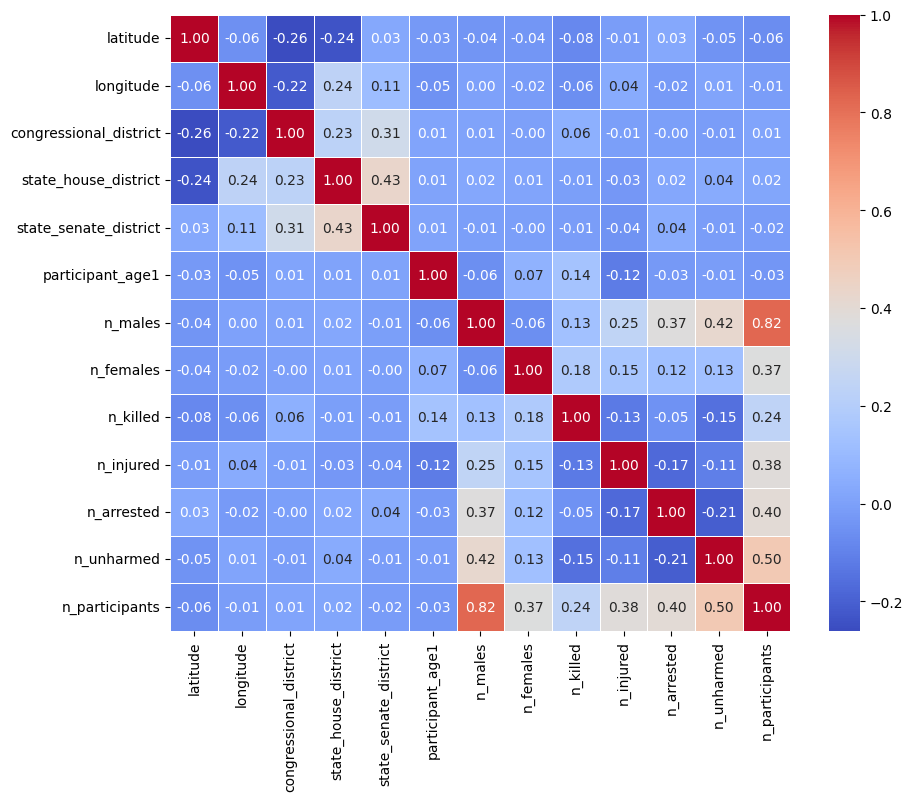

In [ ]:
# Calculate the correlation matrix
correlation_matrix = df_incidents.corr()

# Set up the matplotlib figure
plt.figure(figsize=(10, 8))

# Create a heatmap using Seaborn
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=.5)

# Show the plot
plt.show()

CORRELATION MATRIX OF THE MERGED AND CLEANED DATASET

<ipython-input-9-36c80c2c6409>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = df_final.corr()


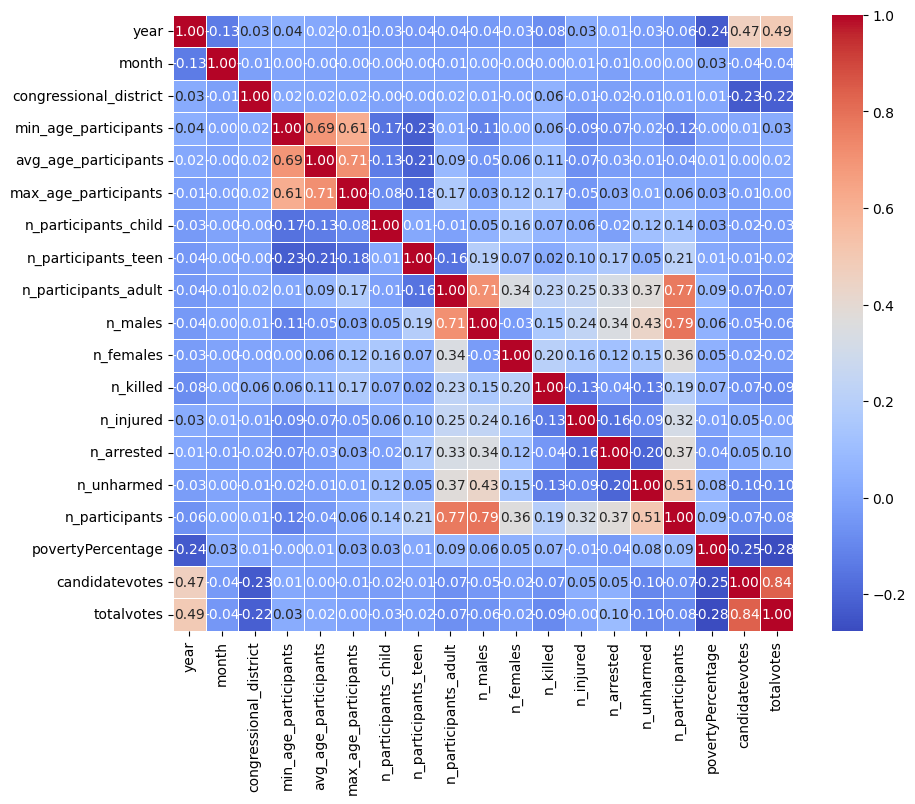

In [ ]:
# Calculate the correlation matrix
correlation_matrix = df_final.corr()

# Set up the matplotlib figure
plt.figure(figsize=(10, 8))

# Create a heatmap using Seaborn
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=.5)

# Show the plot
plt.show()

CORRELATION MATRIX OF THE FEATURE DATASET WITH NaN VALUES FILLED WITH THE MEAN OF EACH COLUMNS

WE DECIDED TO EXCLUDE FROM THE CLUSTERING ANALYSIS THE FEATURES WITH MORE THAN 70% CORRELATION

<ipython-input-78-2b3e499ddaf9>:2: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



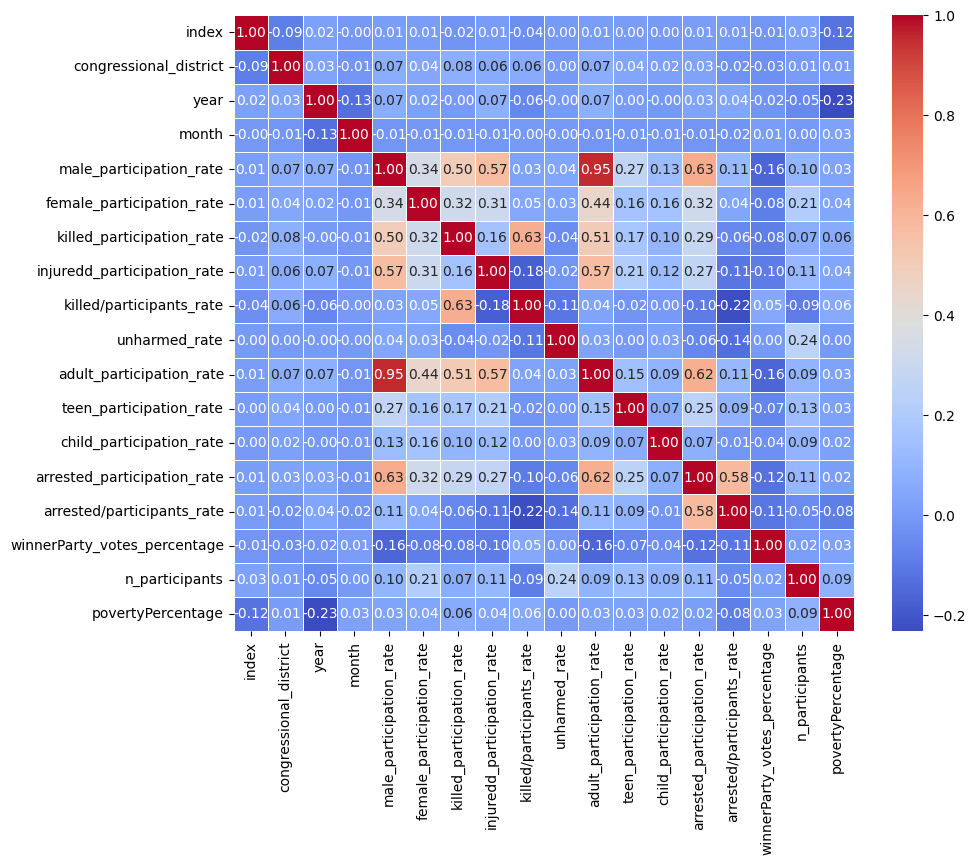

In [ ]:
# Calculate the correlation matrix
correlation_matrix = result_df.corr()

# Set up the matplotlib figure
plt.figure(figsize=(10, 8))

# Create a heatmap using Seaborn
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=.5)

# Show the plot
plt.show()